# **Final Data Analysis Project: Analyzing Gold, Bitcoin, and Rial Trends (2014-2024)**

## **Introduction**

This project utilized a total of 9,411 data points across three key assets: 3,287 Bitcoin daily price records, 2,261 monthly gold prices, and 3,863 daily Rial exchange rates. Bitcoin and Rial data capture daily market fluctuations in granular detail, while gold prices were aggregated monthly due to their relative stability. All datasets were sourced from authoritative references and processed for historical pattern analysis, correlation studies, and volatility calculations. This project provides a comprehensive analysis of the monthly and annual trends of three major assets:

Gold (XAU-USD): Economic Security Index

Bitcoin (BTC-USD): Volatile Digital Asset

Iranian Rial (RIAL-USD): Currency with Severe Inflation Challenge

## **Methodology**

Data:
1.   Yahoo Finance (yfinance)
2.   TGJU (tgju crawl)

Tools:


1.   Python (Pandas, Matplotlib, Scipy)
2.   Calculating averages, volatility, correlations
3.   Time series analysis











## **Install required libraries**

**In this section, we will install the required libraries.**

List of required libraries:


*   Pandas
*   Seaborn
*   Persiantools
*   Yfinance
*   Scipy
*   Tgju_crawl







In [77]:
!pip install pandas
!pip install persiantools
!pip install --upgrade yfinance
!pip install --upgrade scipy
!python3 -m pip install tgju_crawl
!pip insatll seaborn

ERROR: unknown command "insatll" - maybe you meant "install"


# **Calling libraries**

In [78]:
import yfinance as yf
import pandas as pd
import jdatetime
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
from scipy.stats import gmean, hmean, pearsonr, spearmanr
from matplotlib.dates import MonthLocator, DateFormatter
import tgju_crawl as tg
import seaborn as sns
from scipy import stats
from calendar import month_abbr

# **Basic information**

In [79]:
start_date = "2015-01-01"
end_date = "2024-01-01"

# **Preprocessing and preparation of information**

**First, we will download the dataframes in the desired time period.**

In [80]:
main_btc_df = yf.download("BTC-USD", start = start_date, end = end_date)
main_xau_df = yf.download("GC=F", start = start_date, end = end_date)
main_rial_df = tg.get_tgju_data(symbol = 'دلار')

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


**The DataFrames are shown in the output below**

In [81]:
main_btc_df

Price,Close,High,Low,Open,Volume
Ticker,BTC-USD,BTC-USD,BTC-USD,BTC-USD,BTC-USD
Date,,,,,
2015-01-01,314.248993,320.434998,314.002991,320.434998,8036550
2015-01-02,315.032013,315.838989,313.565002,314.079010,7860650
2015-01-03,281.082001,315.149994,281.082001,314.846008,33054400
2015-01-04,264.195007,287.230011,257.612000,281.145996,55629100
2015-01-05,274.473999,278.341003,265.084015,265.084015,43962800
...,...,...,...,...,...
2023-12-27,43442.855469,43683.160156,42167.582031,42518.468750,25260941032
2023-12-28,42627.855469,43804.781250,42318.550781,43468.199219,22992093014


In [82]:
main_xau_df

Price,Close,High,Low,Open,Volume
Ticker,GC=F,GC=F,GC=F,GC=F,GC=F
Date,,,,,
2015-01-02,1186.000000,1194.500000,1169.500000,1184.000000,138
2015-01-05,1203.900024,1206.900024,1180.099976,1180.300049,470
2015-01-06,1219.300049,1220.000000,1203.500000,1203.500000,97
2015-01-07,1210.599976,1219.199951,1210.599976,1219.199951,29
2015-01-08,1208.400024,1215.699951,1206.300049,1207.000000,92
...,...,...,...,...,...
2023-12-22,2057.100098,2068.699951,2052.199951,2055.699951,202
2023-12-26,2058.199951,2060.800049,2054.199951,2060.000000,64


In [83]:
main_rial_df

,Date,Weekday,Open,High,Low,Close,Symbol
J-Date,,,,,,,
1390-09-05,2011-11-26,Saturday,13700,13700,13700,13700,دلار
1390-09-06,2011-11-27,Sunday,13440,13440,13440,13440,دلار
1390-09-07,2011-11-28,Monday,13350,13350,13350,13350,دلار
1390-09-08,2011-11-29,Tuesday,13495,13667,13227,13350,دلار
1390-09-09,2011-11-30,Wednesday,13500,13500,13500,13500,دلار
...,...,...,...,...,...,...,...
1404-01-06,2025-03-26,Wednesday,1018900,1022200,1006800,1019200,دلار
1404-01-07,2025-03-27,Thursday,1018850,1024200,1018800,1021900,دلار
1404-01-09,2025-03-29,Saturday,1036950,1042200,1036800,1038950,دلار


**In this section, we format the DataFrames according to our desired specifications**

In [84]:
# Preprocess yahoo finance dataframes
def yfinance_data(df):
    df['miladi_date'] = pd.to_datetime(df.index)
    df['shamsi_date'] = df['miladi_date'].apply(
        lambda x: jdatetime.date.fromgregorian(date=x).strftime("%Y-%m-%d")
    )
    df = df.reset_index()
    df = df[['miladi_date', 'shamsi_date', 'Close']]
    return df

# Preprocess TGJU finance dataframes
def tgju_date(df, start_date = start_date, end_date = end_date):
    df['shamsi_date'] = df.index
    df['miladi_date'] = df['Date']
    df = df[(df['miladi_date'] >= start_date) & (df['miladi_date'] <= end_date)]
    df['Close'] = 1 / df['Close']
    df = df.reset_index()
    df = df[['miladi_date', 'shamsi_date', 'Close']]
    return df

In [85]:
xau_df = yfinance_data(main_xau_df)
btc_df = yfinance_data(main_btc_df)
rial_df = tgju_date(main_rial_df)

**For better review, we first draw each diagram separately.**

In [86]:
# ِDraw Plot
def draw_plot(df, name):
  plt.plot(df['miladi_date'], df['Close'], label = name)
  plt.xlabel('Date')
  plt.ylabel('Price')
  plt.legend()
  plt.grid(True)
  return plt.show()

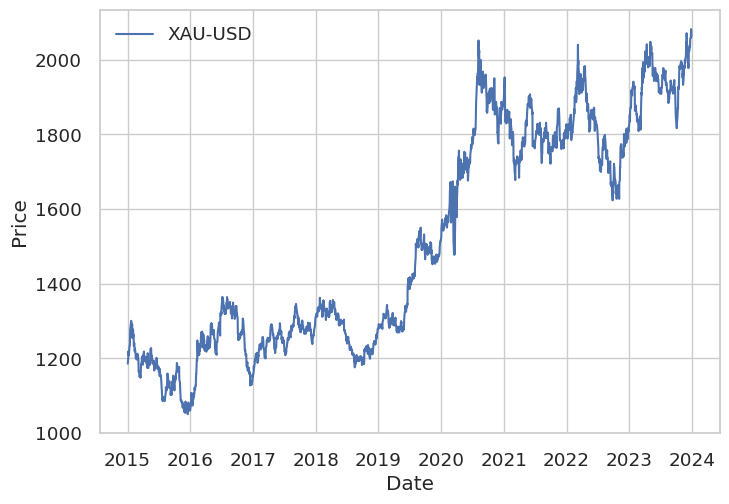

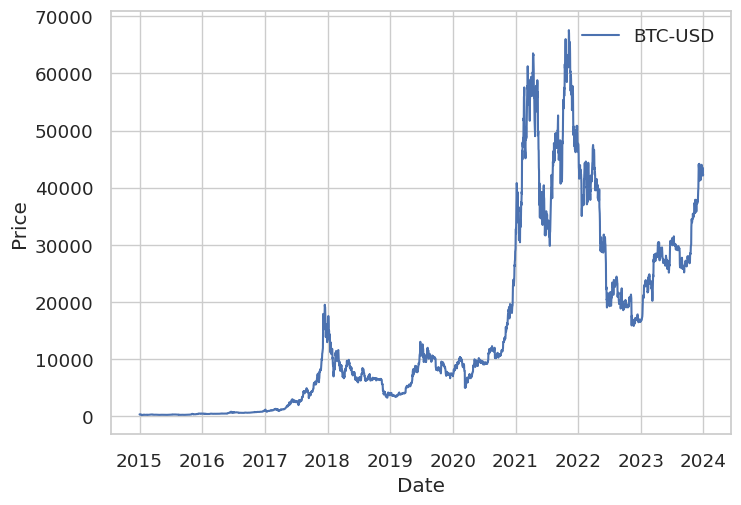

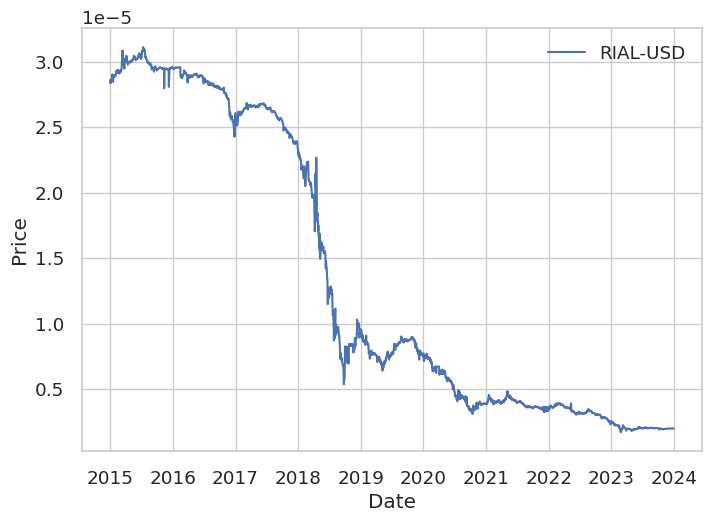

In [87]:
draw_plot(xau_df, "XAU-USD")
draw_plot(btc_df, "BTC-USD")
draw_plot(rial_df, "RIAL-USD")

Overall, the trend of gold and Bitcoin over the past 10 years has been upward, while the value of the Rial has sharply declined during the same period.

## **XAU-USD**
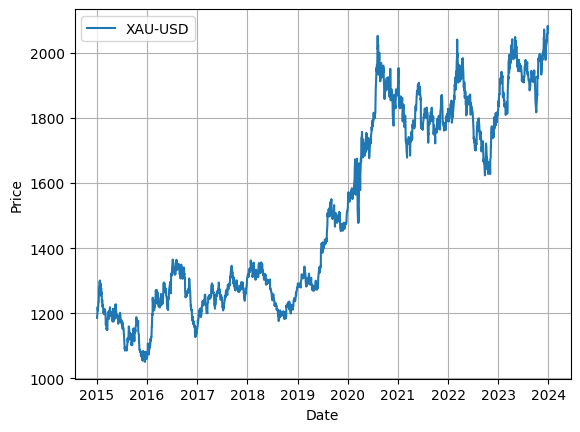

in Gold ,A bullish trend is observed from mid-2018 to mid-2021, as well as another upward trend from mid-2023 to the end of 2024.

## **BTC-USD**
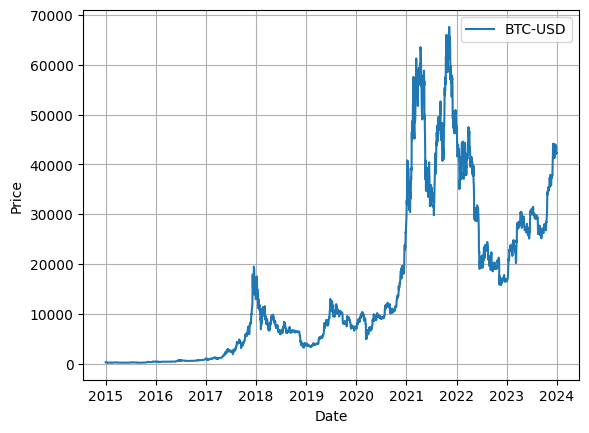

In Bitcoin, there was initially a slow upward trend until 2021. However, from early 2021 to mid-2021, the trend suddenly became extremely bullish. In 2022, it experienced an unprecedented sharp decline. By 2024, the price had fully recovered. Throughout most of 2024, the price remained relatively stable but entered a new upward trend toward the end of the year.

## **RIAL-USD**

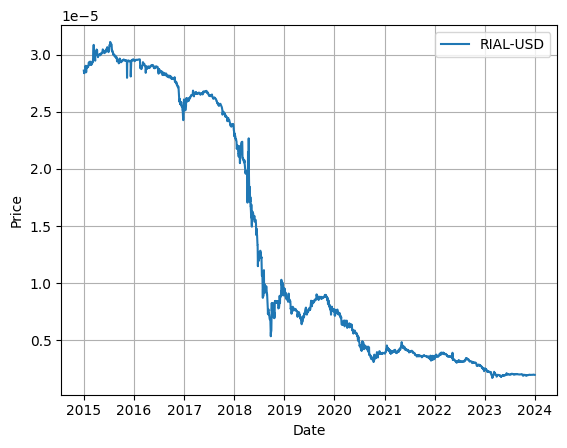



Regarding the Rial, its value has generally been on a downward trend, but from 2018 onward, this decline intensified significantly and continued until late that year. However, initially, the downward trend persisted along its previous trajectory.

**To compare the actual size of the charts, we display all three charts in one image.**

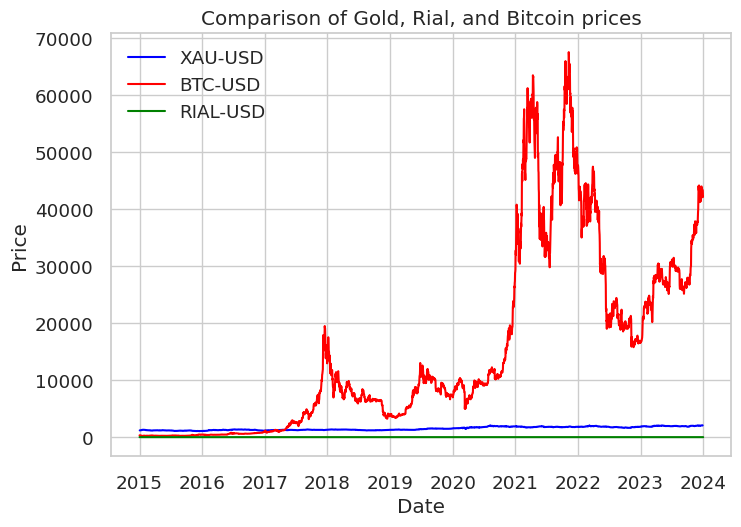

In [88]:
plt.plot(xau_df['miladi_date'], xau_df['Close'], label='XAU-USD', color='blue')
plt.plot(btc_df['miladi_date'], btc_df['Close'], label='BTC-USD', color='red')
plt.plot(rial_df['miladi_date'], rial_df['Close'], label='RIAL-USD', color='green')
plt.title(f"Comparison of Gold, Rial, and Bitcoin prices")
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

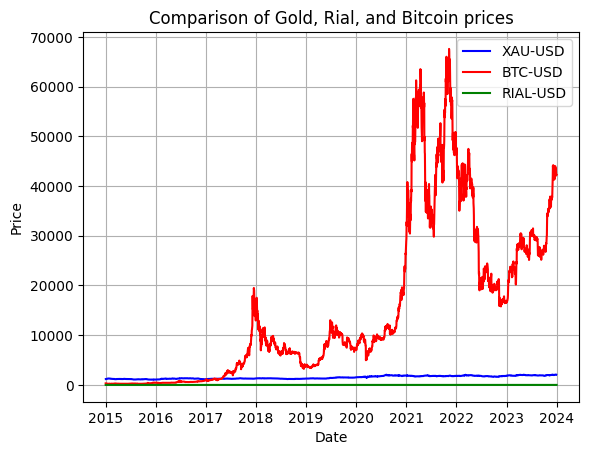

# **Normalize Datas**
**However, none of these charts can lead to any specific conclusion, and they only provide a general comparison of the value per unit of these assets. This shows that Bitcoin's value is significantly higher than the Rial and oil.**

In [89]:
# Normalize Datas
def normalize(series):
    return (series - series.min()) / (series.max() - series.min())

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


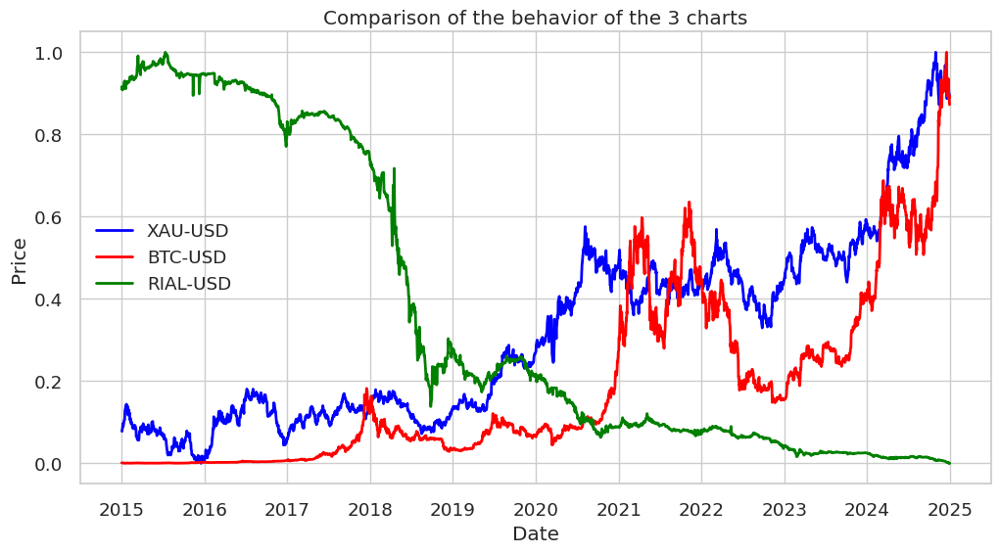

In [90]:
btc_df = yf.download("BTC-USD", start = f"2015-01-01", end = f"2024-12-31")
xau_df = yf.download("GC=F", start = f"2015-01-01", end = f"2024-12-31")
rial_df = tg.get_tgju_data(symbol = 'دلار')
xau_df = yfinance_data(xau_df)
btc_df = yfinance_data(btc_df)
rial_df = tgju_date(rial_df ,f"2015-01-01" , f"2024-12-31")

fig = plt.subplots(figsize=(12, 6))
plt.plot(xau_df['miladi_date'], normalize(xau_df['Close']), label='XAU-USD', linewidth=2, color='blue')
plt.plot(btc_df['miladi_date'], normalize(btc_df['Close']), label='BTC-USD', linewidth=2, color='red')
plt.plot(rial_df['miladi_date'], normalize(rial_df['Close']), label='RIAL-USD', linewidth=2, color='green')
plt.title(f"Comparison of the behavior of the 3 charts")
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

When comparing the overall relationship between the three trends, gold and Bitcoin have followed nearly identical patterns. However, we cannot conclude that Bitcoin can be predicted based on gold's performance, or vice versa. Additionally, it is evident that the Rial has been on a downward trend. What is clear is that after each sharp decline in the Rial, both gold and Bitcoin have experienced sudden upward surges.

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


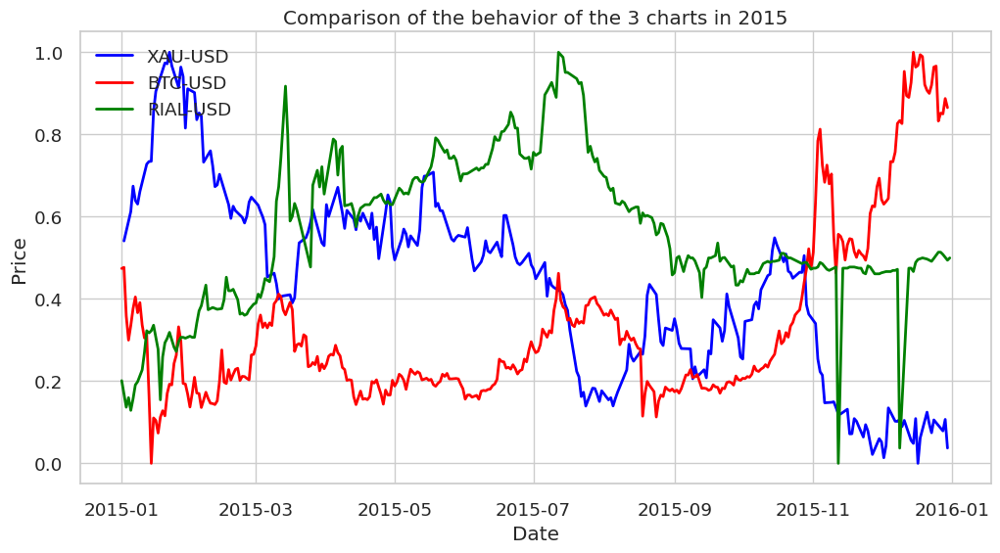

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


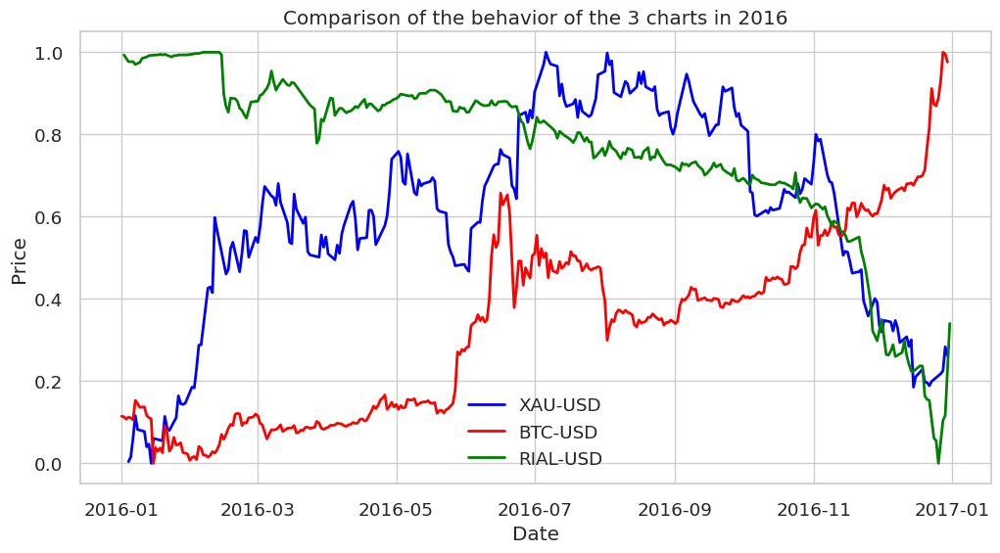

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


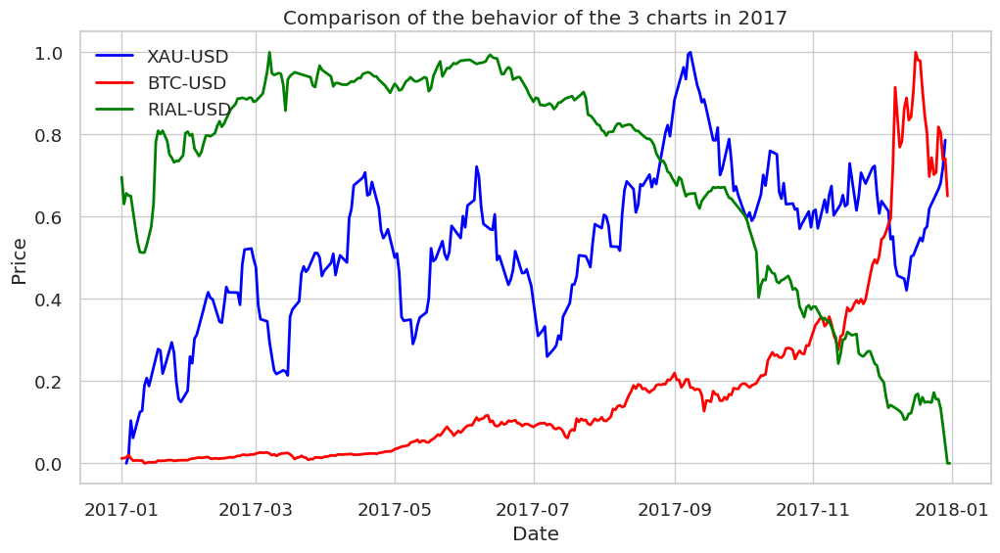

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


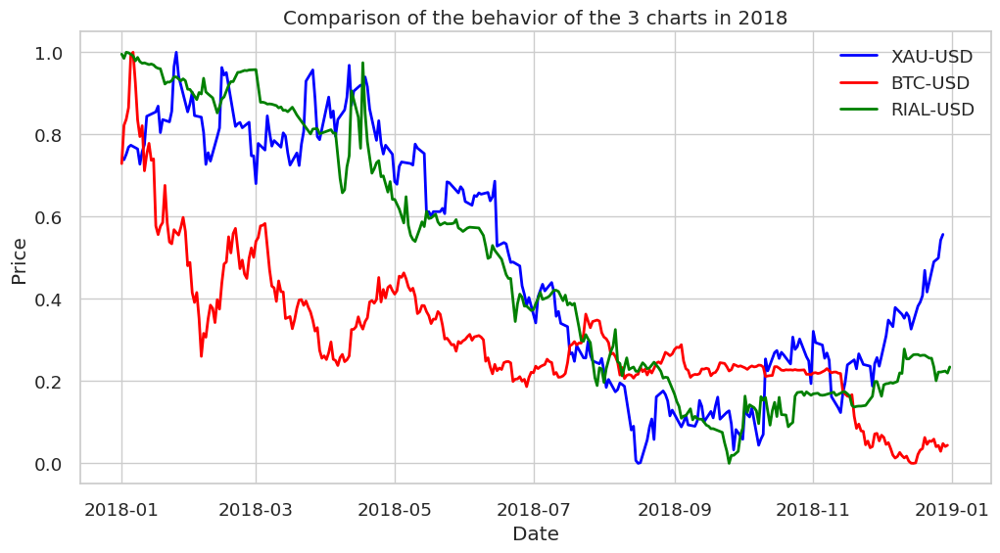

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


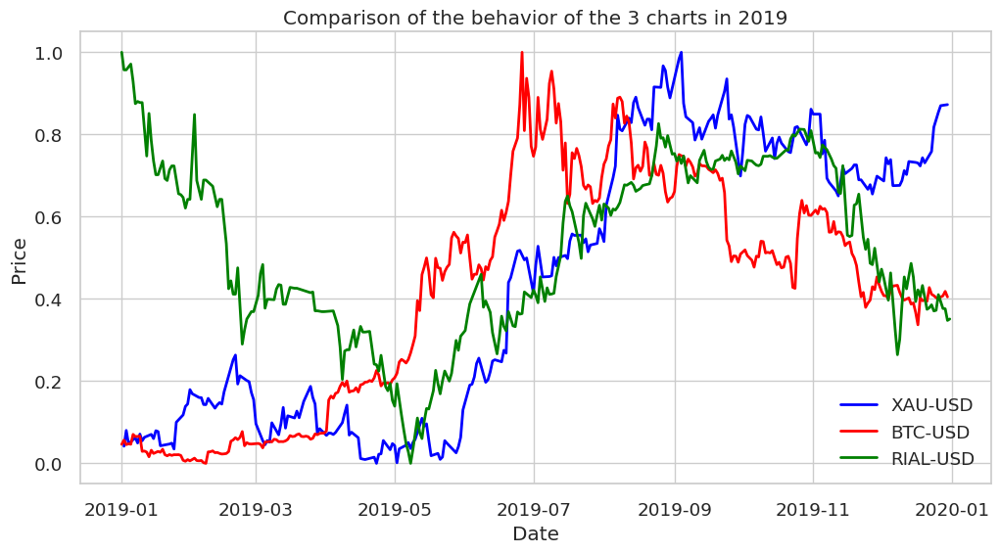

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


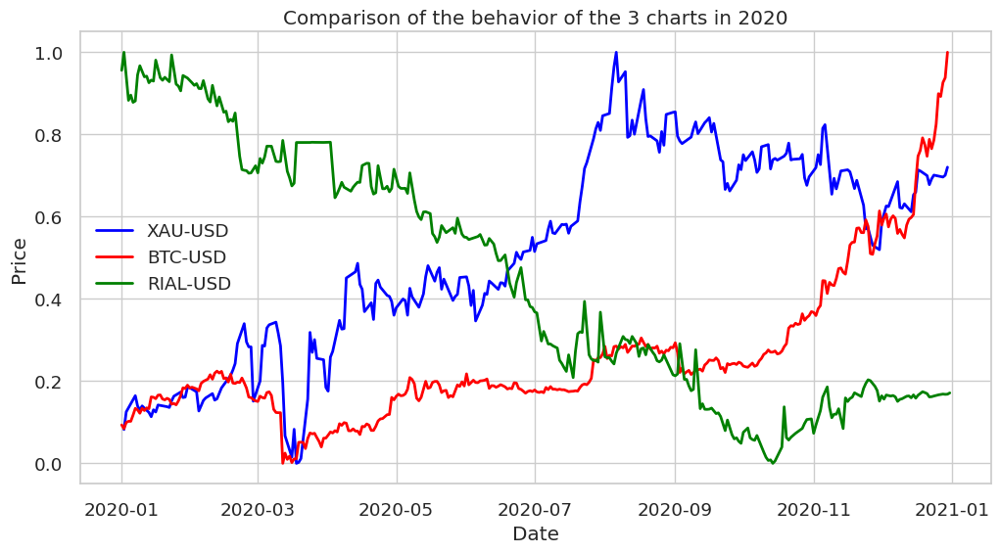

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


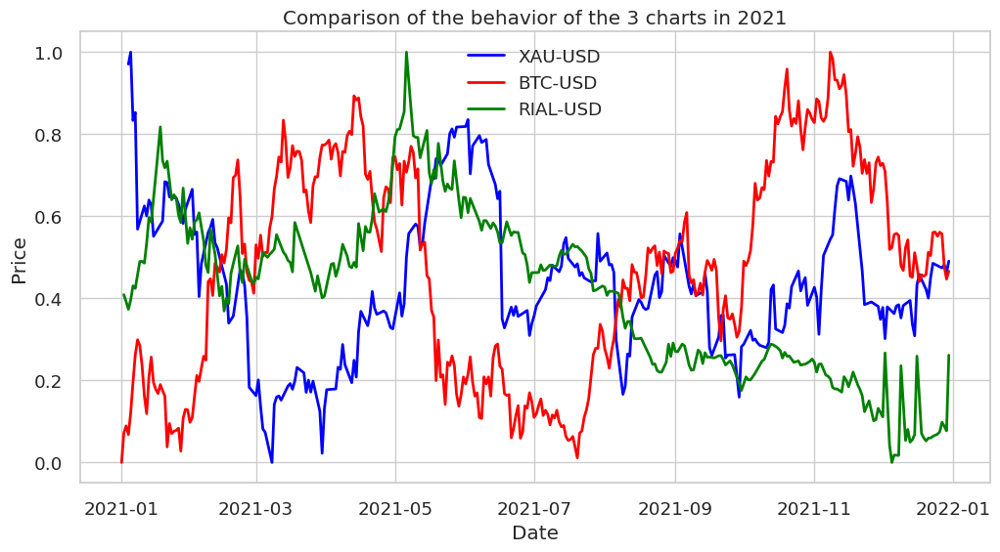

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


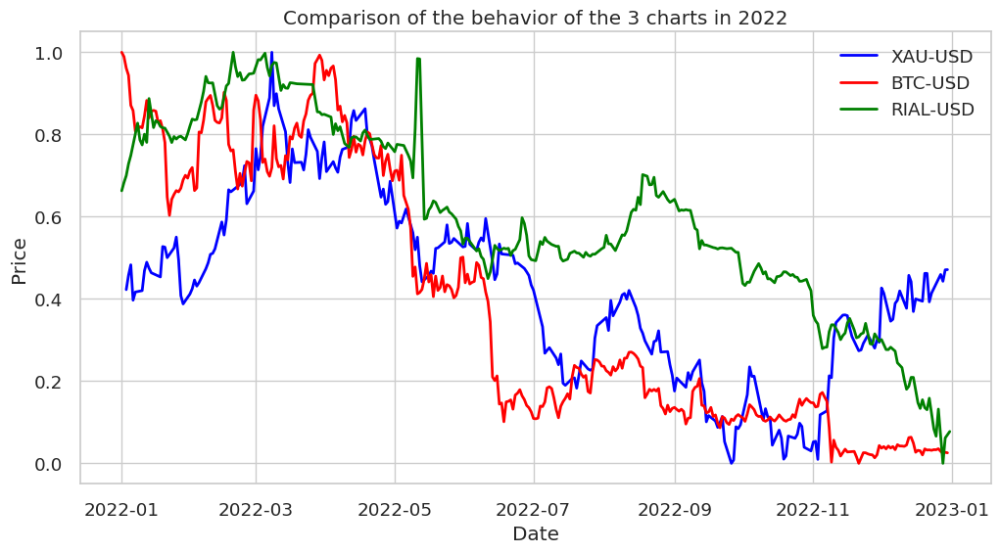

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


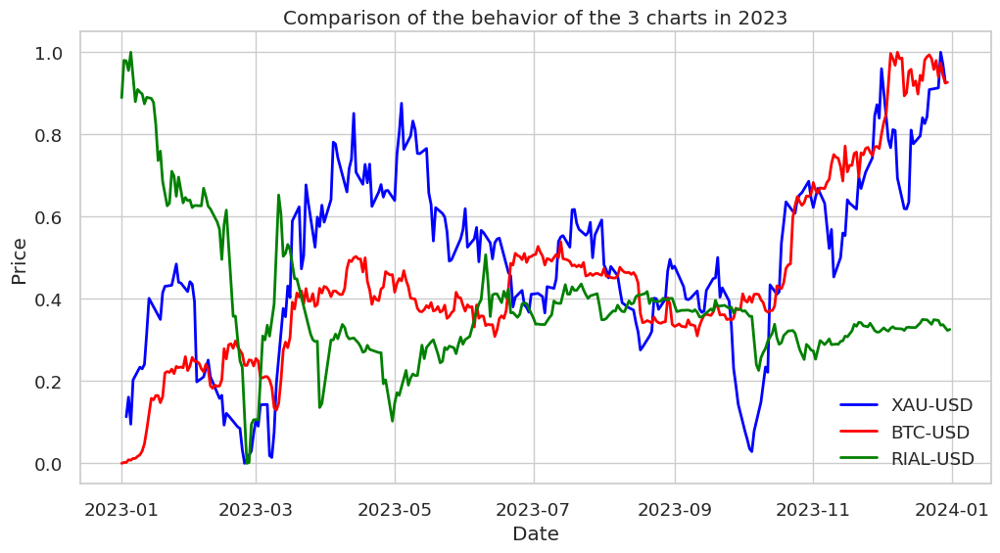

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


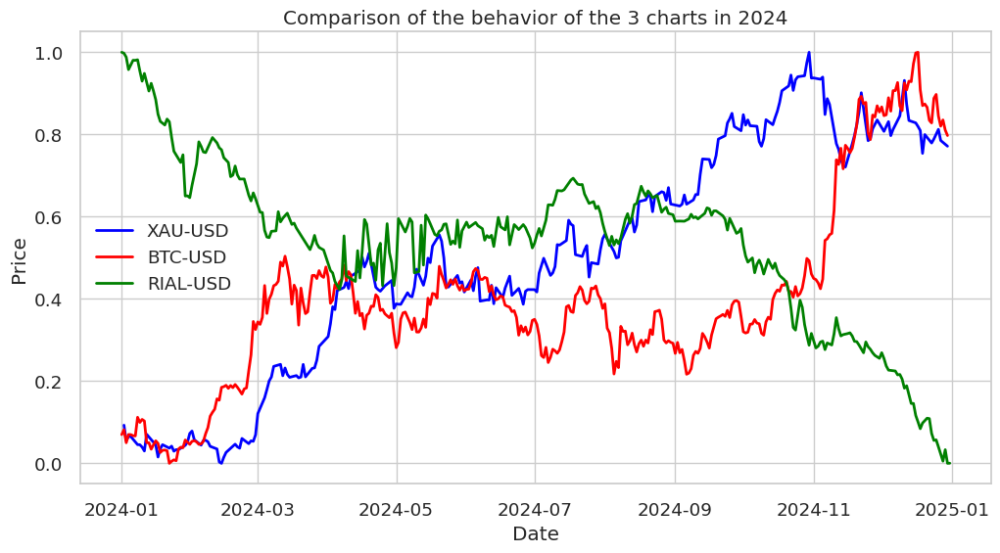

In [91]:
for year in range(2015, 2025):
  btc_df = yf.download("BTC-USD", start = f"{year}-01-01", end = f"{year}-12-31")
  xau_df = yf.download("GC=F", start = f"{year}-01-01", end = f"{year}-12-31")
  rial_df = tg.get_tgju_data(symbol = 'دلار')
  xau_df = yfinance_data(xau_df)
  btc_df = yfinance_data(btc_df)
  rial_df = tgju_date(rial_df ,f"{year}-01-01" , f"{year}-12-31")

  fig = plt.subplots(figsize=(12, 6))
  plt.plot(xau_df['miladi_date'], normalize(xau_df['Close']), label='XAU-USD', linewidth=2, color='blue')
  plt.plot(btc_df['miladi_date'], normalize(btc_df['Close']), label='BTC-USD', linewidth=2, color='red')
  plt.plot(rial_df['miladi_date'], normalize(rial_df['Close']), label='RIAL-USD', linewidth=2, color='green')
  plt.title(f"Comparison of the behavior of the 3 charts in {year}")
  plt.xlabel('Date')
  plt.ylabel('Price')
  plt.legend()
  plt.grid(True)
  plt.show()

**Comparison of behavior of the 3 charts in 2015:** This year, the Rial initially had an upward trend but then turned downward. Gold started with an upward trend but declined by the end of the year. Bitcoin remained stable until September and then entered an upward trend.

**Comparison of behavior of the 3 charts in 2016:** This year, the Rial experienced a consistently downward trend but recovered some of its losses by the end of the year. Bitcoin had a strong upward trend throughout the year, with the rally accelerating mid-year. Gold rose until mid-year but then entered a downward trend.

**Comparison of behavior of the 3 charts in 2017:** This year, gold showed a fluctuating but overall upward trend. The Rial attempted to rise early in the year but then experienced a sharp decline again. Bitcoin maintained a stable trend until September before suddenly surging.

**Comparison of behavior of the 3 charts in 2018:** This year, gold showed a fluctuating yet overall stable trend until April, which continued until October. After a one-month period of stability, it entered an upward trend again.

**Comparison of behavior of the 3 charts in 2019:** This year, gold maintained a stable but fluctuating trend until June, then suddenly entered an upward trend until September, before stabilizing and showing a slightly downward trend for the rest of the year.

**Comparison of behavior of the 3 charts in 2020:** This year, gold showed an upward trend until mid-year, then entered a stable-to-slightly downward trend. Bitcoin remained stable until November before surging sharply in the final month, while the Rial experienced a consistently downward trend throughout the year.

**Comparison of behavior of the 3 charts in 2021:** This year, all three assets showed volatile trends with significant fluctuations.

**Comparison of behavior of the 3 charts in 2022:** This year, all three assets have generally followed a downward trend overall.

**Comparison of behavior of the 3 charts in 2023:** This year, gold has shown a volatile trend with an initial rise, followed by a decline and then another rise. Bitcoin has experienced a gradual upward trend, while the Rial initially plummeted sharply before stabilizing.

**Comparison of behavior of the 3 charts in 2024:** This year, gold showed a consistently upward trend but turned downward in the final month. Bitcoin started with an upward trend in the first month, then stabilized with fluctuations, before resuming an upward trend in the last month. The Rial had a downward trend for the first two months, stabilized afterward, and then entered another downward trend in the last four months.

# **Year-to-year comparison**

**In this section, we calculate and compare the arithmetic mean, geometric mean, harmonic mean, median, and mode. Then, we compute the EMA (Exponential Moving Average) and SMA (Simple Moving Average) for each DataFrame and display the results. Finally, we plot all three DataFrames together for visual comparison.**

In [92]:
# Mean, GMean, Hmean, Median & Mode Calculator
def mmm(df):
  mean_values = df['Close'].mean()
  gmean_values = gmean(pd.to_numeric(rial_df['Close'], errors='coerce').replace(0, np.nan).dropna()) if not rial_df.empty and (pd.to_numeric(rial_df['Close'], errors='coerce') > 0).any() else "No valid data"
  hmean_values = hmean(df['Close'])
  median_values = df['Close'].median()
  mode_values = df['Close'].mode()
  return mean_values, gmean_values, hmean_values, median_values, mode_values

# EMA & SMA Calculator
def EMASMA(df):
  df['SMA_30'] = df['Close'].rolling(window=30).mean()
  df['EMA_30'] = df['Close'].ewm(span=30, adjust=False).mean()
  return df

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


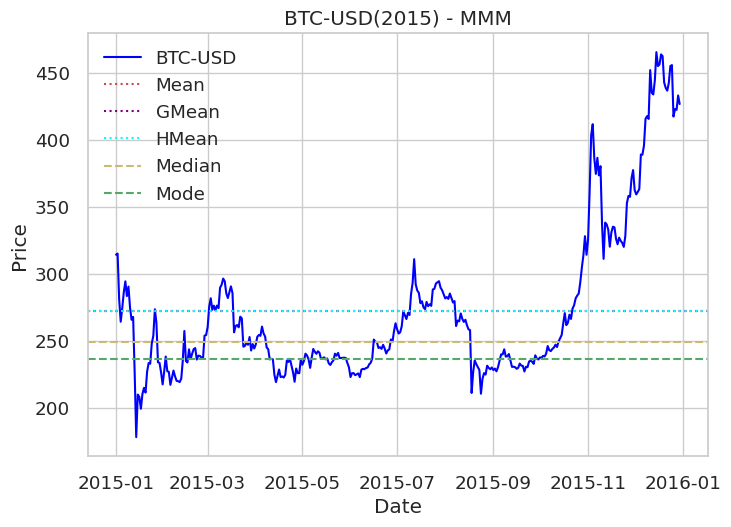

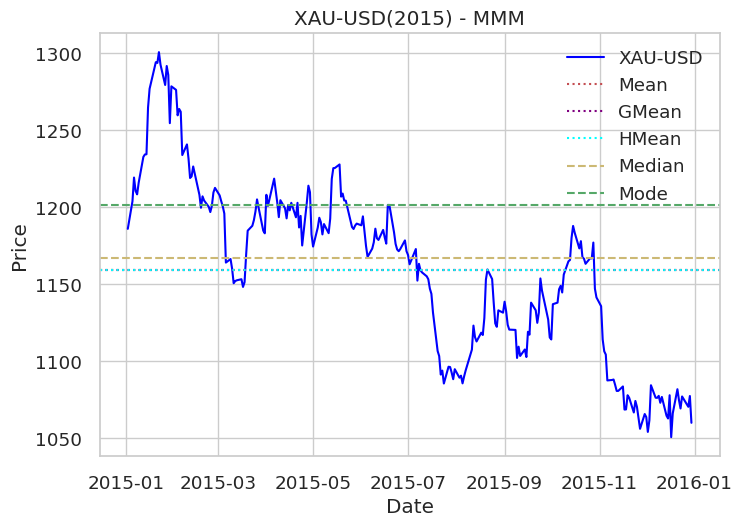

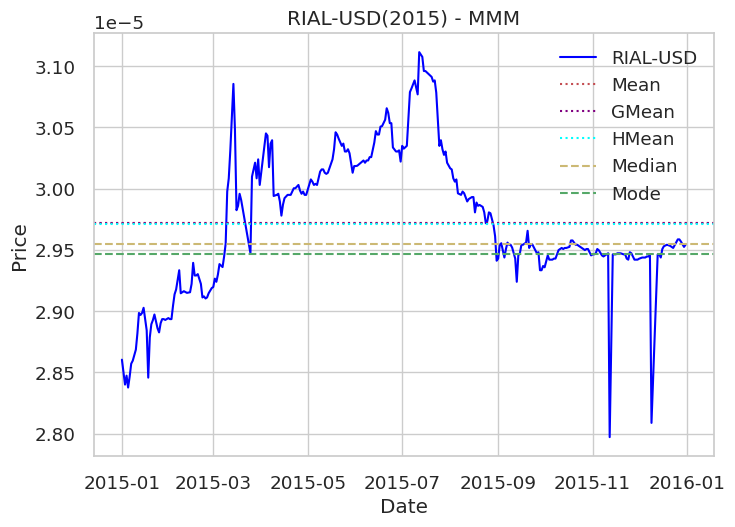

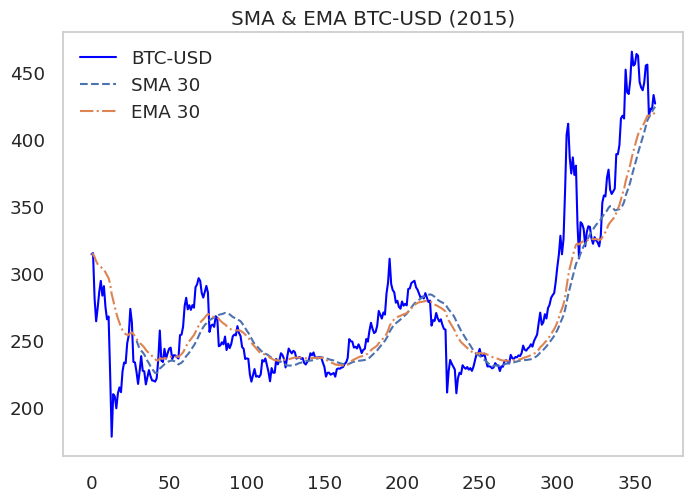

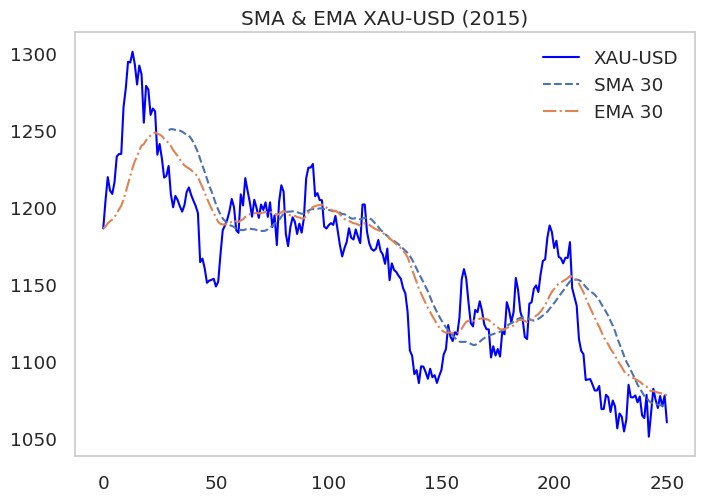

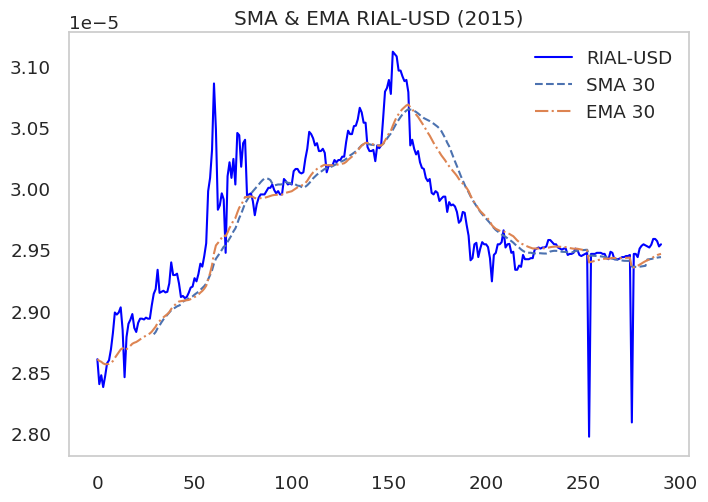

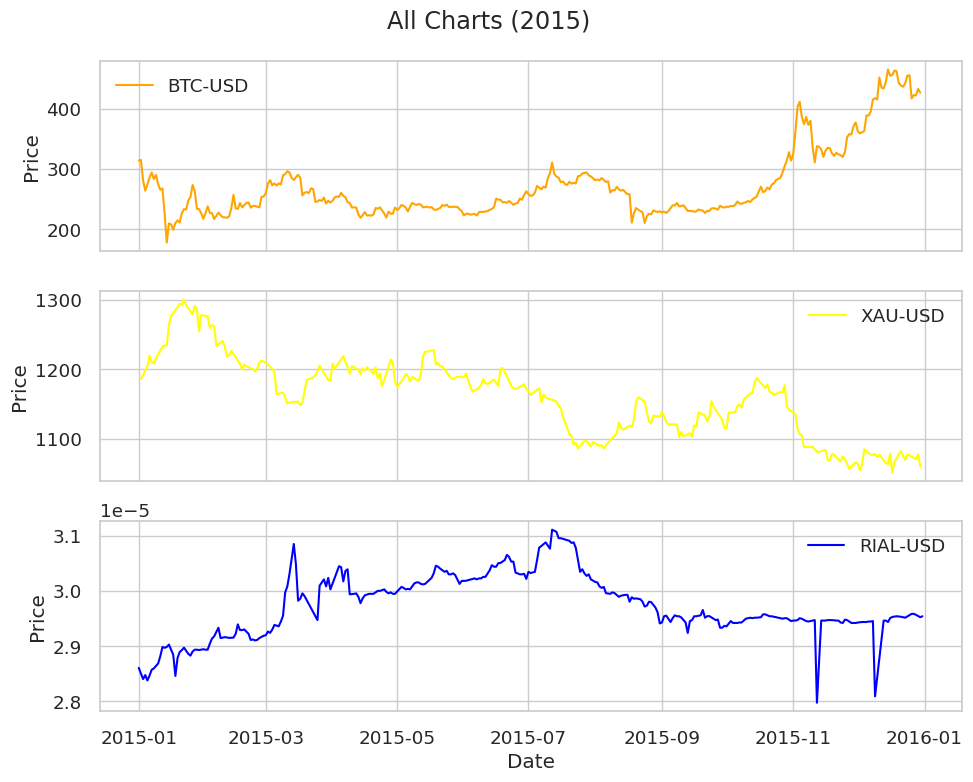

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


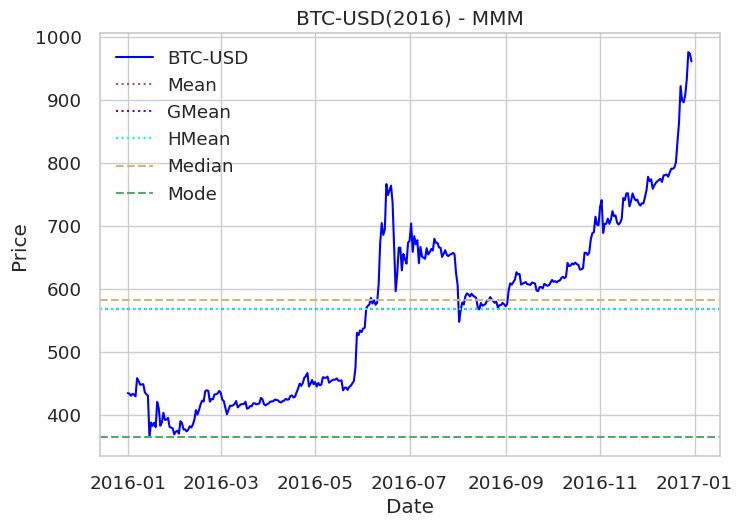

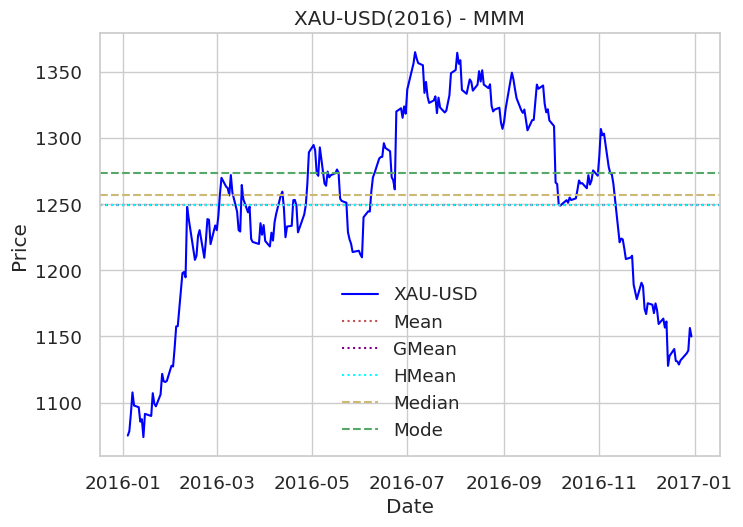

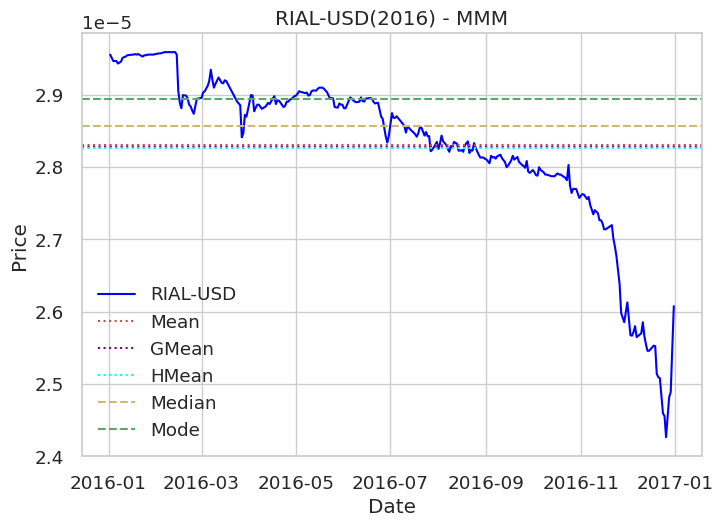

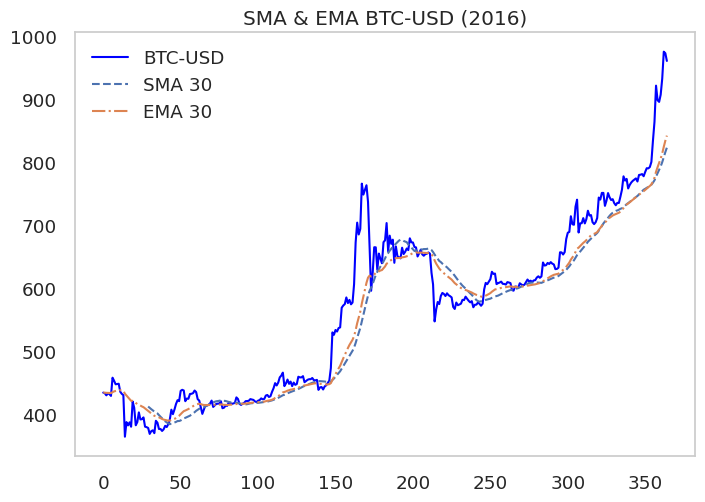

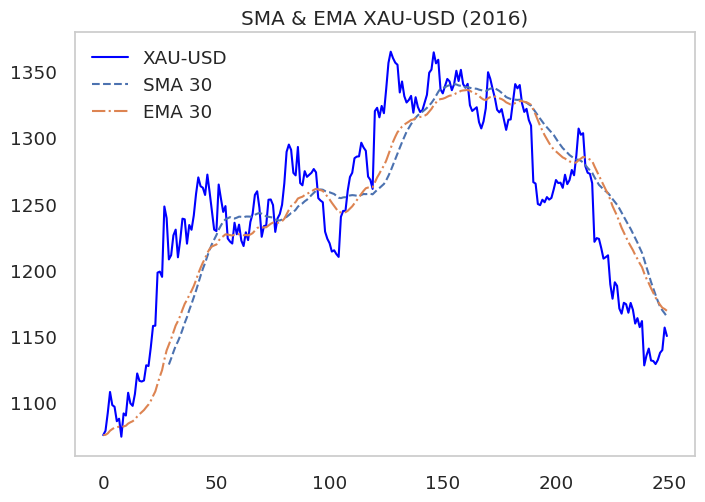

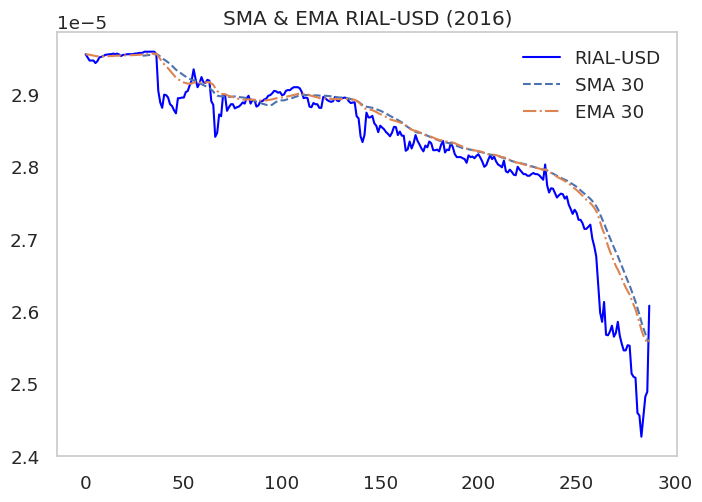

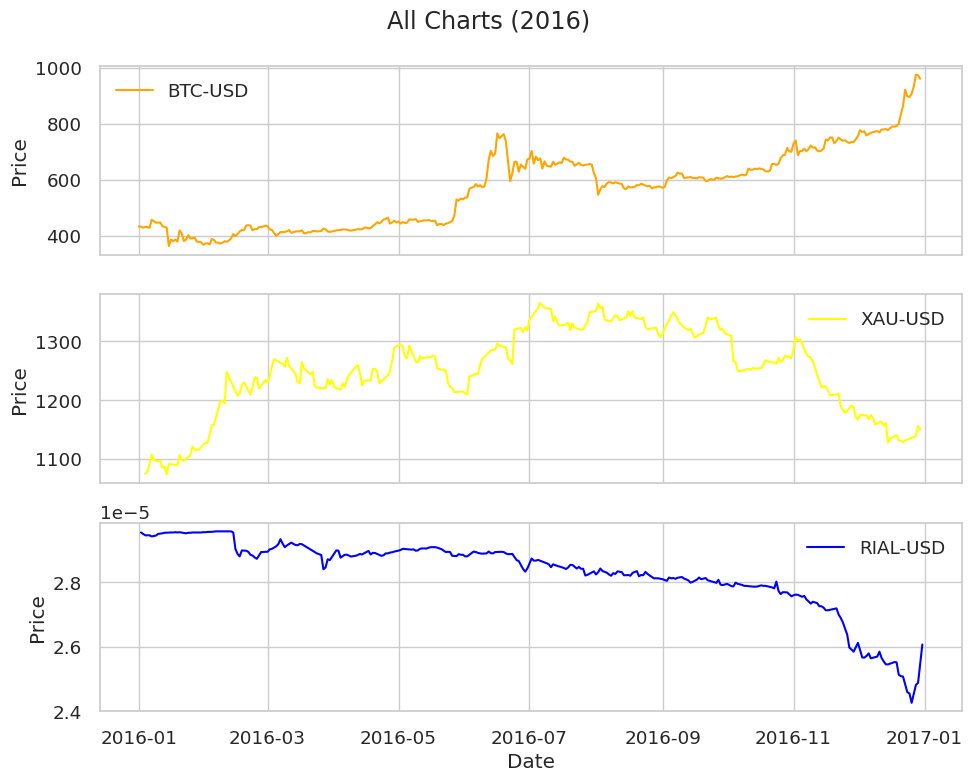

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


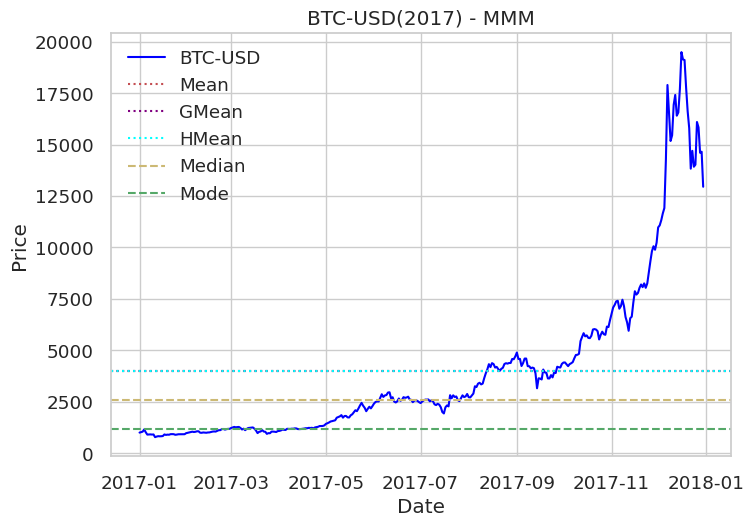

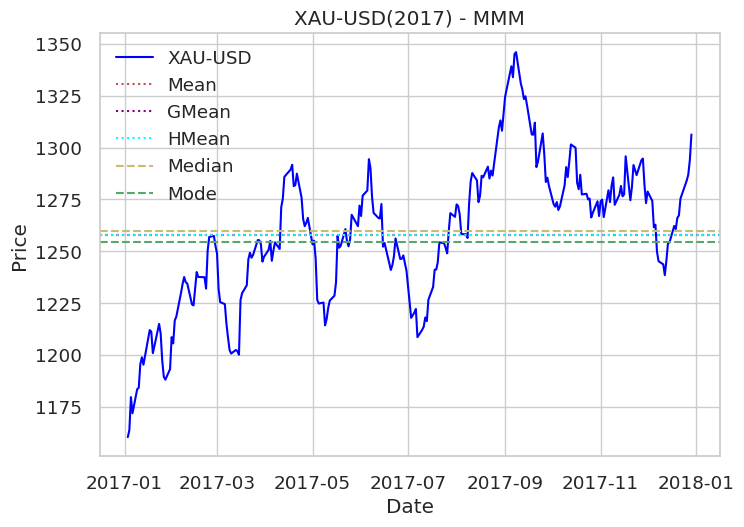

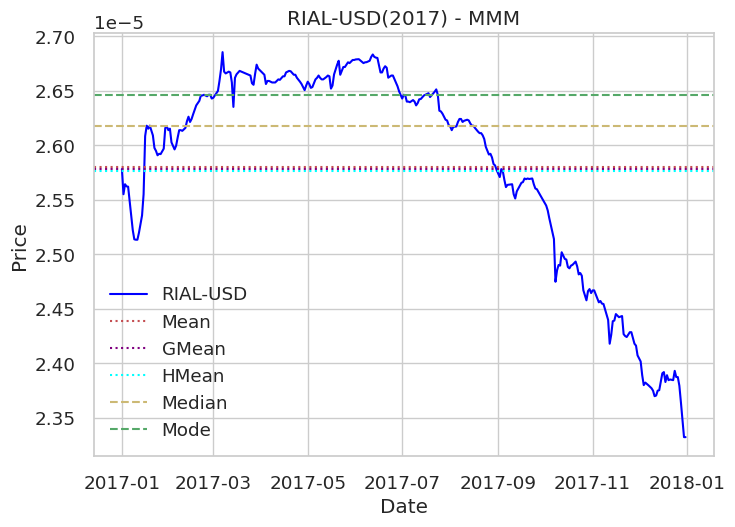

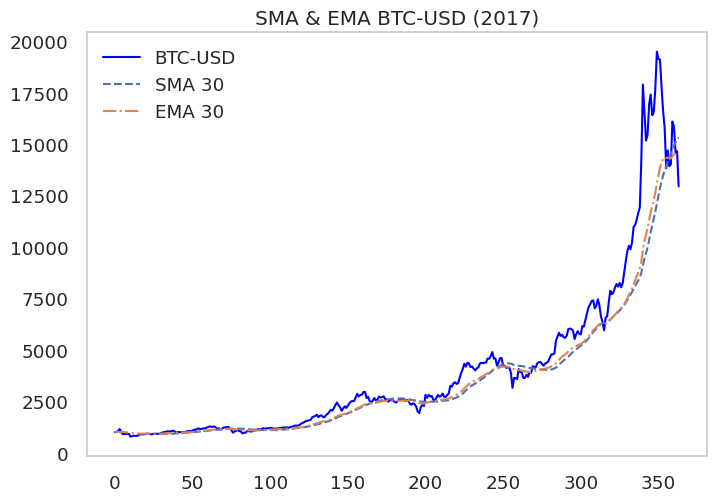

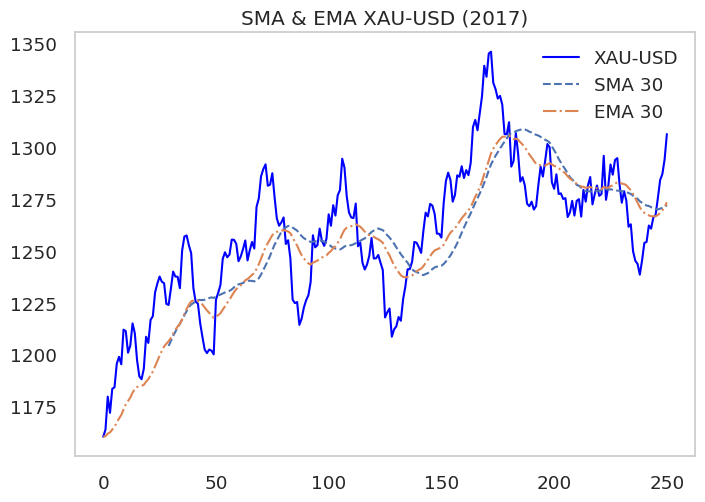

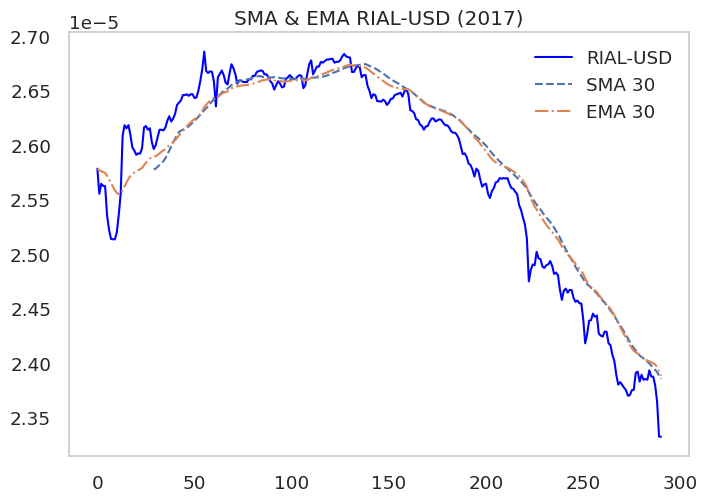

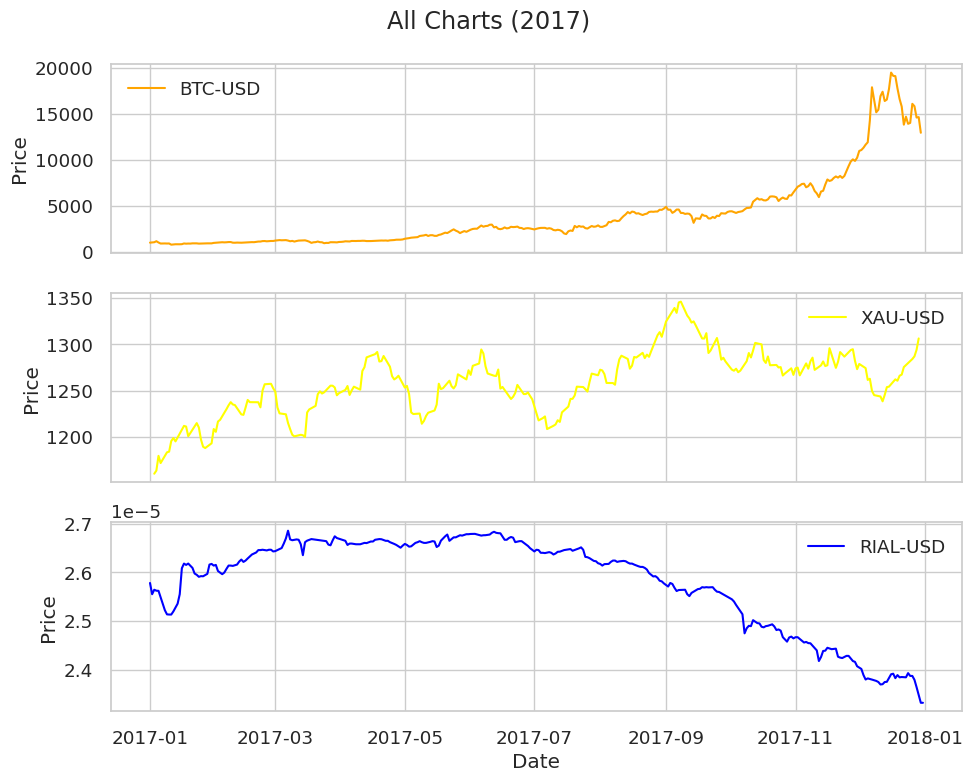

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


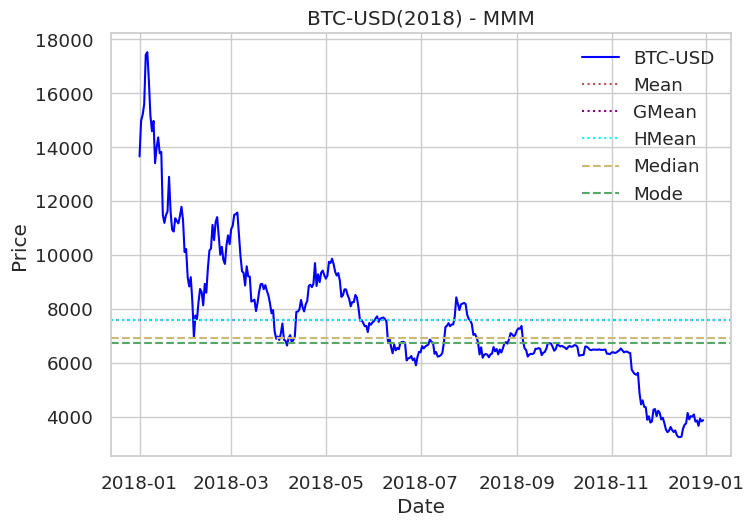

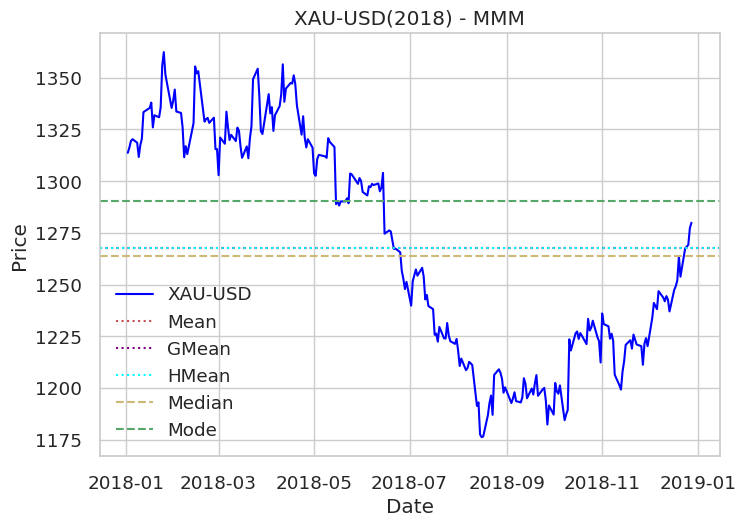

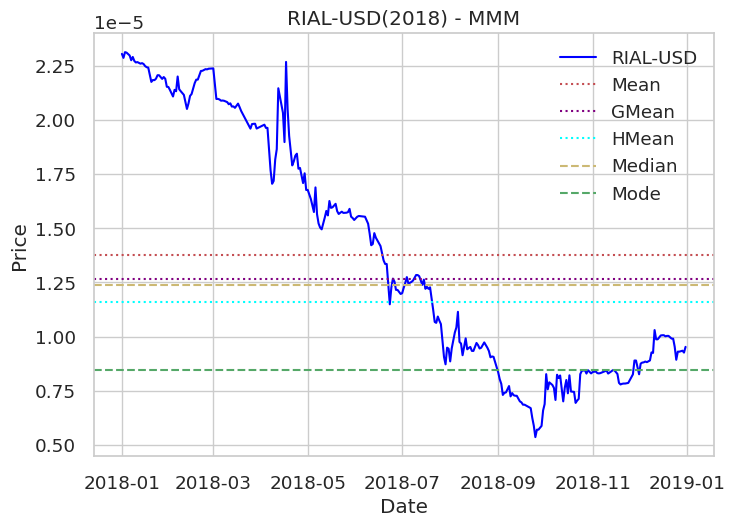

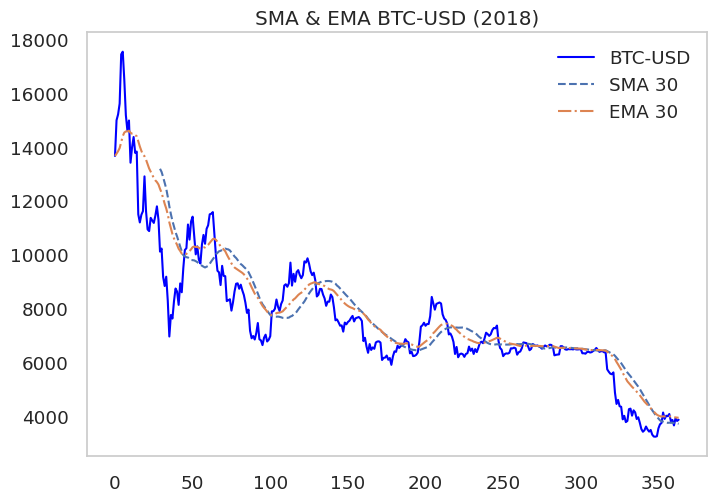

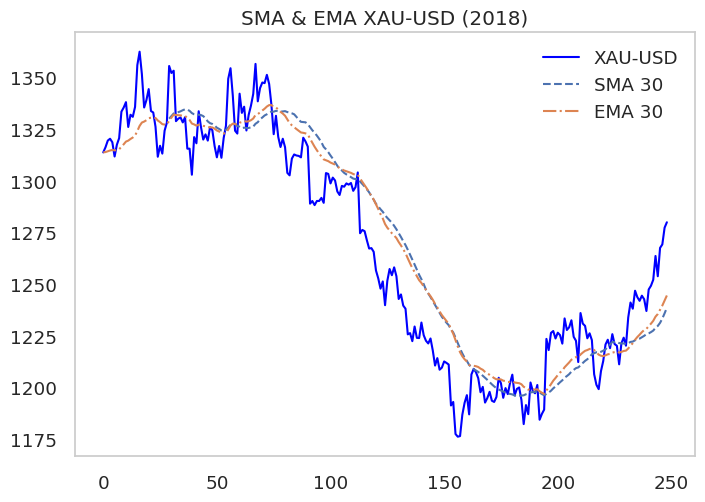

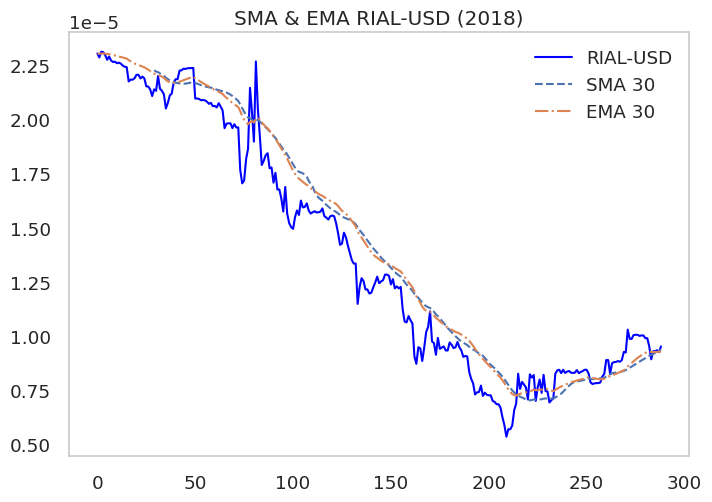

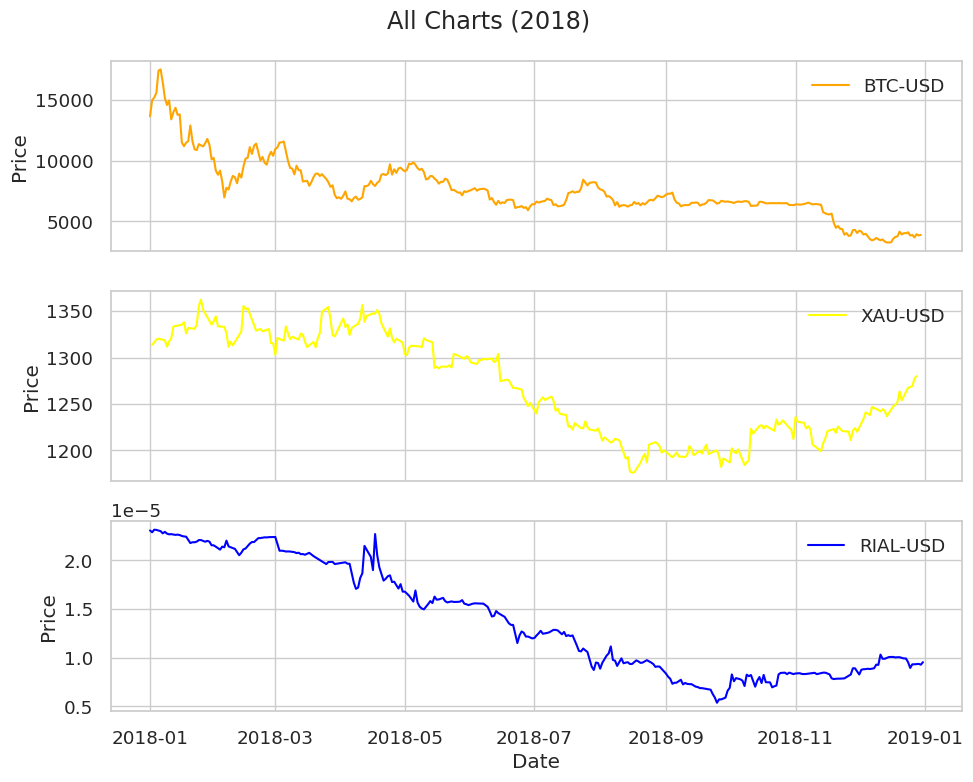

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


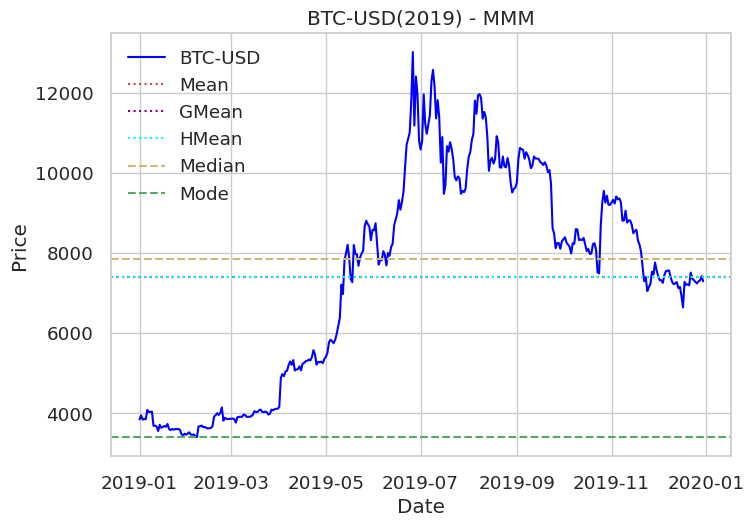

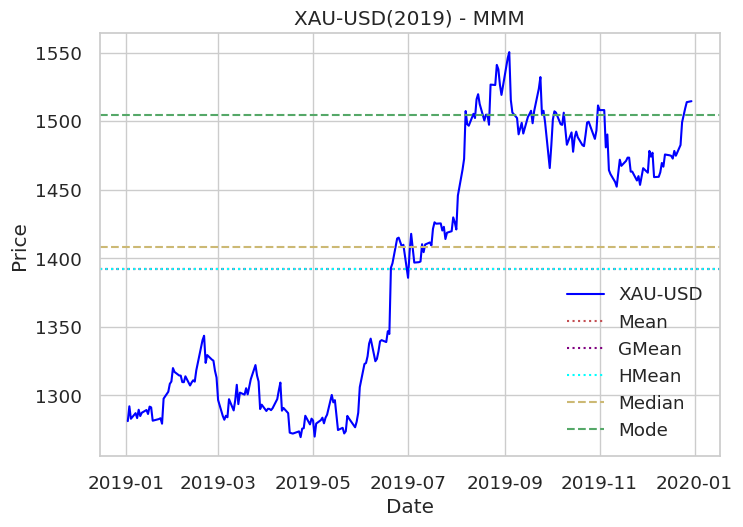

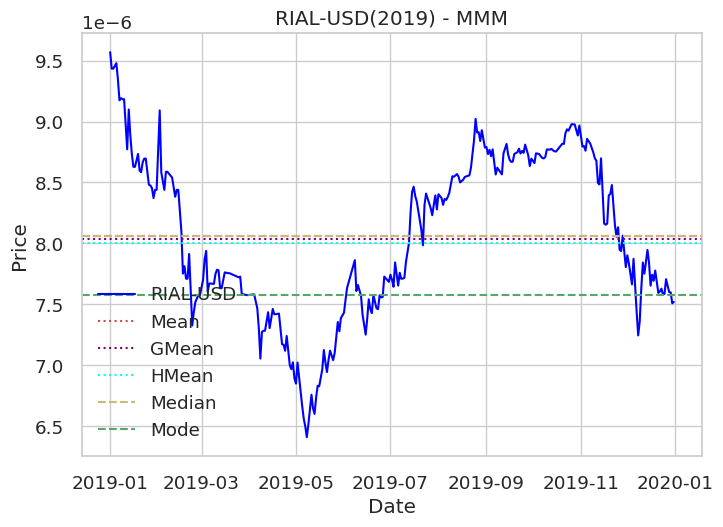

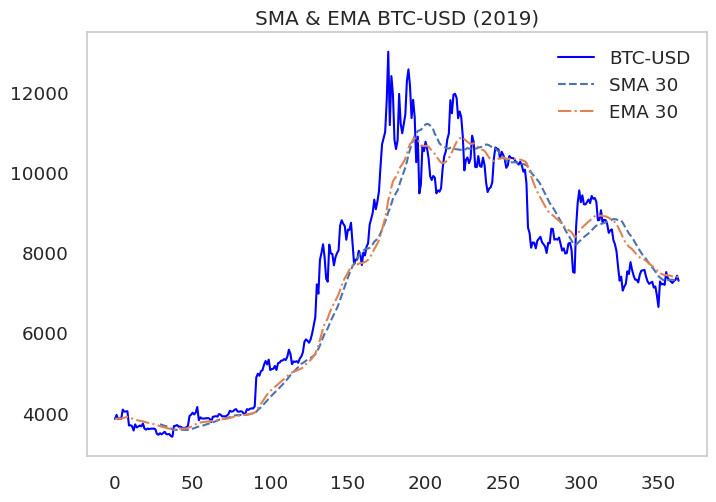

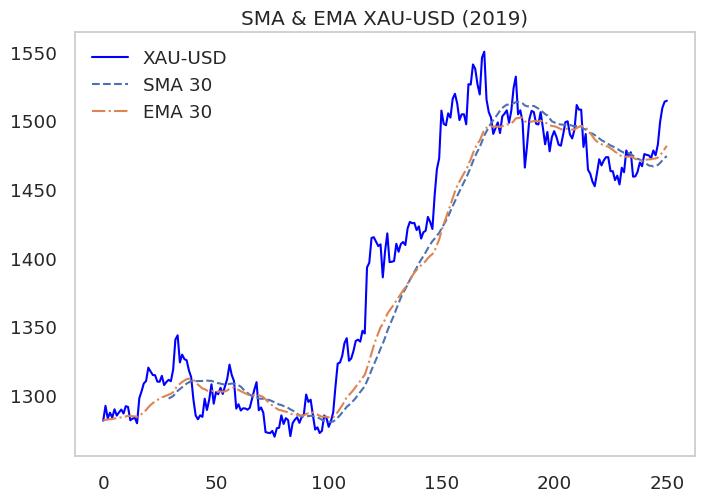

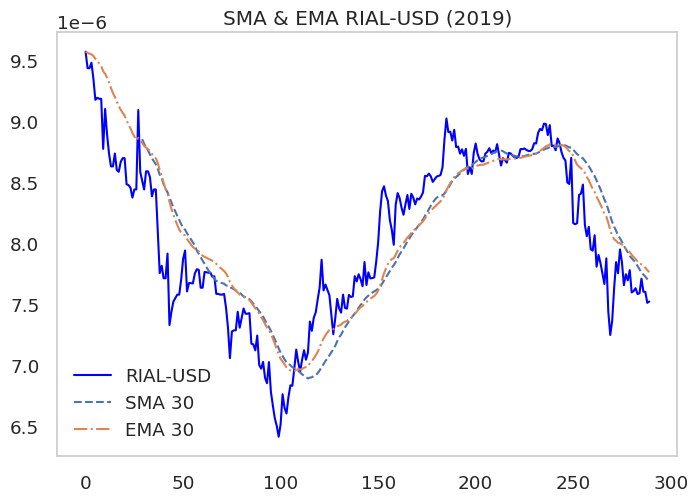

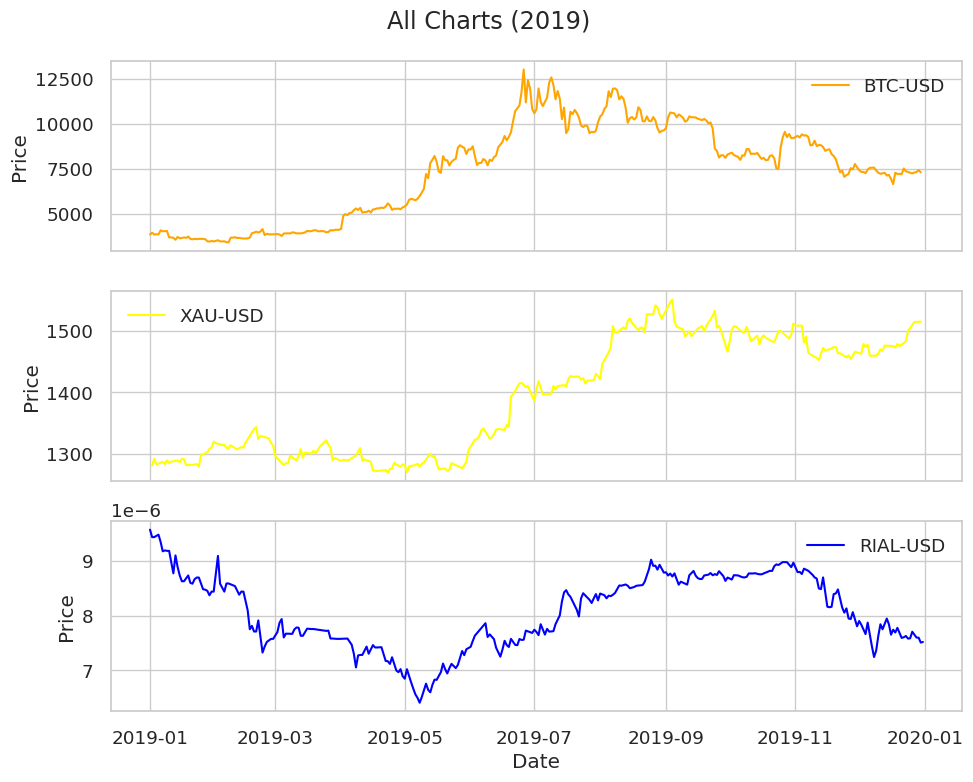

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


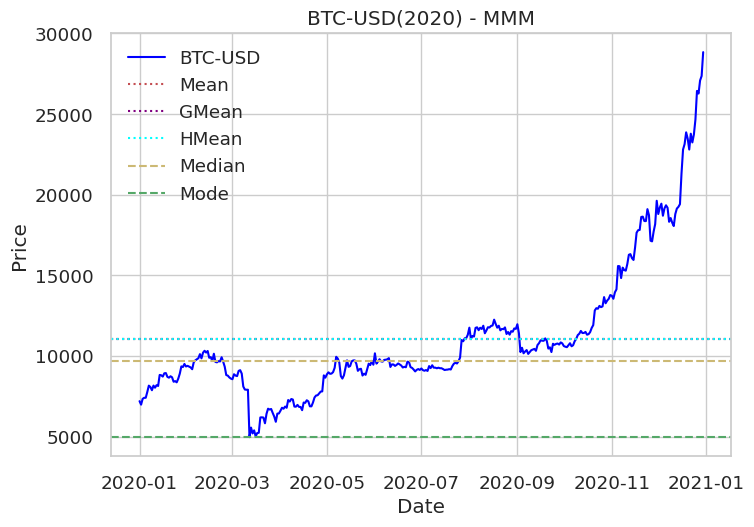

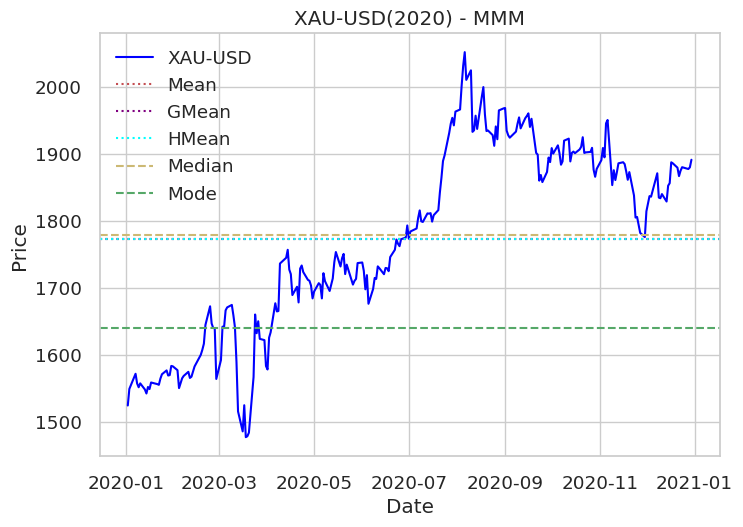

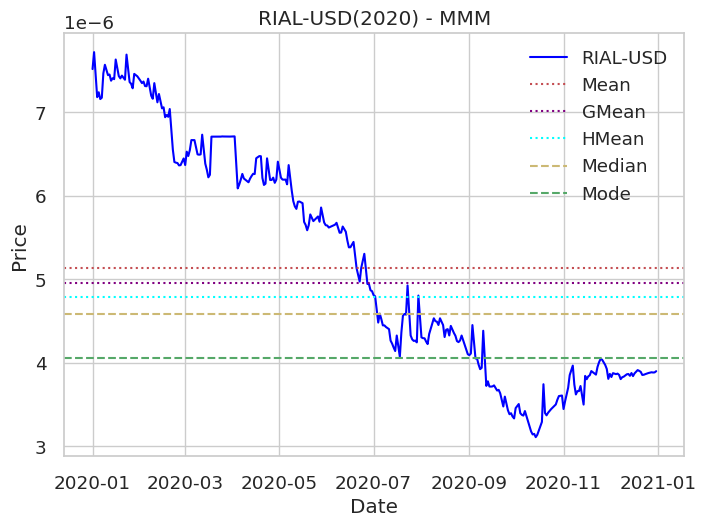

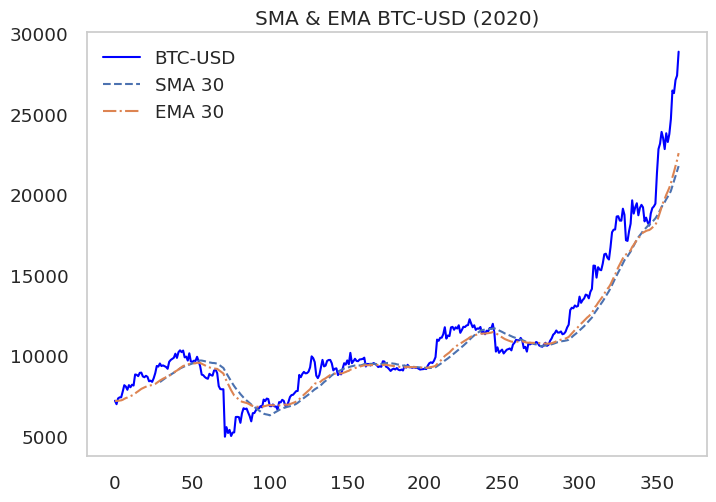

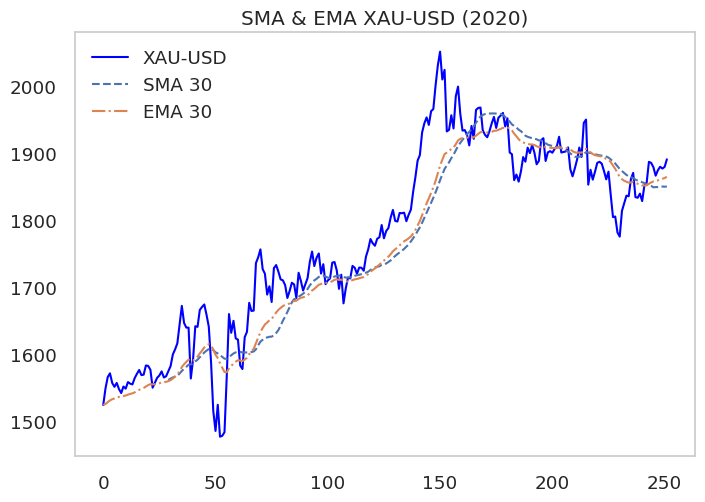

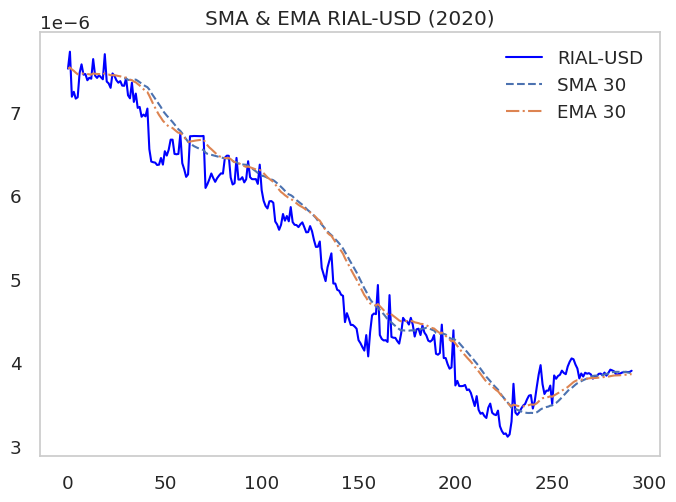

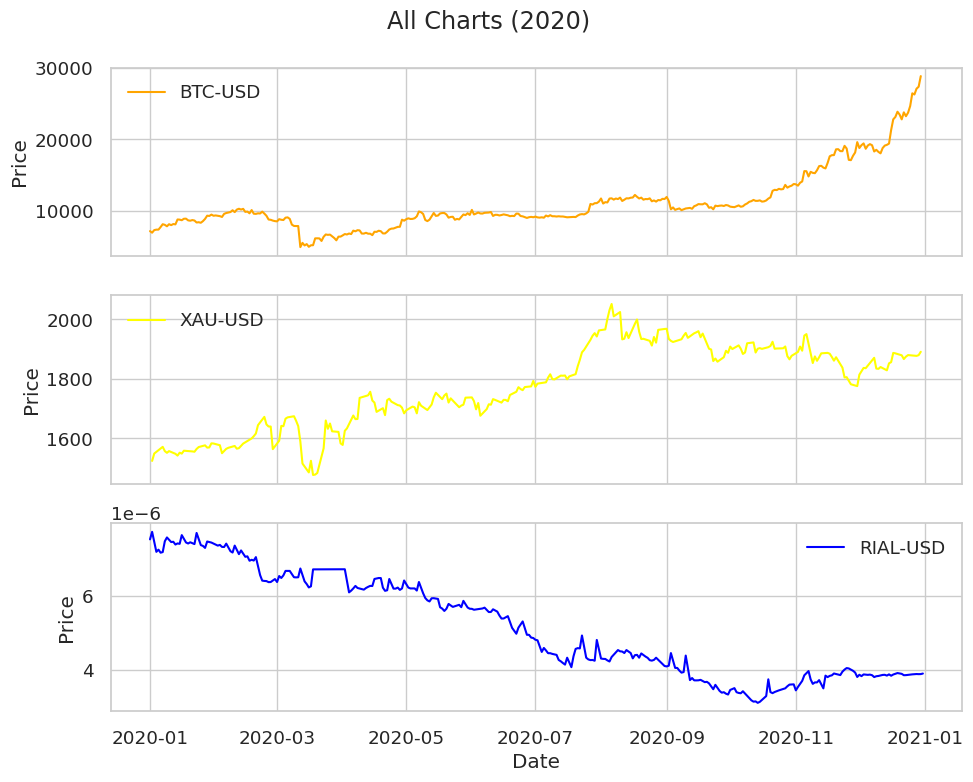

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


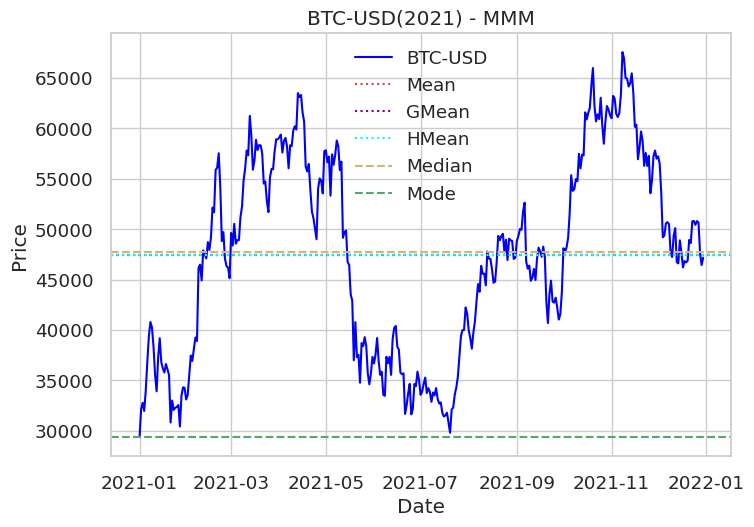

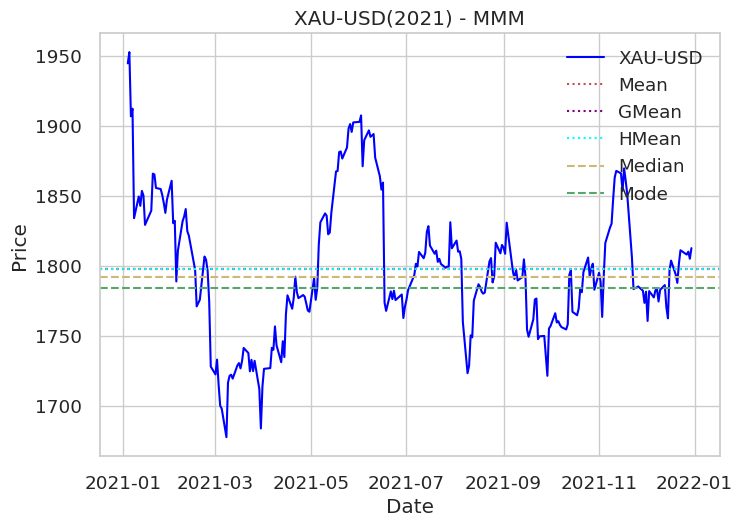

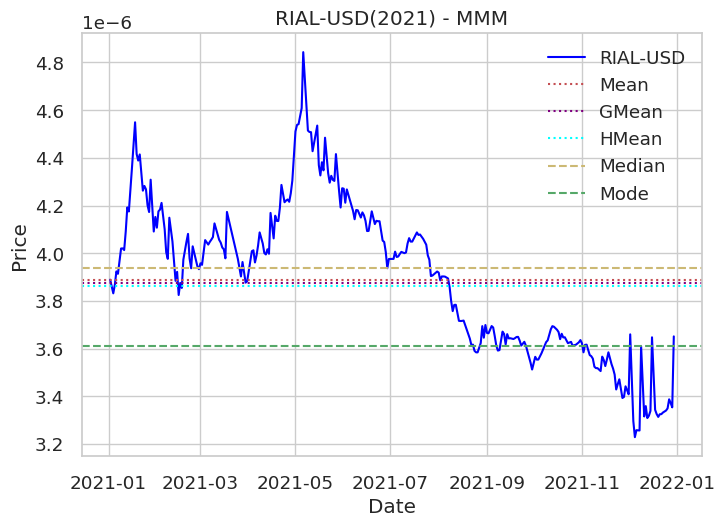

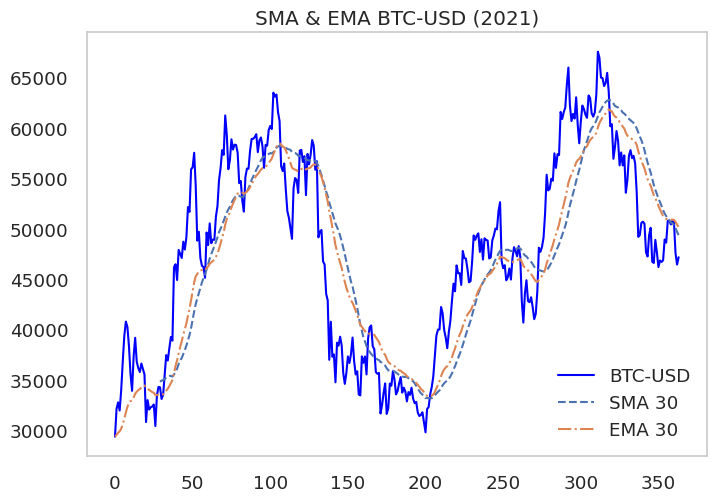

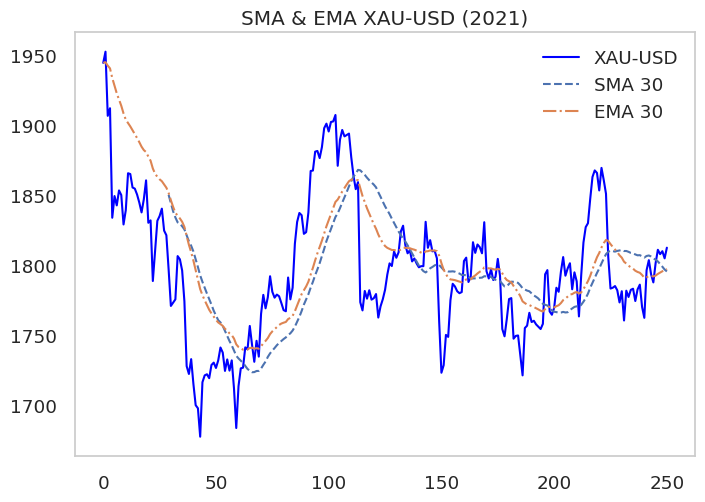

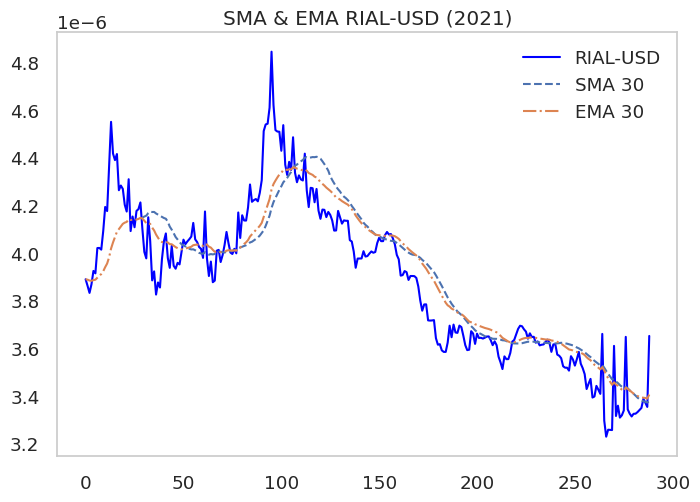

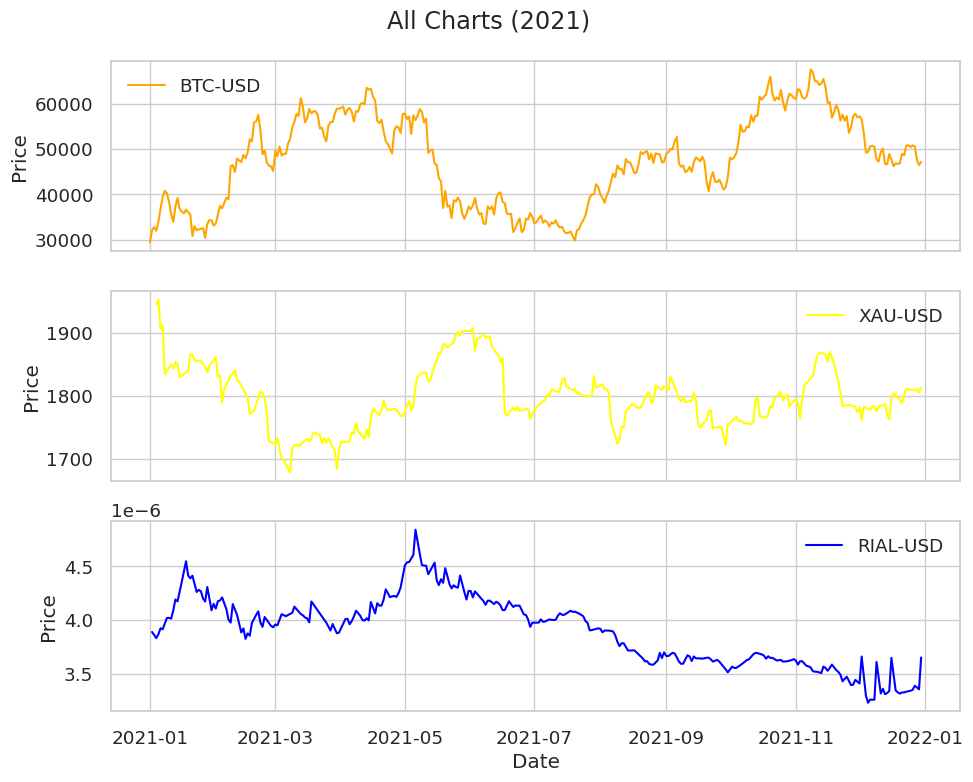

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


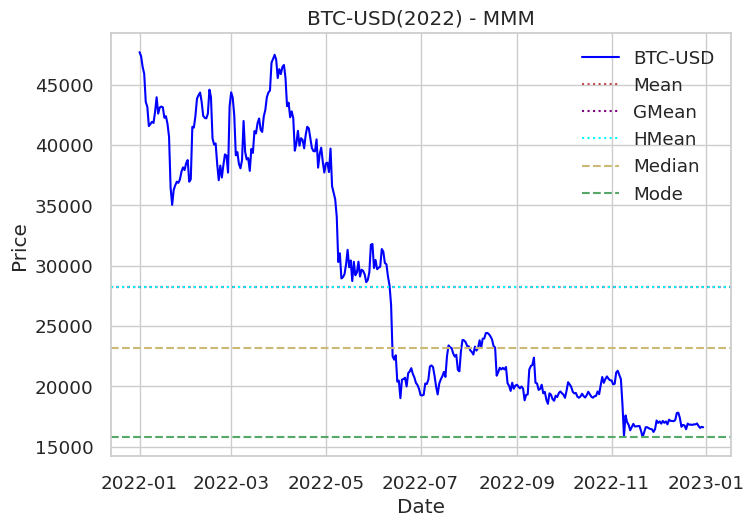

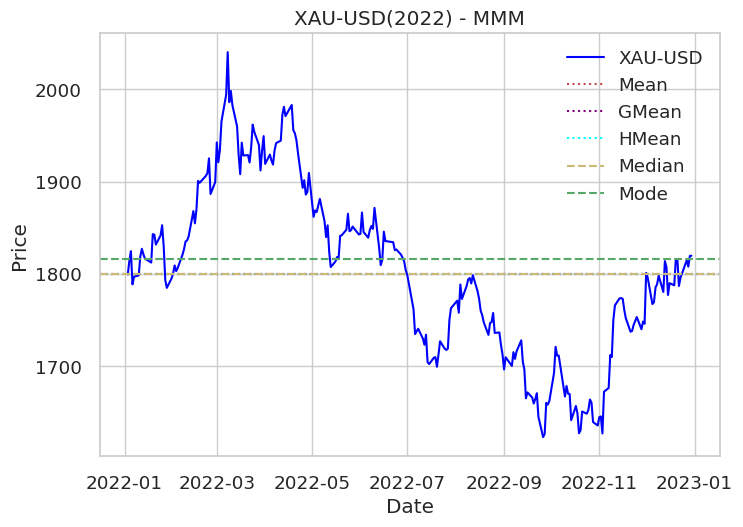

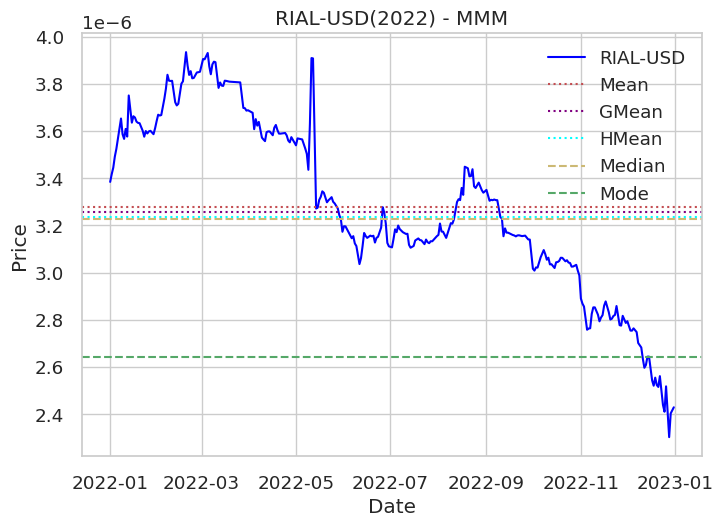

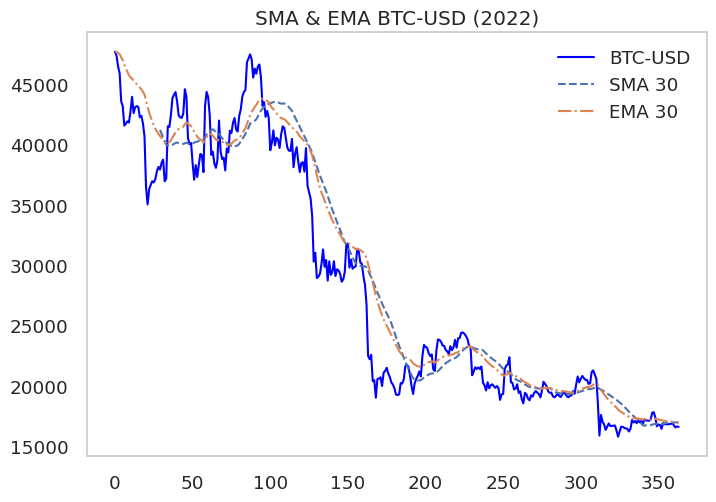

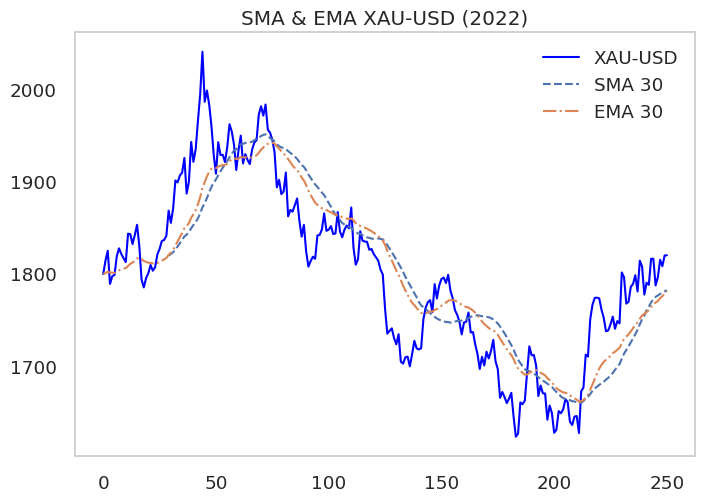

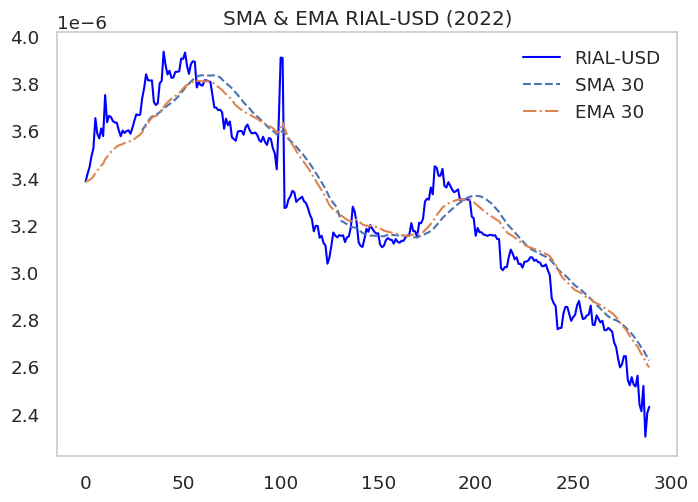

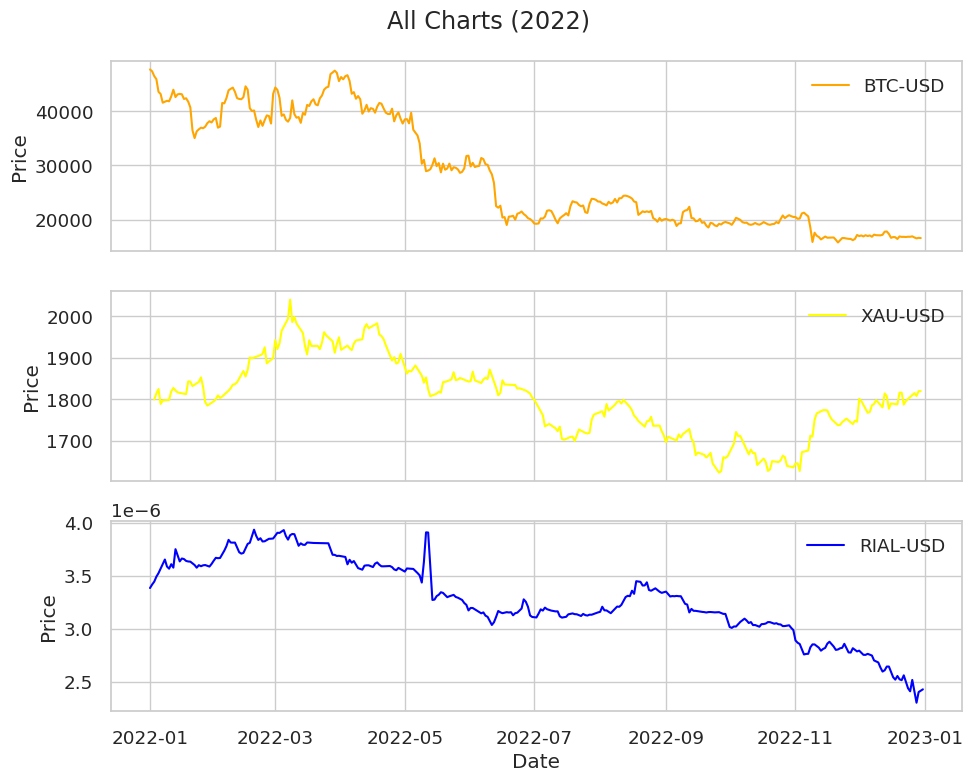

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


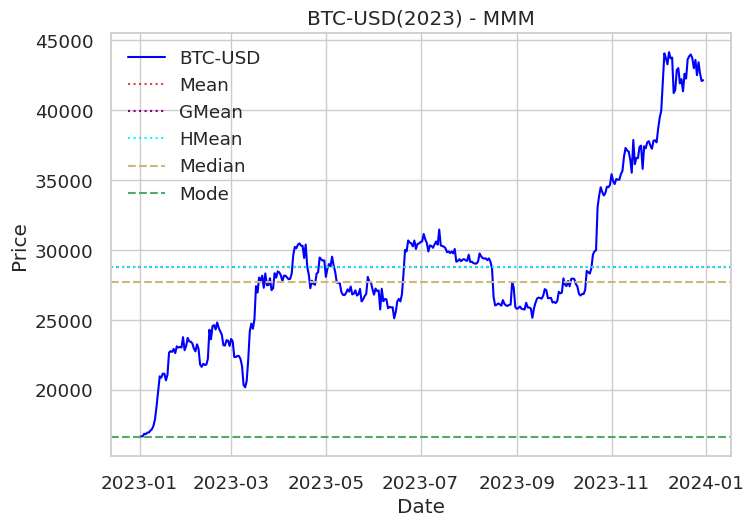

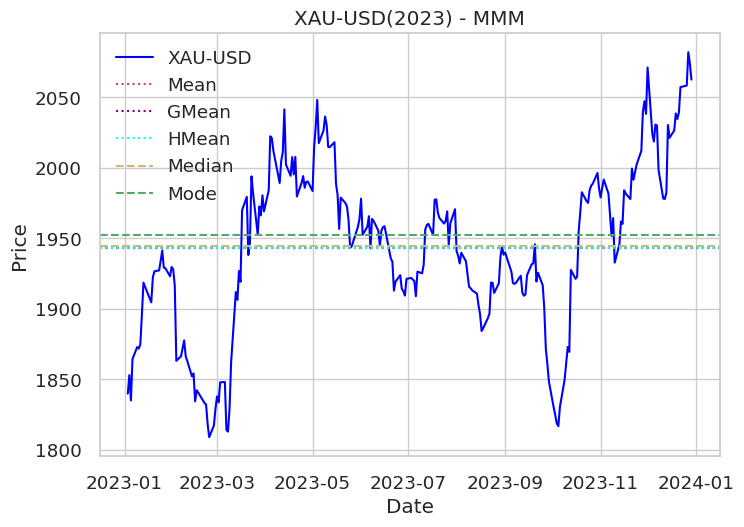

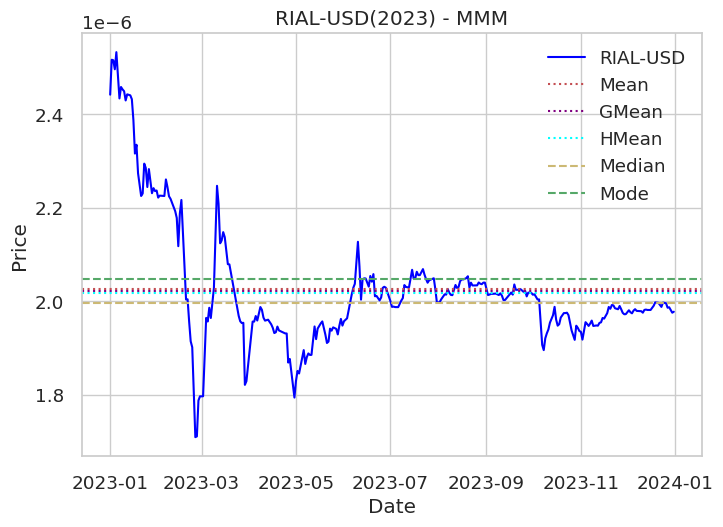

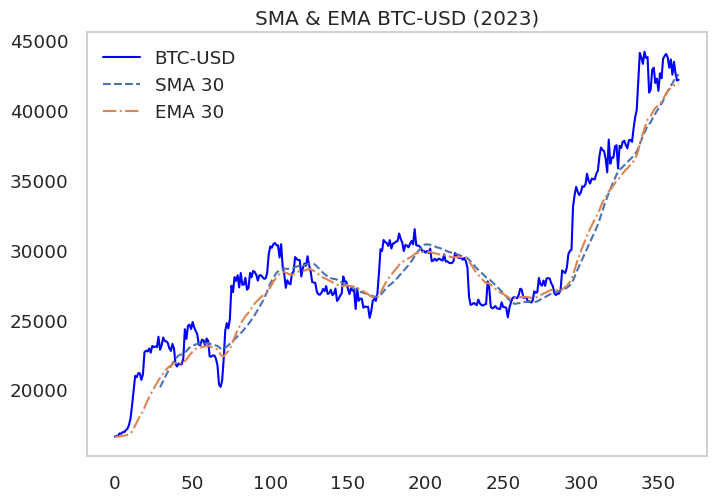

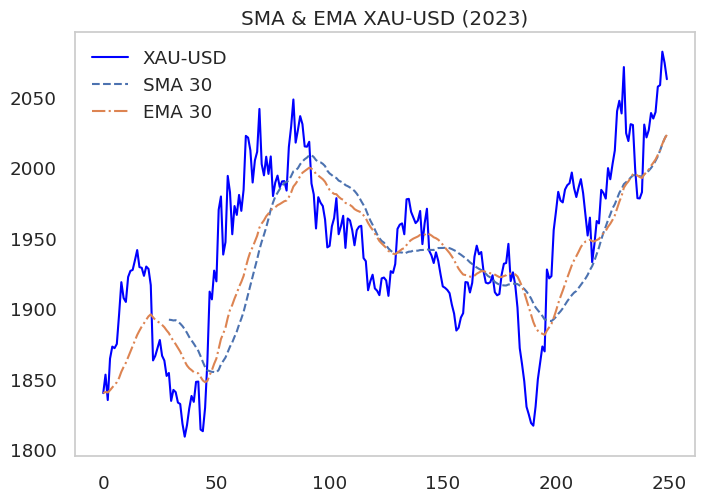

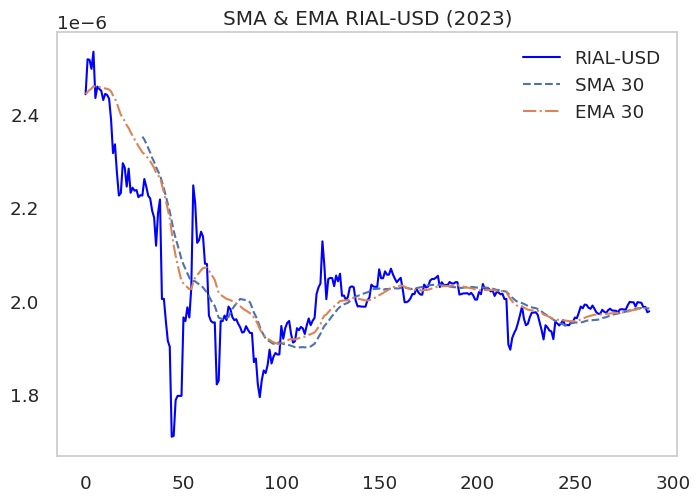

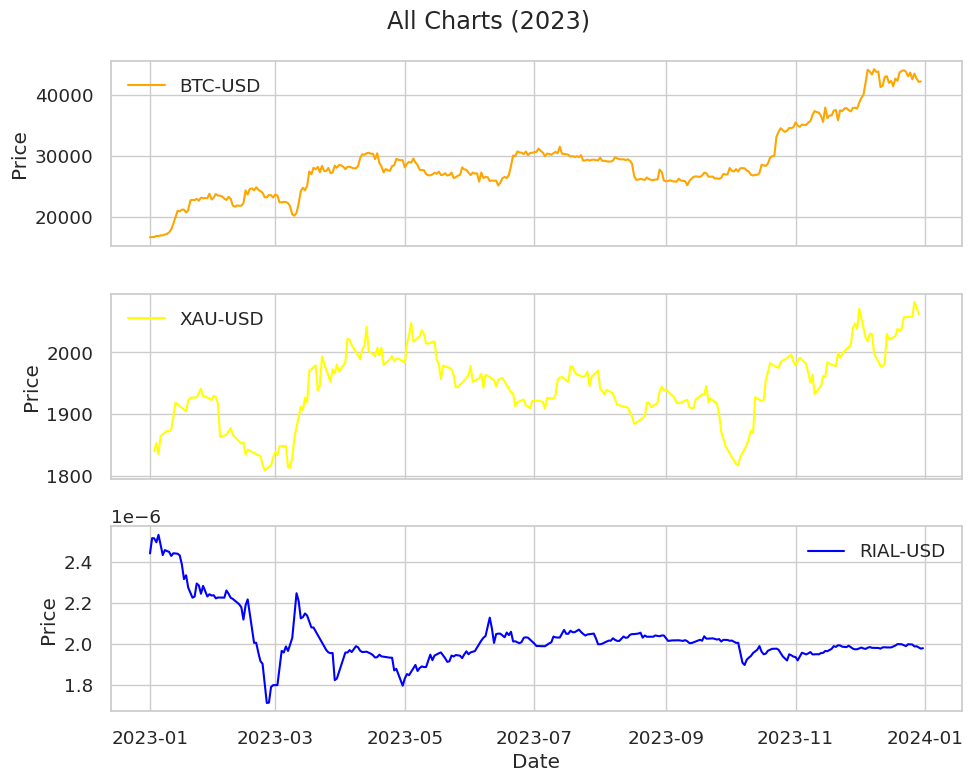

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


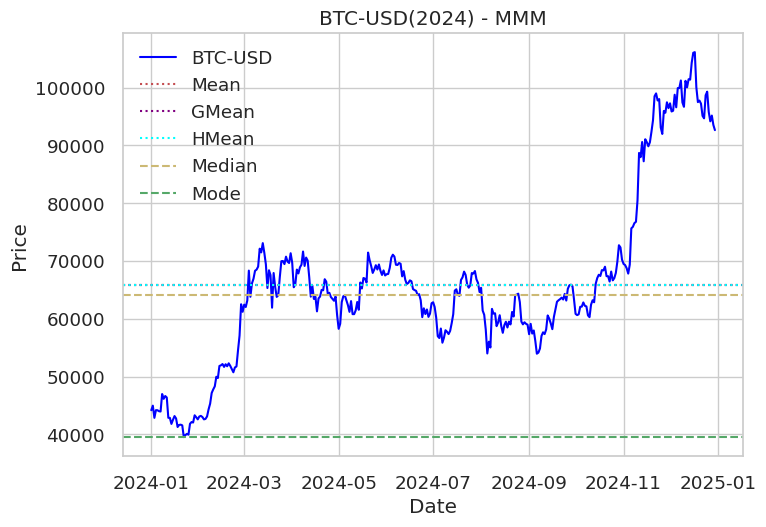

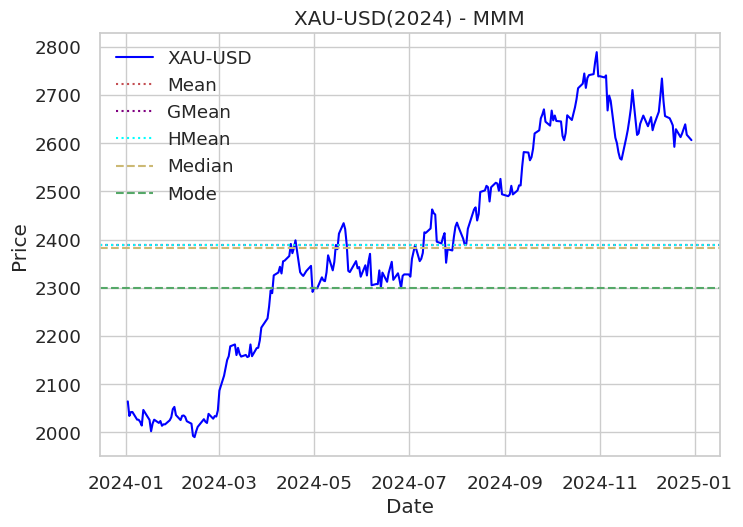

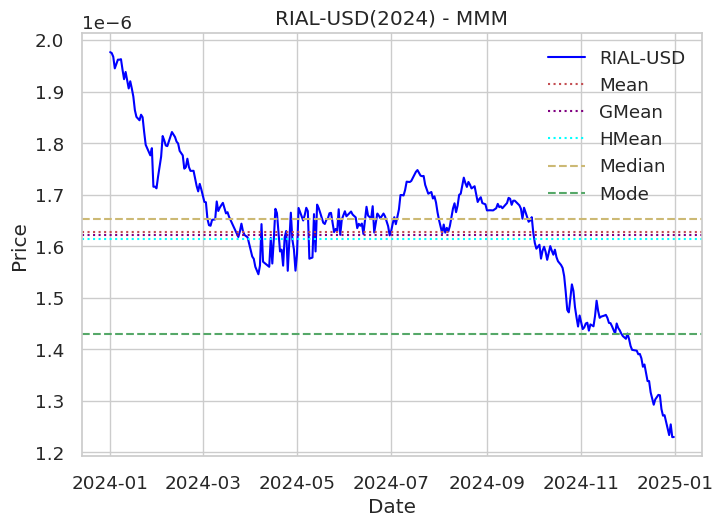

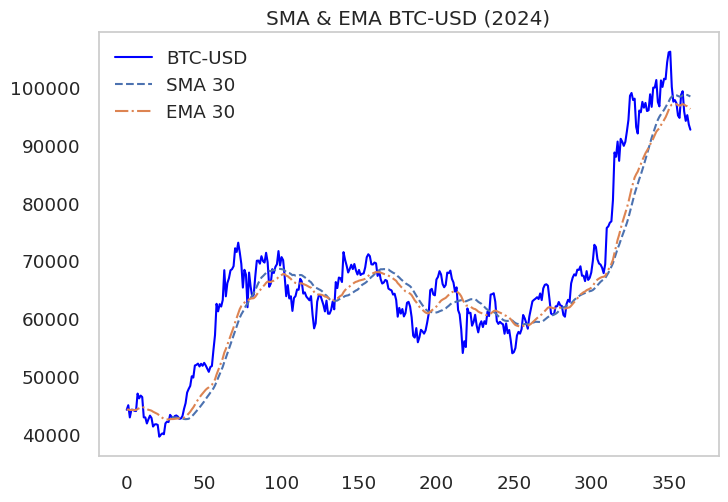

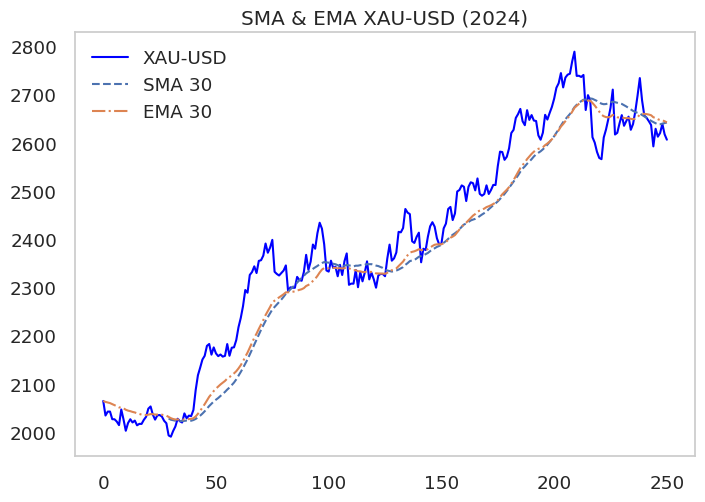

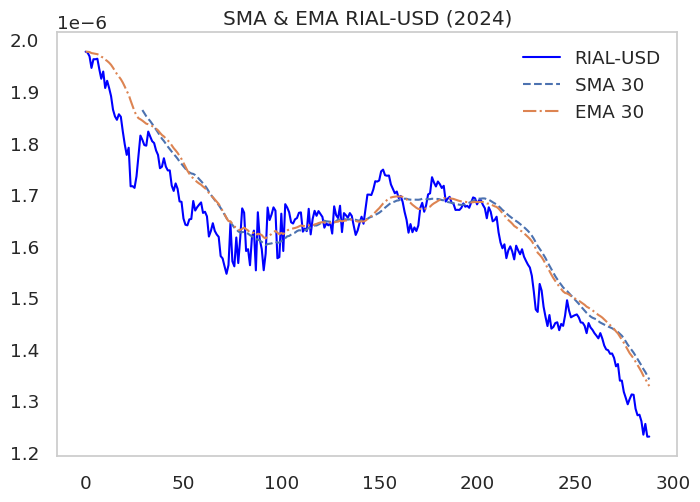

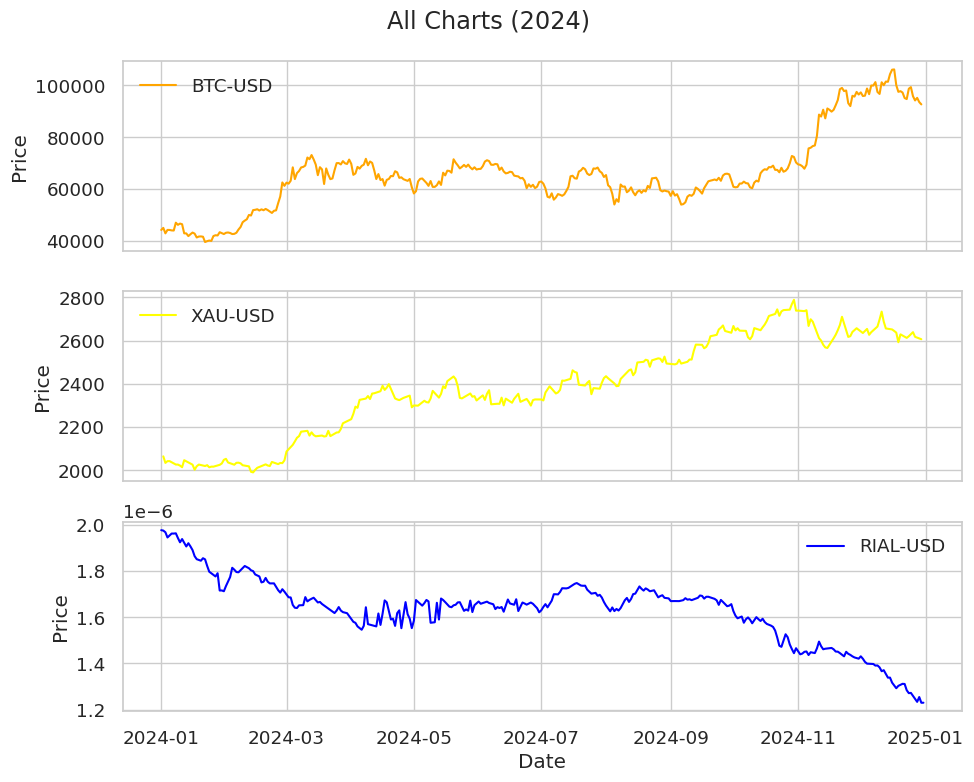

In [93]:
# Check one by one year
for year in range(2015,2025):
  btc_df = yf.download("BTC-USD", start = f"{year}-01-01", end = f"{year}-12-31")
  xau_df = yf.download("GC=F", start = f"{year}-01-01", end = f"{year}-12-31")
  rial_df = tg.get_tgju_data(symbol = 'دلار')
  xau_df = yfinance_data(xau_df)
  btc_df = yfinance_data(btc_df)
  rial_df = tgju_date(rial_df ,f"{year}-01-01" , f"{year}-12-31")

  # Mean, GMean, Hmean, Mode, Median
  mean_values_btc, gmean_values_btc, hmean_values_btc, median_values_btc, mode_values_btc = mmm(btc_df)
  mean_values_xau, gmean_values_xau, hmean_values_xau, median_values_xau, mode_values_xau = mmm(xau_df)
  mean_values_rial, gmean_values_rial, hmean_values_rial, median_values_rial, mode_values_rial = mmm(rial_df)

  # BTC-USD
  plt.plot(btc_df['miladi_date'], btc_df['Close'], label='BTC-USD', color='blue')
  plt.axhline(mean_values_btc[0], color='r', linestyle = ':', label = 'Mean')
  plt.axhline(mean_values_btc[0], color='purple', linestyle = ':', label = 'GMean')
  plt.axhline(mean_values_btc[0], color='cyan', linestyle = ':', label = 'HMean')
  plt.axhline(median_values_btc[0], color='y', linestyle = '--', label = 'Median')
  plt.axhline(mode_values_btc.iloc[0].item(), color='g', linestyle = '--', label = 'Mode')
  plt.title(f"BTC-USD({year}) - MMM")
  plt.xlabel('Date')
  plt.ylabel('Price')
  plt.legend()
  plt.grid(True)
  plt.show()

  # XAU-USD
  plt.plot(xau_df['miladi_date'], xau_df['Close'], label='XAU-USD', color='blue')
  plt.axhline(mean_values_xau[0], color='r', linestyle = ':', label = 'Mean')
  plt.axhline(mean_values_xau[0], color='purple', linestyle = ':', label = 'GMean')
  plt.axhline(mean_values_xau[0], color='cyan', linestyle = ':', label = 'HMean')
  plt.axhline(median_values_xau[0], color='y', linestyle = '--', label = 'Median')
  plt.axhline(mode_values_xau.iloc[0].item(), color='g', linestyle = '--', label = 'Mode')
  plt.title(f"XAU-USD({year}) - MMM")
  plt.xlabel('Date')
  plt.ylabel('Price')
  plt.legend()
  plt.grid(True)
  plt.show()

  # RIAL-USD
  plt.plot(rial_df['miladi_date'], rial_df['Close'], label='RIAL-USD', color='blue')
  plt.axhline(mean_values_rial, color='r', linestyle = ':', label = 'Mean')
  plt.axhline(gmean_values_rial.item(), color='purple', linestyle = ':', label = 'GMean')
  plt.axhline(hmean_values_rial.item(), color='cyan', linestyle = ':', label = 'HMean')
  plt.axhline(median_values_rial, color='y', linestyle = '--', label = 'Median')
  plt.axhline(mode_values_rial[0], color='g', linestyle = '--', label = 'Mode')
  plt.title(f"RIAL-USD({year}) - MMM")
  plt.xlabel('Date')
  plt.ylabel('Price')
  plt.legend()
  plt.grid(True)
  plt.show()

  # EMA, SMA
  EMASMA(btc_df)
  EMASMA(xau_df)
  EMASMA(rial_df)

  # BTC-USD
  plt.plot(btc_df['Close'], label='BTC-USD', color='blue')
  plt.plot(btc_df['SMA_30'], label='SMA 30', linestyle='--')
  plt.plot(btc_df['EMA_30'], label='EMA 30', linestyle='-.')
  plt.legend()
  plt.title(f'SMA & EMA BTC-USD ({year})')
  plt.grid()
  plt.show()

  # XAU-USD
  plt.plot(xau_df['Close'], label='XAU-USD', color='blue')
  plt.plot(xau_df['SMA_30'], label='SMA 30', linestyle='--')
  plt.plot(xau_df['EMA_30'], label='EMA 30', linestyle='-.')
  plt.legend()
  plt.title(f'SMA & EMA XAU-USD ({year})')
  plt.grid()
  plt.show()

  # RIAL-USD
  plt.plot(rial_df['Close'], label='RIAL-USD', color='blue')
  plt.plot(rial_df['SMA_30'], label='SMA 30', linestyle='--')
  plt.plot(rial_df['EMA_30'], label='EMA 30', linestyle='-.')
  plt.legend()
  plt.title(f'SMA & EMA RIAL-USD ({year})')
  plt.grid()
  plt.show()

 # All Charts

  fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 8), sharex=True)

  ax1.plot(btc_df['miladi_date'], btc_df['Close'], label='BTC-USD', color='orange')
  ax1.set_ylabel('Price')
  ax1.legend()
  ax1.grid(True)

  ax2.plot(xau_df['miladi_date'], xau_df['Close'], label='XAU-USD', color='yellow')
  ax2.set_ylabel('Price')
  ax2.legend()
  ax2.grid(True)

  ax3.plot(rial_df['miladi_date'], rial_df['Close'], label='RIAL-USD', color='blue')
  ax3.set_xlabel('Date')  # فقط برای آخرین subplot
  ax3.set_ylabel('Price')
  ax3.legend()
  ax3.grid(True)
  plt.suptitle(f"All Charts ({year})")
  plt.tight_layout()
  plt.show()

In these charts, what is evident is that the averages completely overlap. Another interesting point is that in the case of an oscillating chart, these values are closer to each other, and as the distance between prices increases, these values diverge from one another.  

Using EMA and SMA, the progress trend can also be observed. The difference between these two lies in their sensitivity to sudden changes—EMA is less sensitive compared to SMA, and SMA consistently moves away from EMA but eventually returns to it after some time.  

It should be noted that the EMA and SMA are plotted for a 30-day period.

# **Month-to-month comparison**

**In this section, all months of each year are compared with one another.**

In [94]:
# Month Coparison
def month_Coparison(df, name):
  fig, axes = plt.subplots(4, 3, figsize=(18, 20))
  fig.suptitle(f'{name} Daily Prices Comparison (2015-2020)', fontsize=16, y=1.02)

  month_names = ['January', 'February', 'March', 'April', 'May', 'June',
                'July', 'August', 'September', 'October', 'November', 'December']

  for month in range(1, 13):
      row = (month - 1) // 3
      col = (month - 1) % 3
      ax = axes[row, col]
      month_data = df[df["miladi_date"].dt.month == month]
      for year in range(2015, 2021):
          year_data = month_data[month_data["miladi_date"].dt.year == year]
          if not year_data.empty:
              ax.plot(year_data["miladi_date"].dt.day,
                      year_data['Close'],
                      label=str(year),
                      marker='o',
                      markersize=3,
                      linestyle='-')
      ax.set_title(month_names[month-1])
      ax.set_xlabel('Day of Month')
      ax.set_ylabel('Price (USD)')
      ax.legend()
      ax.grid(True, alpha=0.3)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


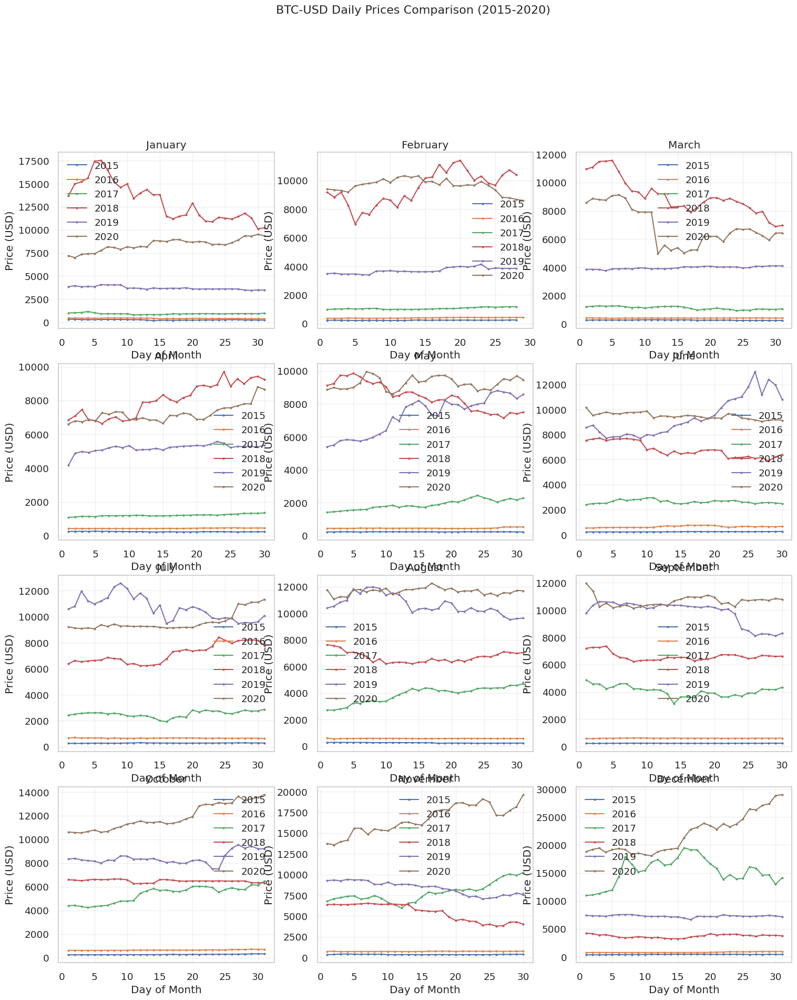

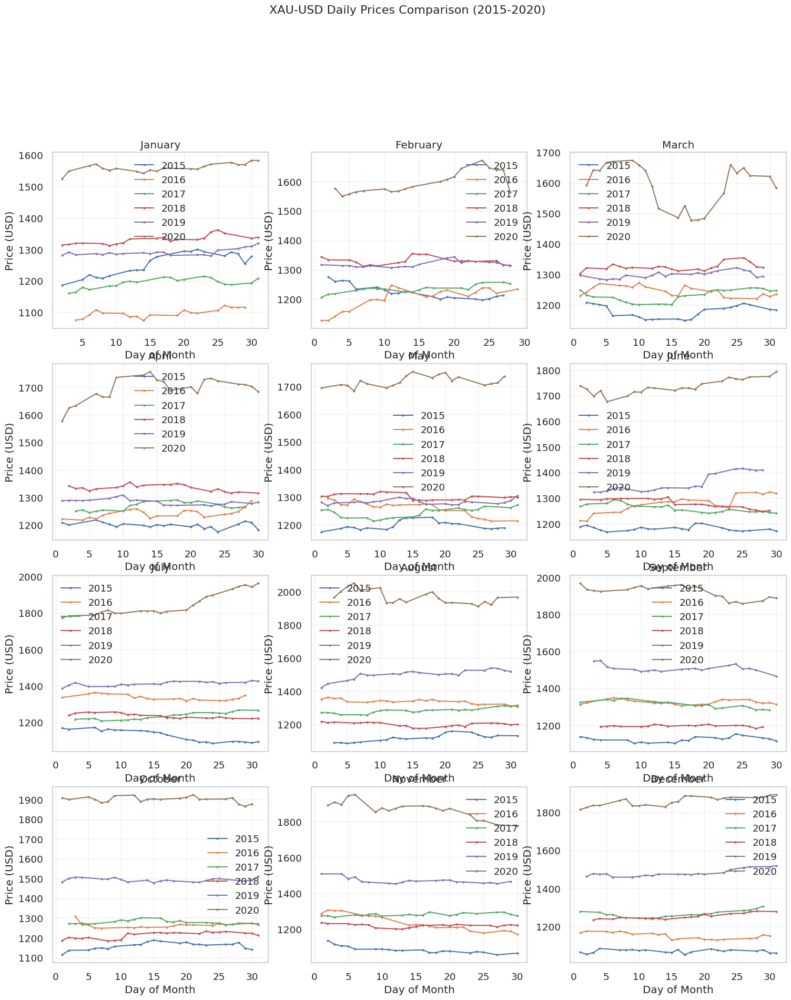

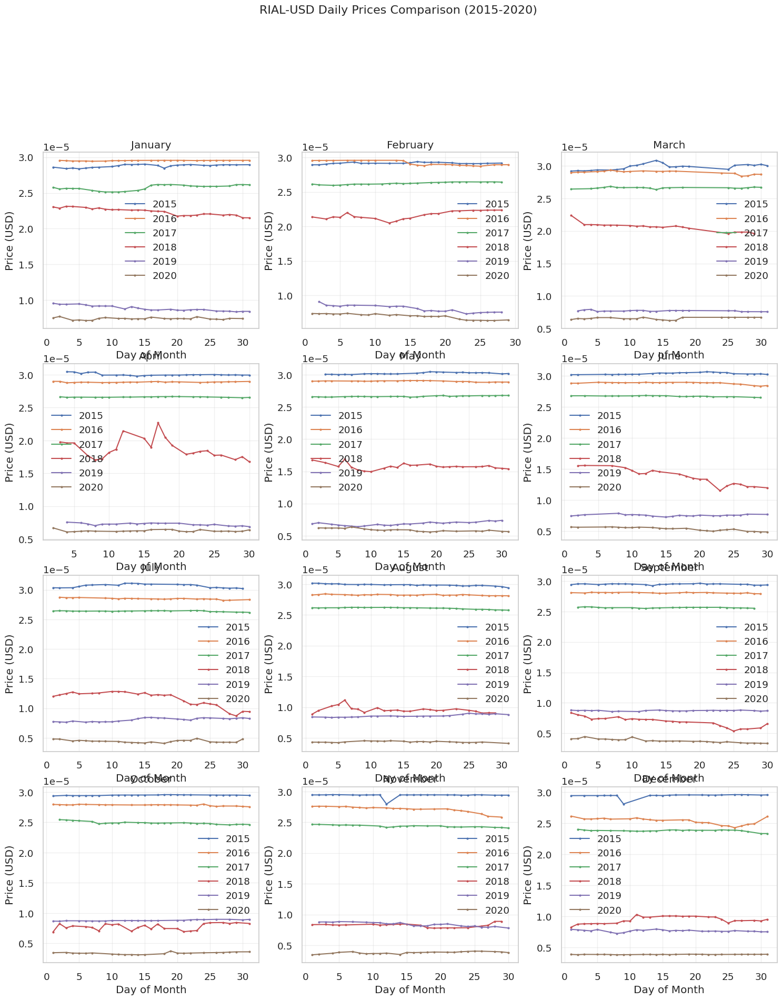

In [95]:
btc_df = yf.download("BTC-USD", start=start_date, end=end_date, interval="1d")
xau_df = yf.download("GC=F", start=start_date, end=end_date, interval="1d")
rial_df = tg.get_tgju_data(symbol = 'دلار')
xau_df = yfinance_data(xau_df)
btc_df = yfinance_data(btc_df)
rial_df = tgju_date(rial_df ,start_date , end_date)

month_Coparison(btc_df, "BTC-USD")
month_Coparison(xau_df, "XAU-USD")
month_Coparison(rial_df, "RIAL-USD")

When comparing different months for Bitcoin, the notable observations are as follows:  

1. The highest Bitcoin prices are observed in **2018 and 2020**, with some months in **2019** also showing similar trends.  
2. In **March** of each year, particularly in **2018 and 2020**, there are noticeable mid-month declines.  
3. **April** has shown an **upward trend** in almost every year.  
4. A **similar pattern** is seen in the **last three months of 2020**.  

Regarding gold, the following observations can be made:  

1. **2020 saw the highest prices**, with a **significant gap** compared to previous years.  
2. In **March**, the overall trend has been **fairly consistent across all years**: an initial rise, followed by a decline, and then a repetition of this pattern.  
3. **June** has shown an **upward trend every year**.  
4. The **remaining months** have generally followed a **stable trend** without major fluctuations.  

Regarding the Iranian Rial (IRR), the following observations can be noted:  

1. **2019 and 2020** show the **lowest valuation** for the currency, with a **significant gap** compared to other years, indicating a **sudden drop**.  
2. Across **all months and years**, there has been a **gradual downward trend** with a very slight slope.  
3. The **only sharp fluctuation** occurred in **April 2018**, and upon closer examination of the 2018 chart, it becomes clear that this year was the **primary driver of the Rial's decline**.

# **Considering Outliers**

In [96]:
def detect_outliers(df, name, year, remove_outliers=False):
    # Calculate IQR
    Q1 = df['Close'].quantile(0.25)
    Q3 = df['Close'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Mark outliers
    df['Is_Outlier'] = (df['Close'] < lower_bound) | (df['Close'] > upper_bound)
    num_outliers = df['Is_Outlier'].sum()

    # Create plot showing outliers
    plt.figure(figsize=(14, 5))
    plt.plot(df['miladi_date'], df['Close'], color='blue', marker='o',
             linestyle='-', linewidth=1, markersize=4, label='Original data')

    if num_outliers > 0:
        outlier_data = df[df['Is_Outlier']]
        plt.scatter(outlier_data['miladi_date'], outlier_data['Close'],
                    color='red', label=f'Outliers (count: {num_outliers})', s=100)
    else:
        plt.scatter([], [], color='red', label='No outliers found')

    plt.title(f'Price Chart with Outliers - {name} ({year})', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Closing Price', fontsize=12)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Display processing information
    print(f"\nOutlier Detection Summary:")
    print(f"- Total data points: {len(df)}")
    print(f"- Outliers detected: {num_outliers}")
    print(f"- Outlier percentage: {num_outliers/len(df)*100:.2f}%")

    # Remove outliers
    df_clean = df[~df['Is_Outlier']].copy()
    df = df_clean.drop(columns=['Is_Outlier'])

    return df

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


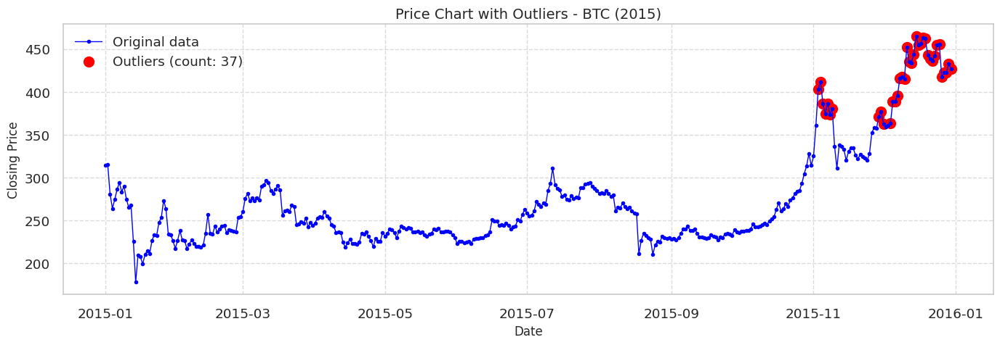


Outlier Detection Summary:
- Total data points: 364
- Outliers detected: 37
- Outlier percentage: 10.16%


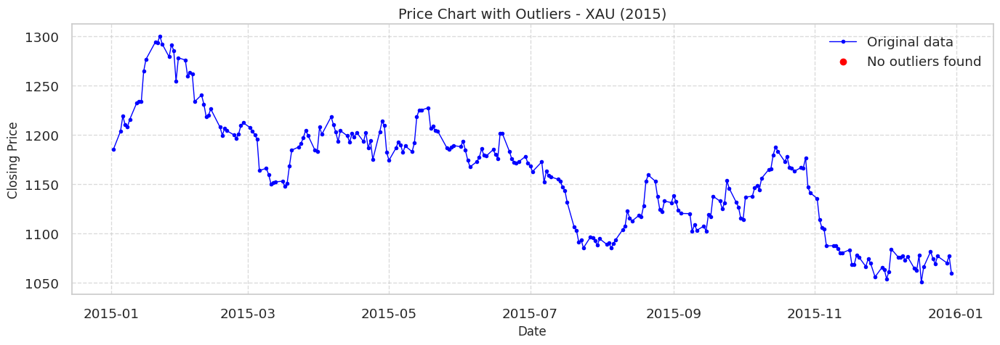


Outlier Detection Summary:
- Total data points: 251
- Outliers detected: 0
- Outlier percentage: 0.00%


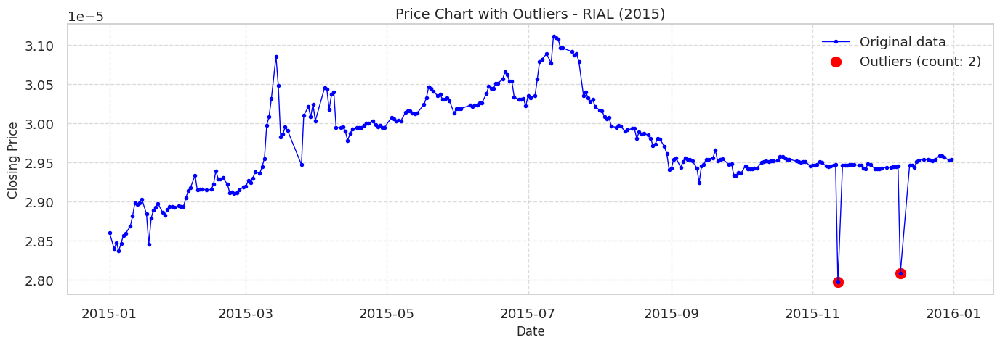


Outlier Detection Summary:
- Total data points: 291
- Outliers detected: 2
- Outlier percentage: 0.69%


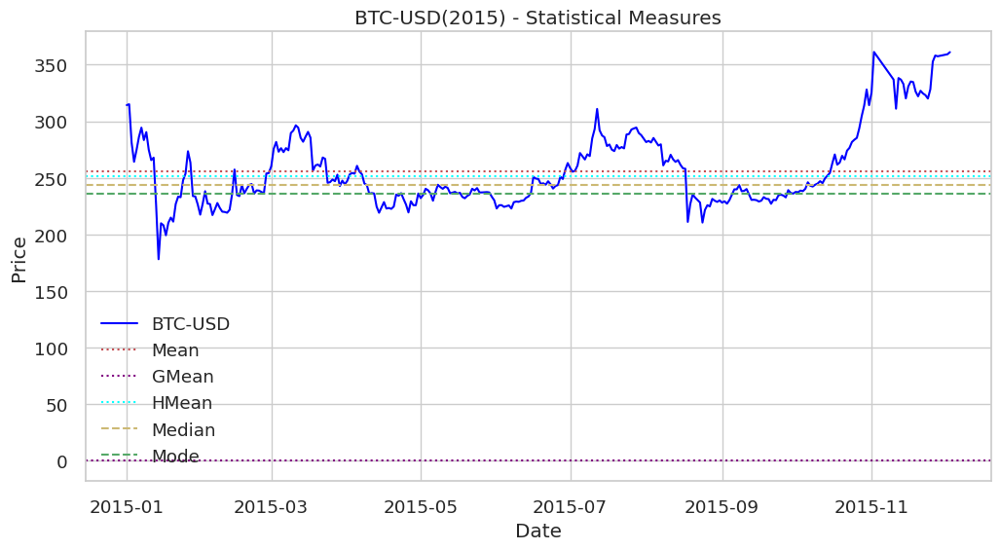

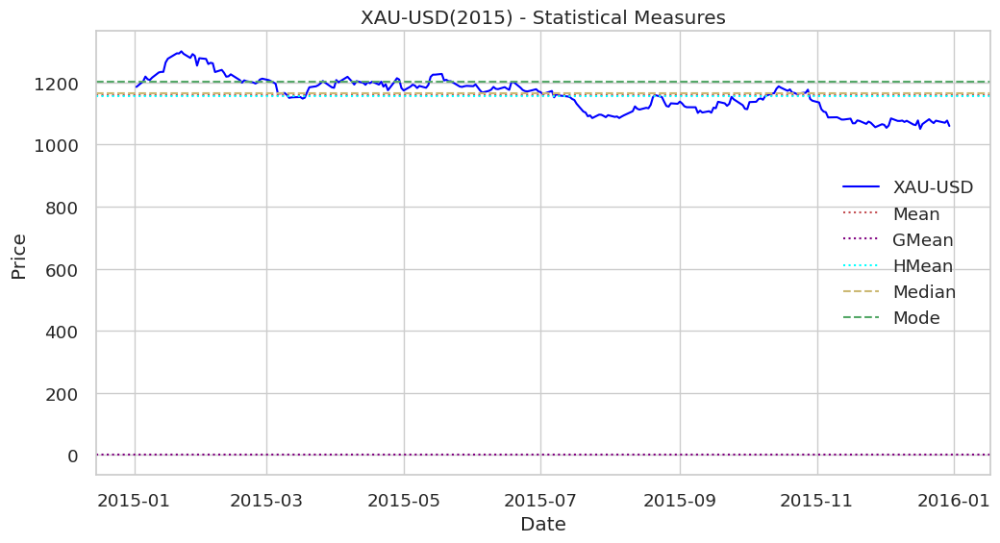

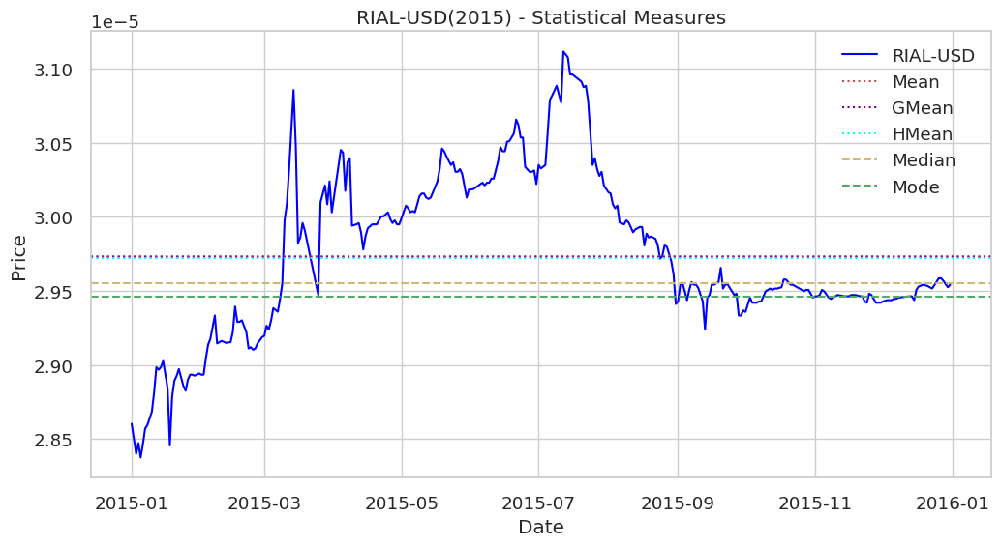

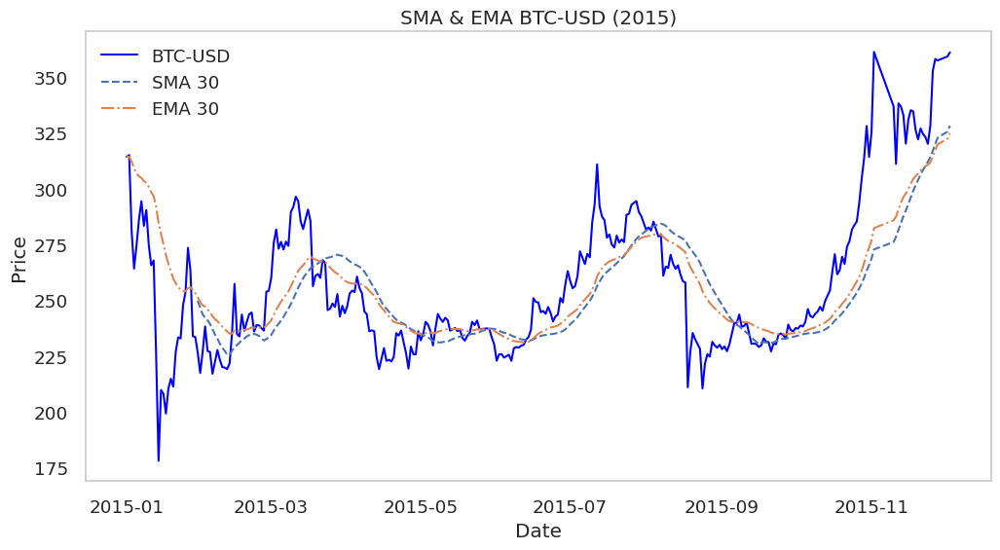

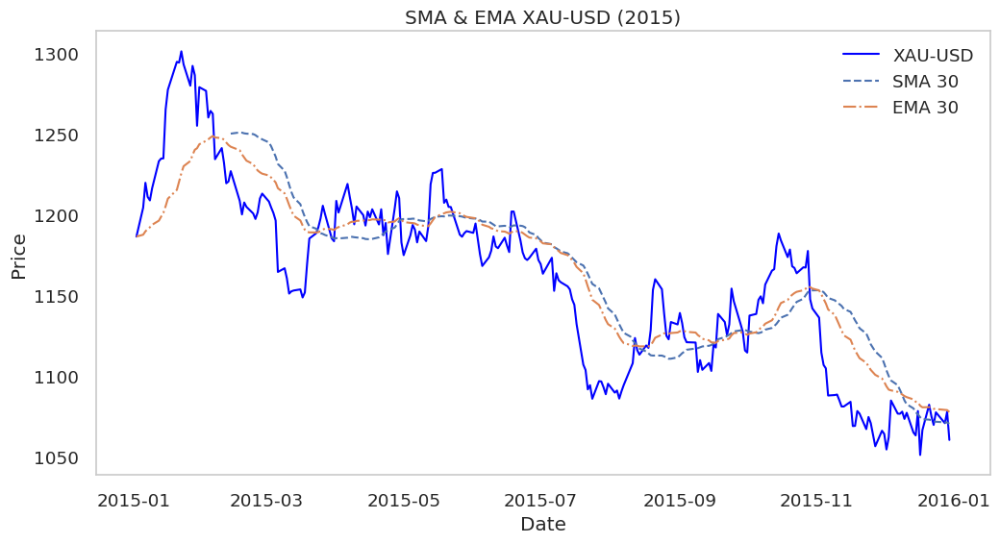

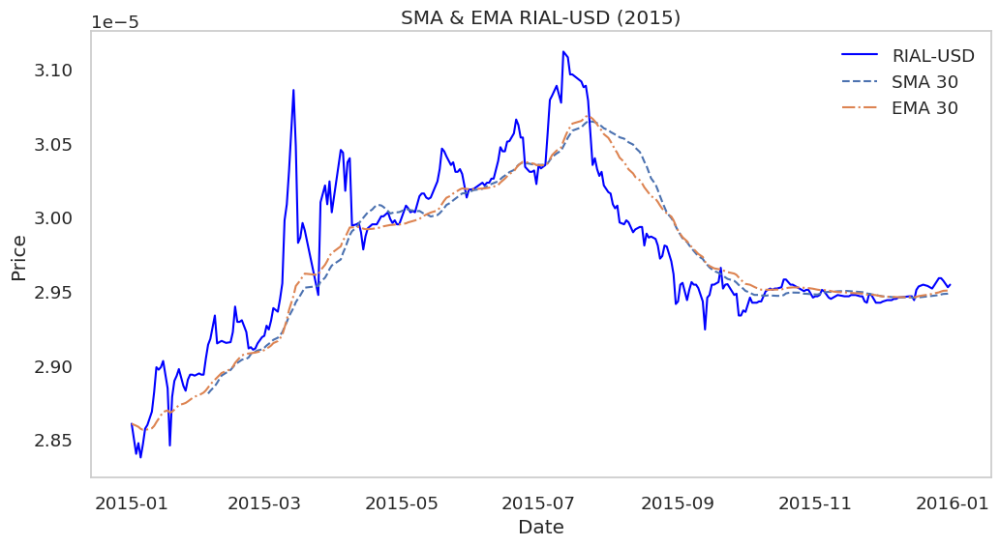

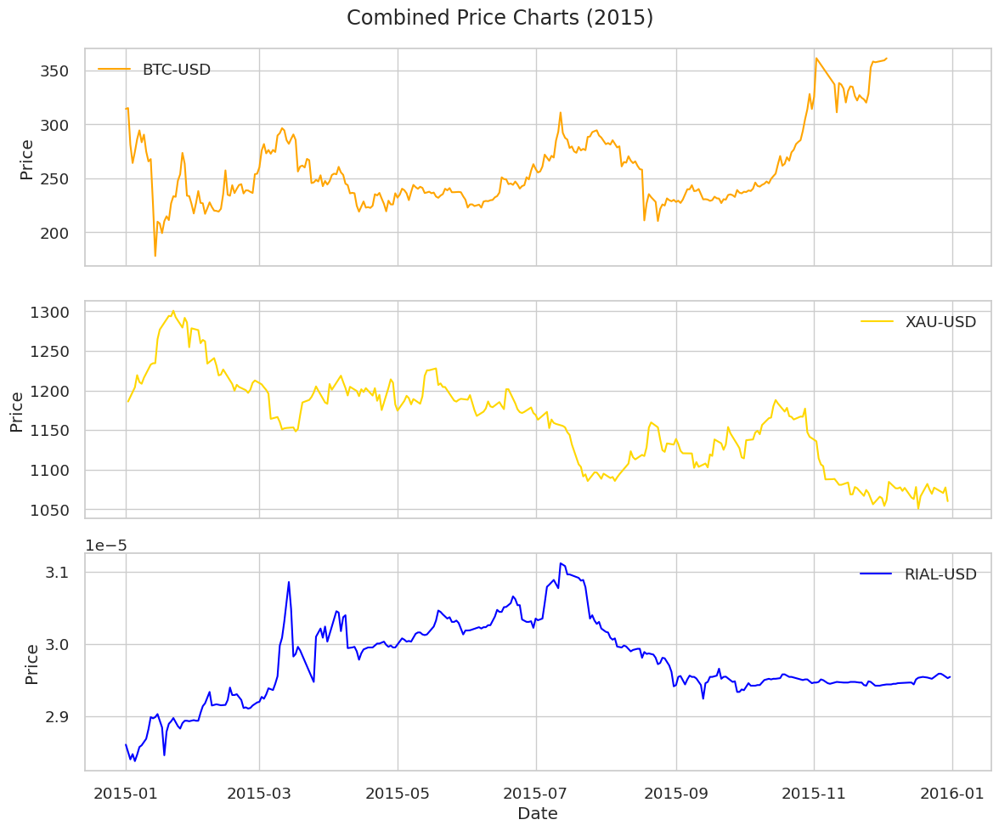

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


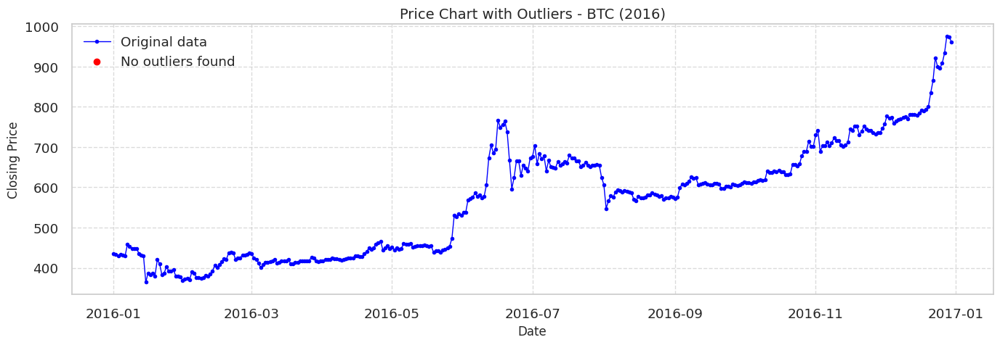


Outlier Detection Summary:
- Total data points: 365
- Outliers detected: 0
- Outlier percentage: 0.00%


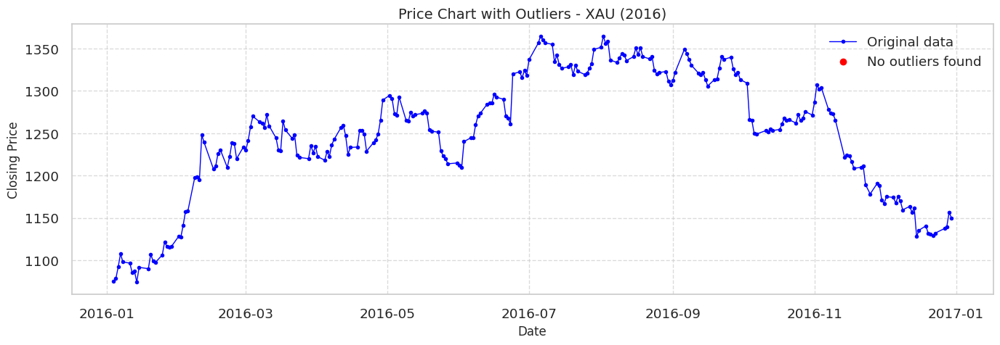


Outlier Detection Summary:
- Total data points: 250
- Outliers detected: 0
- Outlier percentage: 0.00%


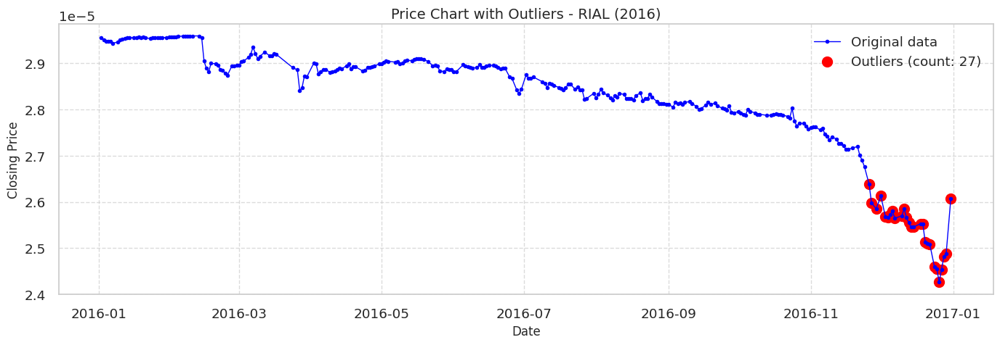


Outlier Detection Summary:
- Total data points: 288
- Outliers detected: 27
- Outlier percentage: 9.38%


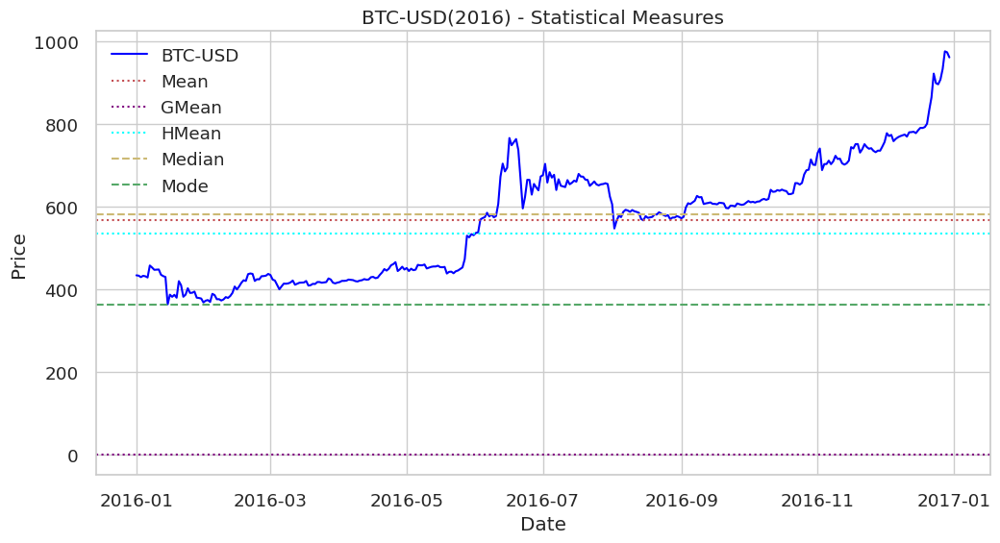

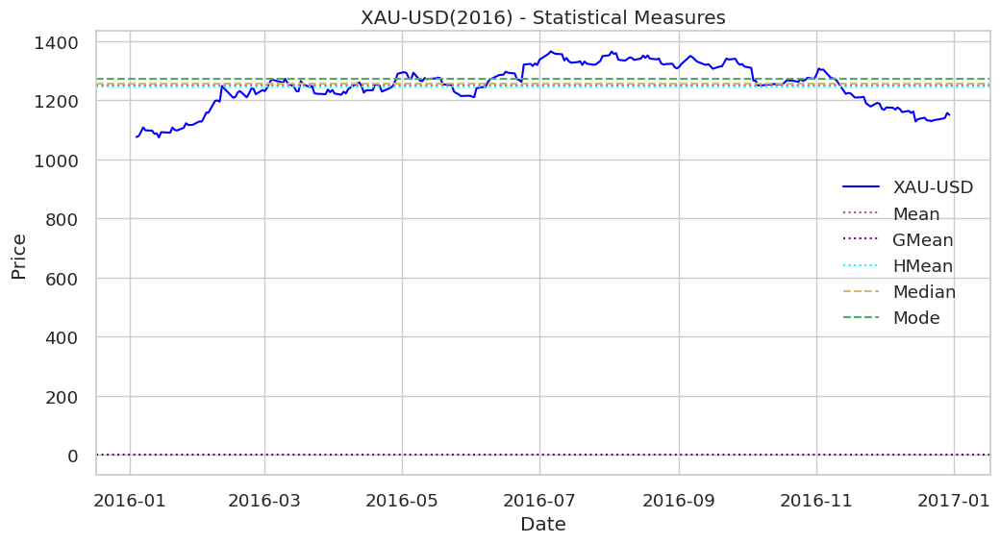

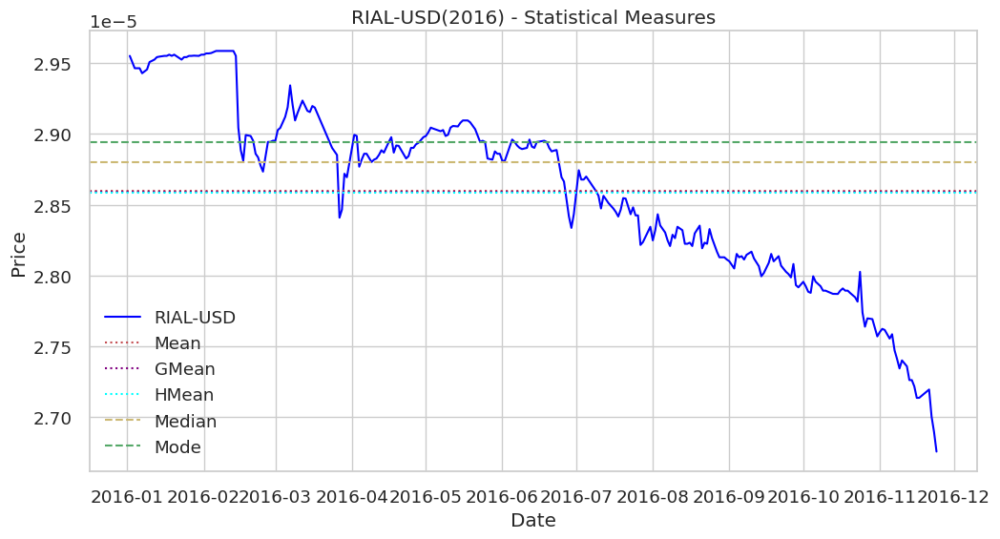

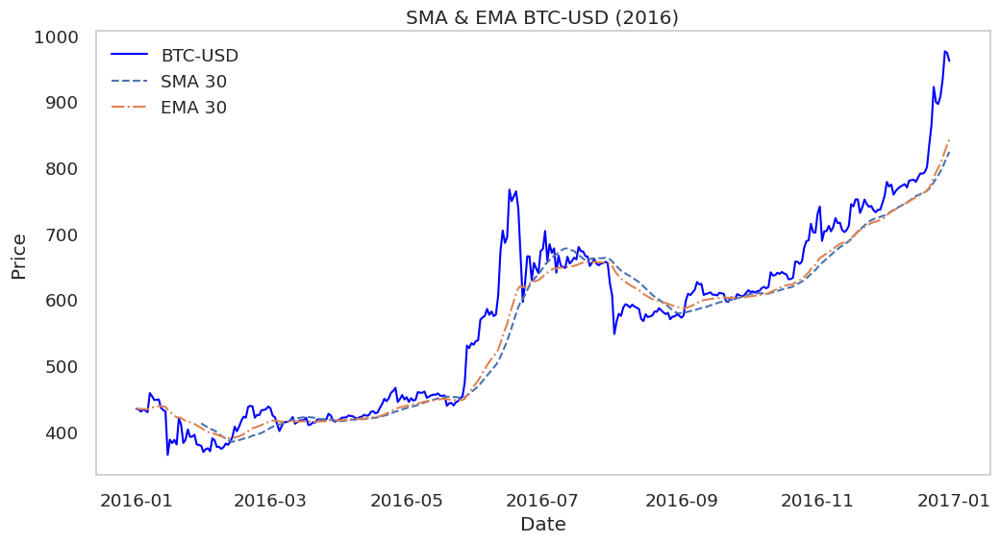

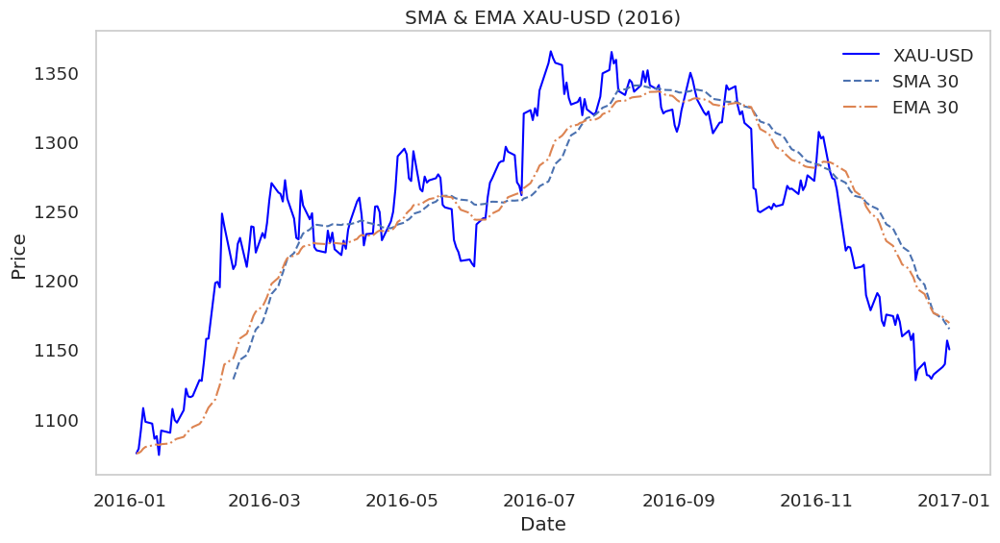

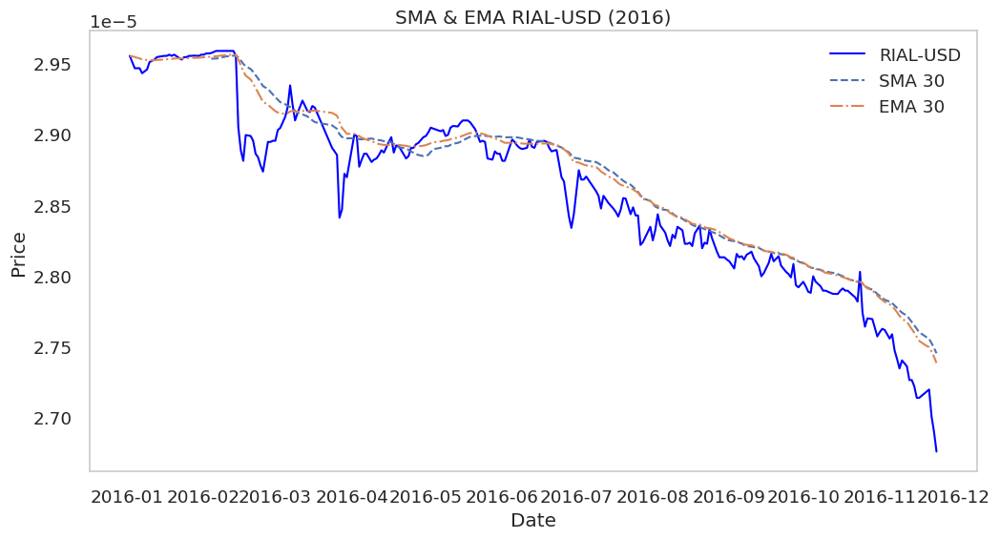

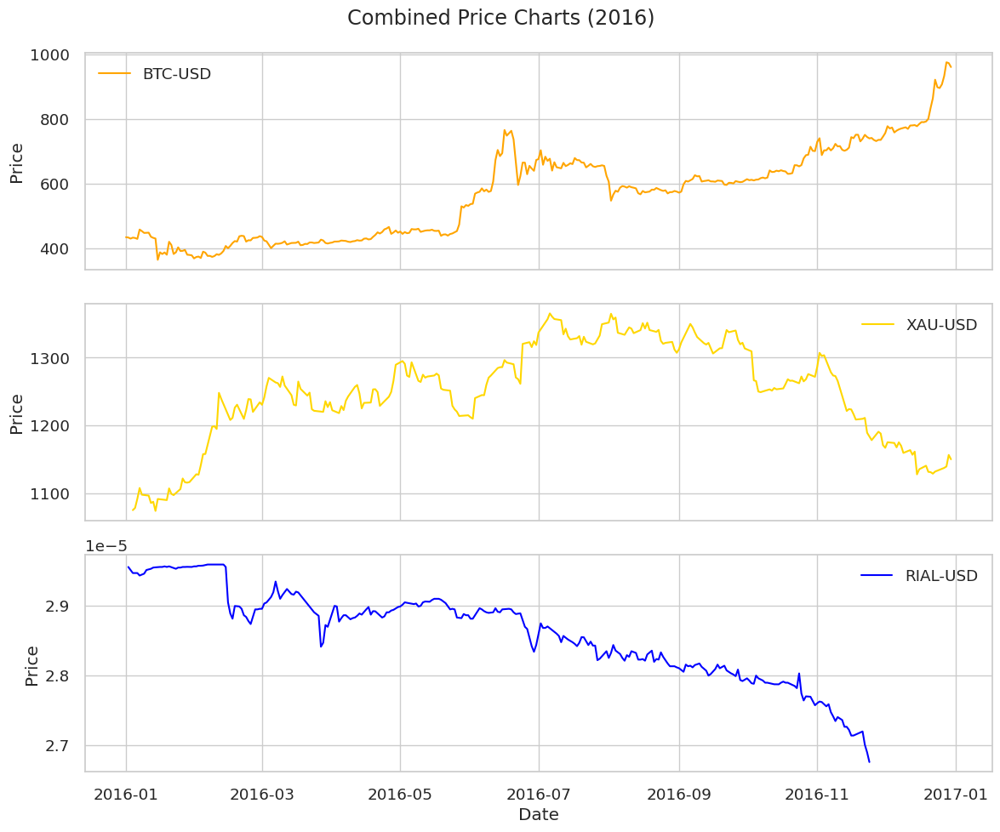

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


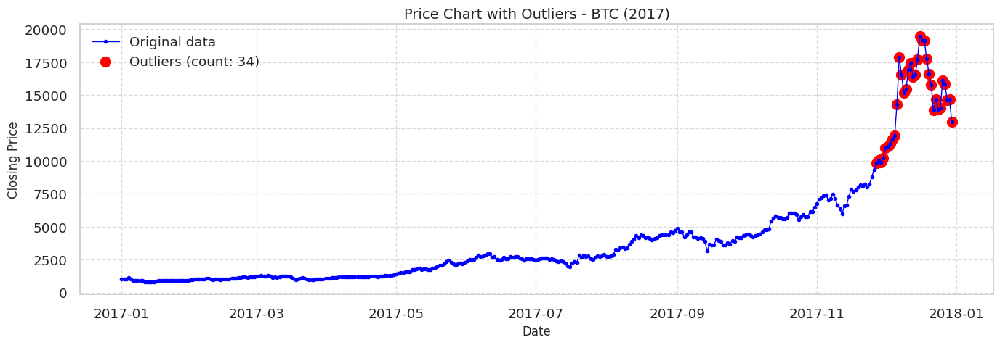


Outlier Detection Summary:
- Total data points: 364
- Outliers detected: 34
- Outlier percentage: 9.34%


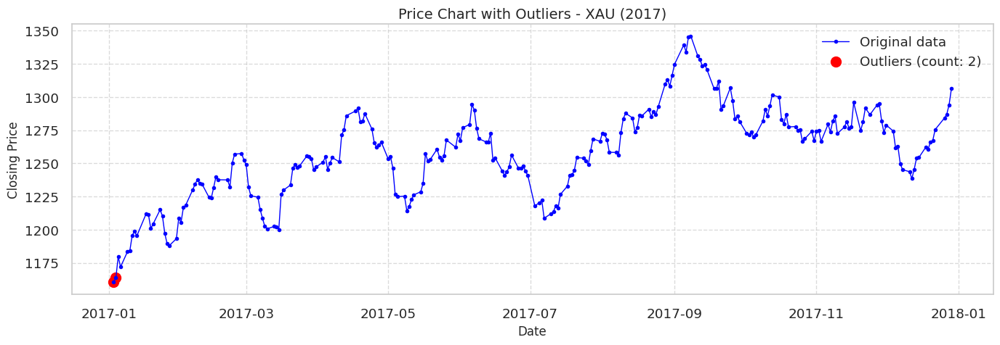


Outlier Detection Summary:
- Total data points: 251
- Outliers detected: 2
- Outlier percentage: 0.80%


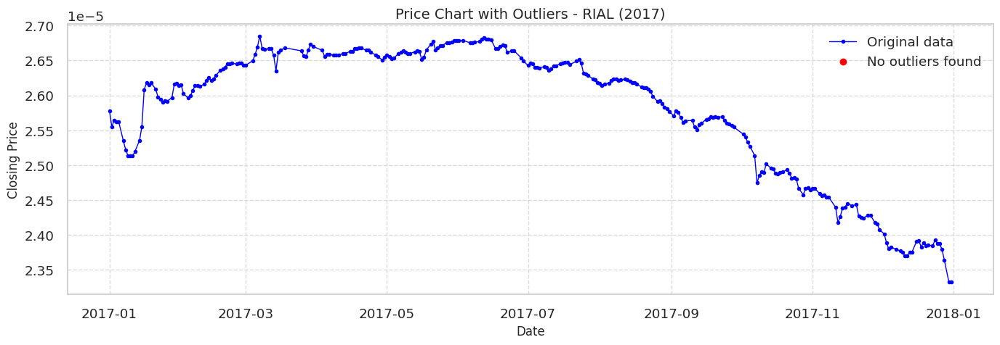


Outlier Detection Summary:
- Total data points: 291
- Outliers detected: 0
- Outlier percentage: 0.00%


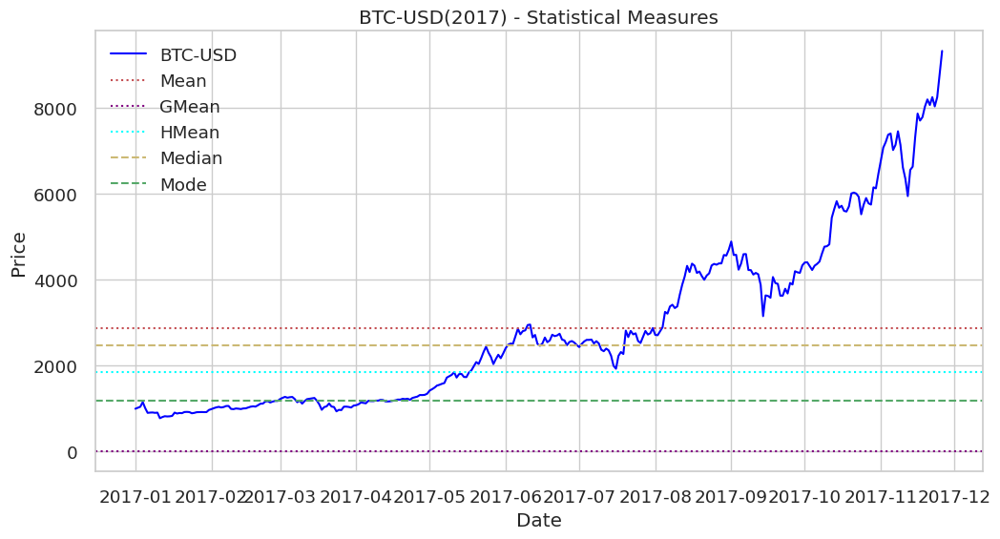

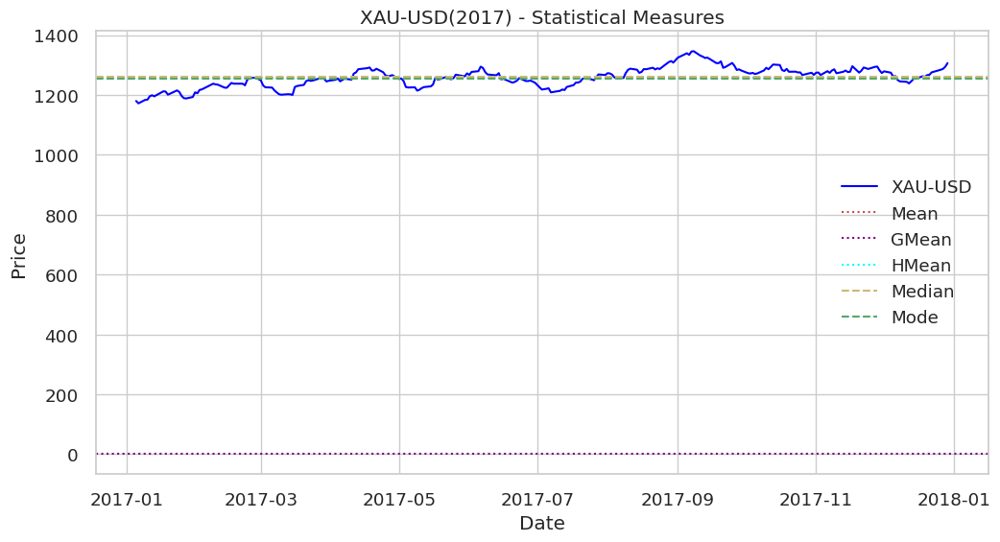

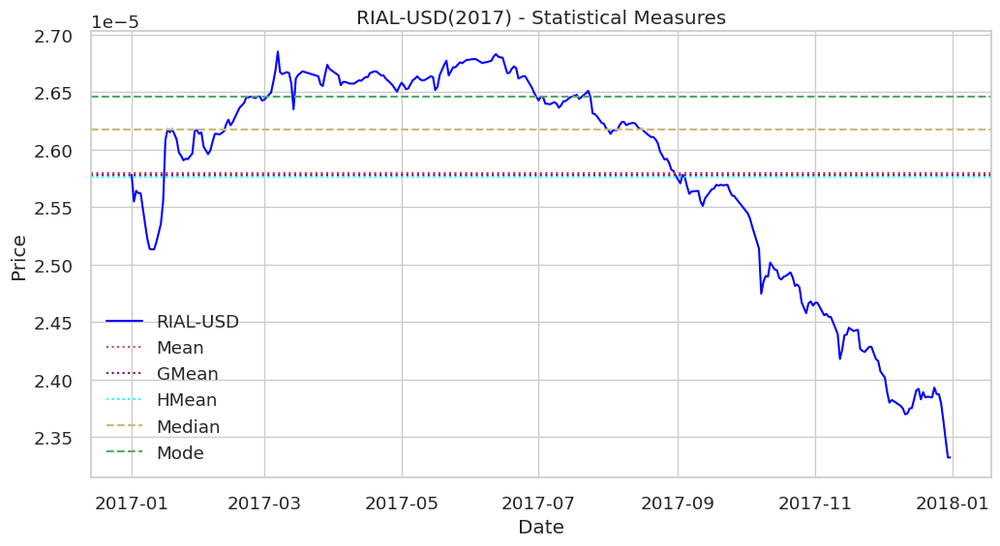

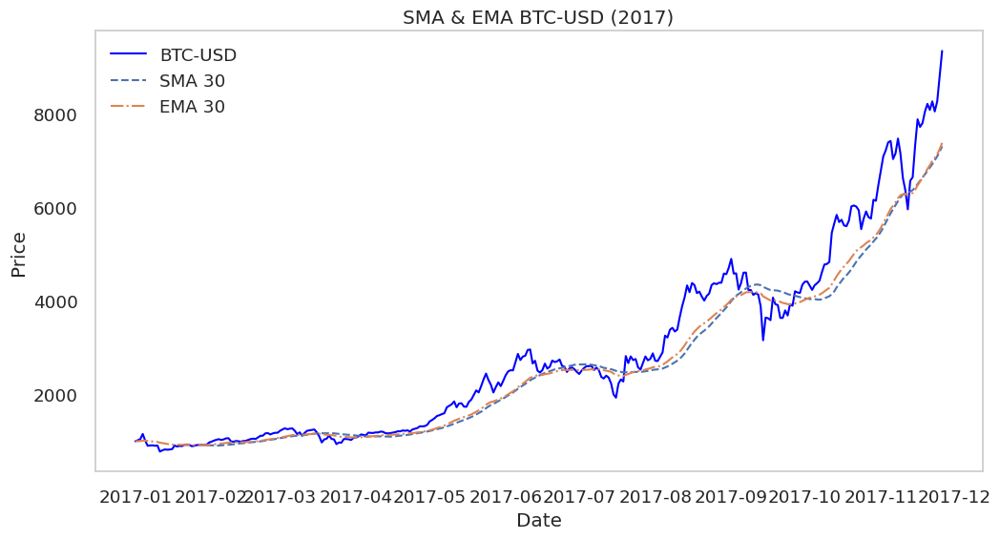

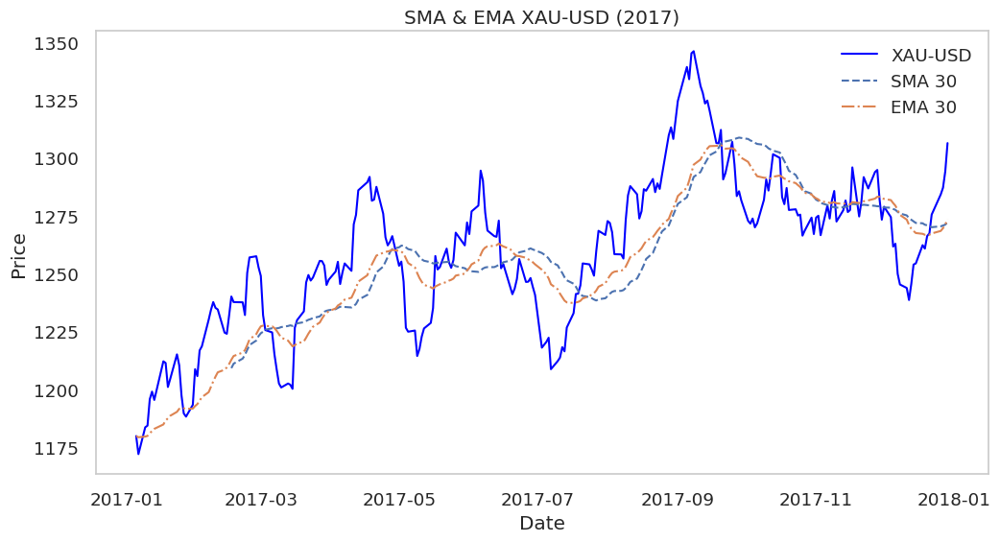

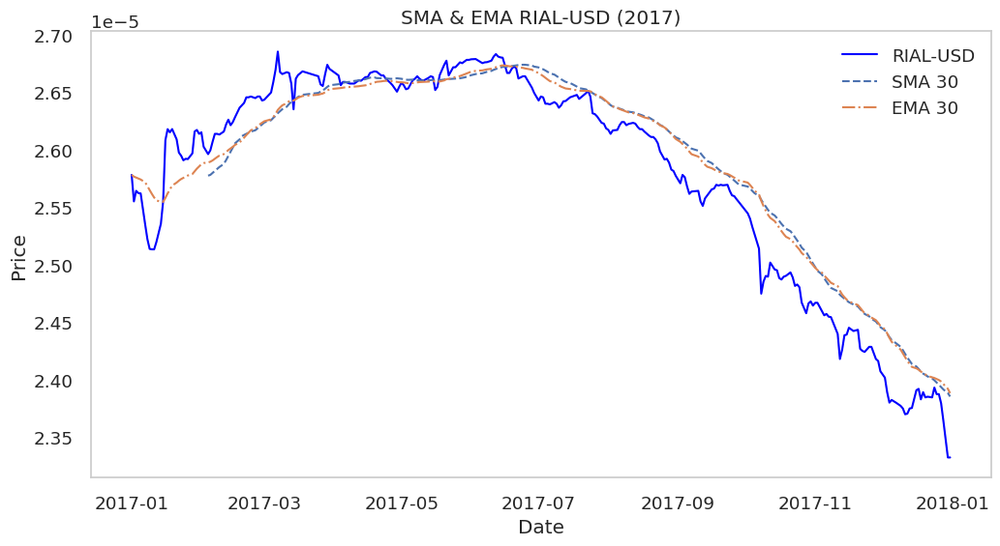

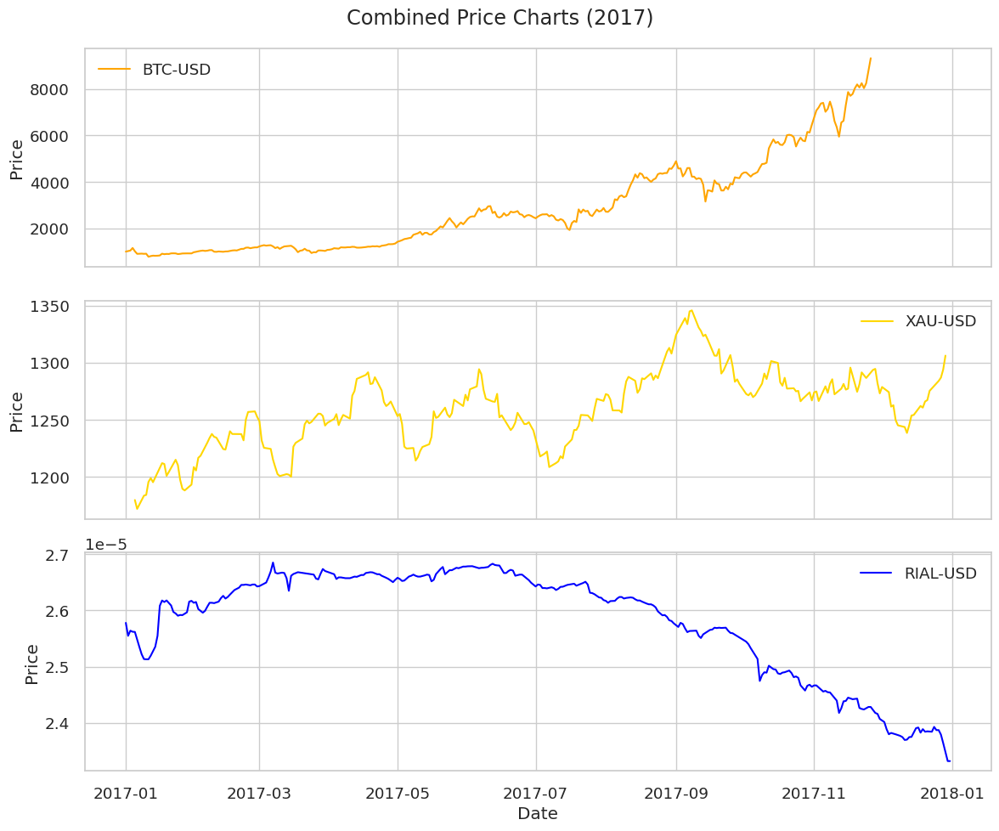

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


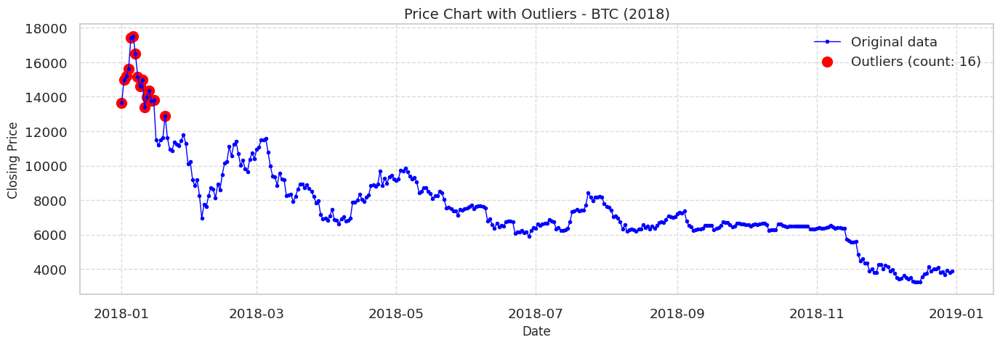


Outlier Detection Summary:
- Total data points: 364
- Outliers detected: 16
- Outlier percentage: 4.40%


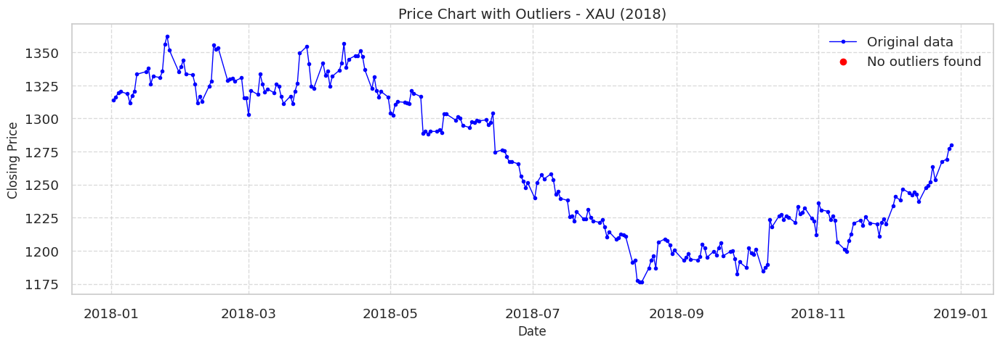


Outlier Detection Summary:
- Total data points: 249
- Outliers detected: 0
- Outlier percentage: 0.00%


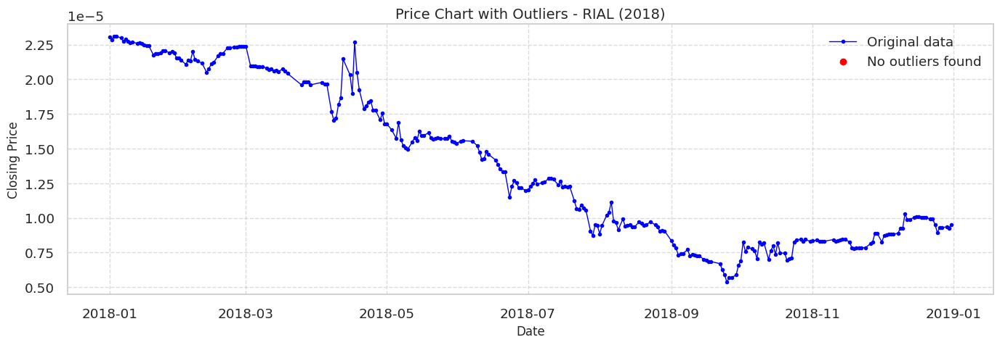


Outlier Detection Summary:
- Total data points: 289
- Outliers detected: 0
- Outlier percentage: 0.00%


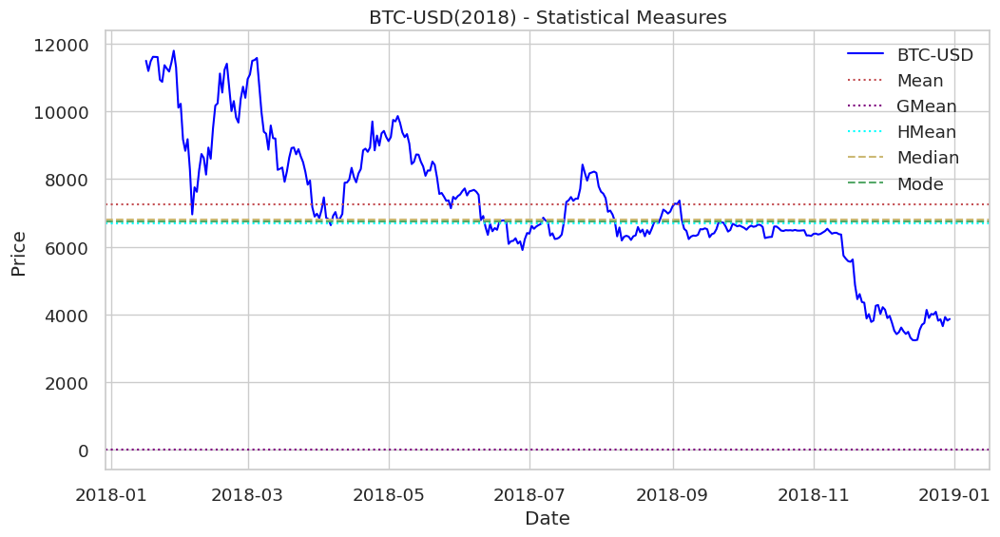

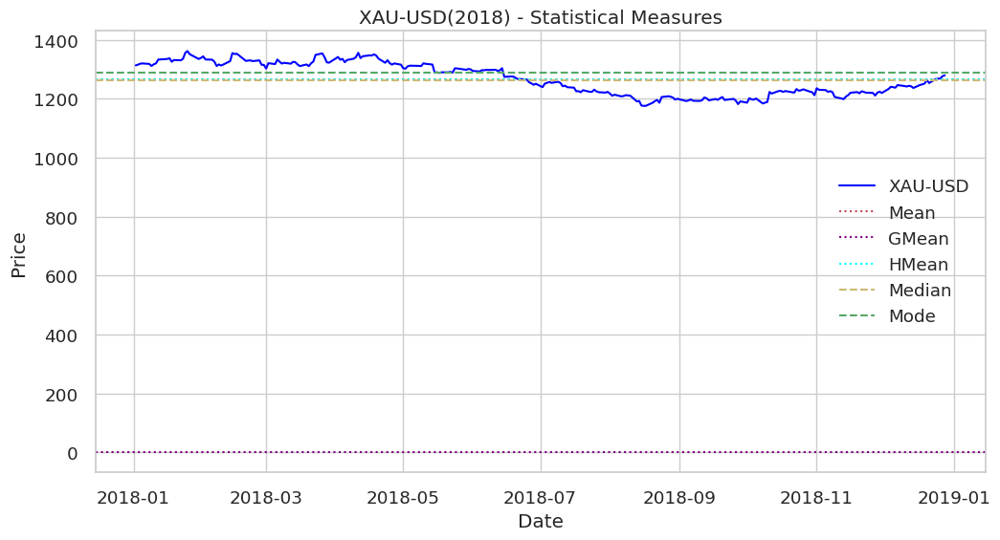

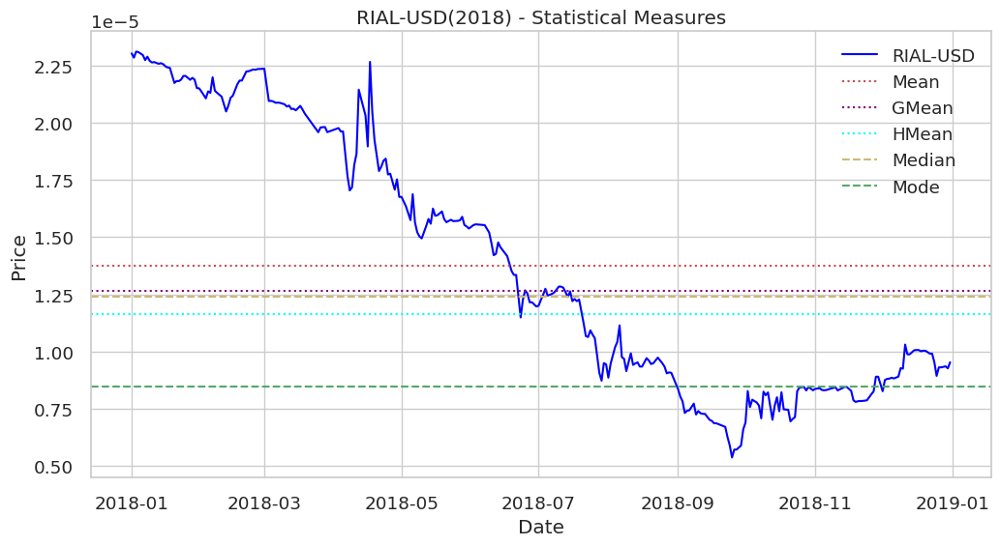

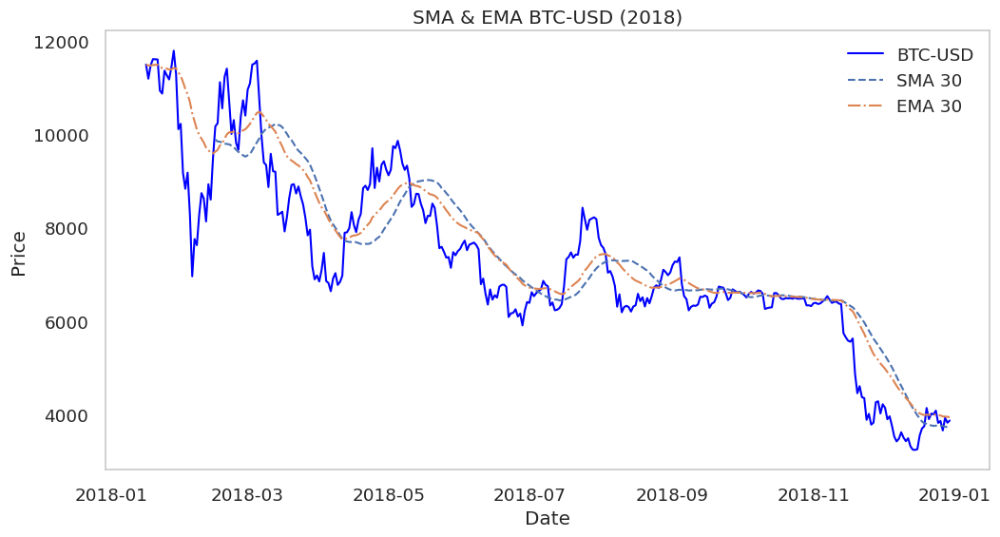

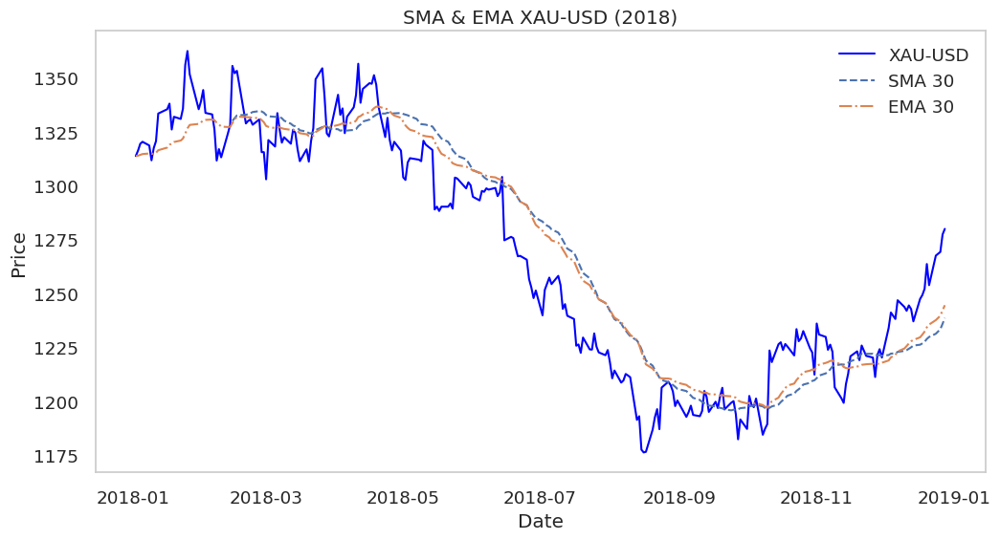

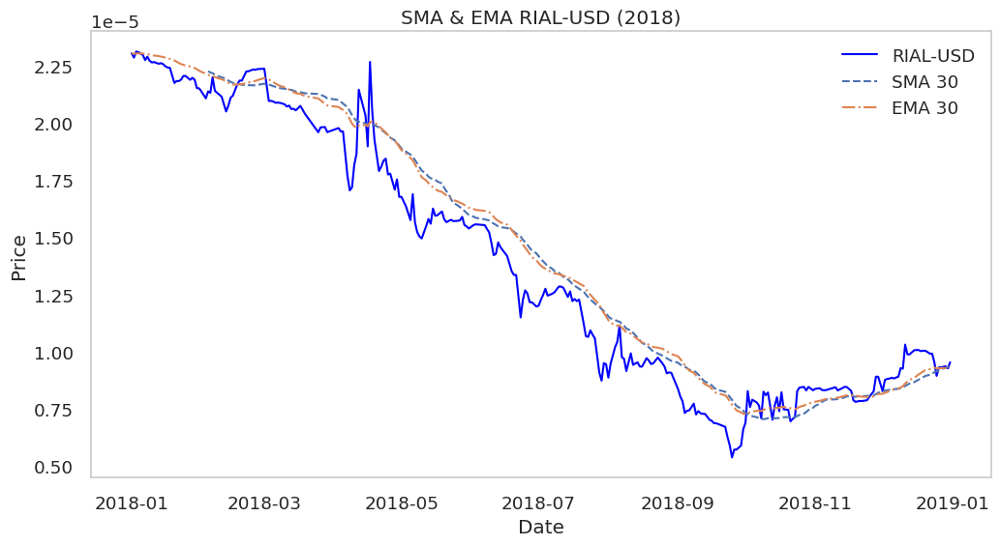

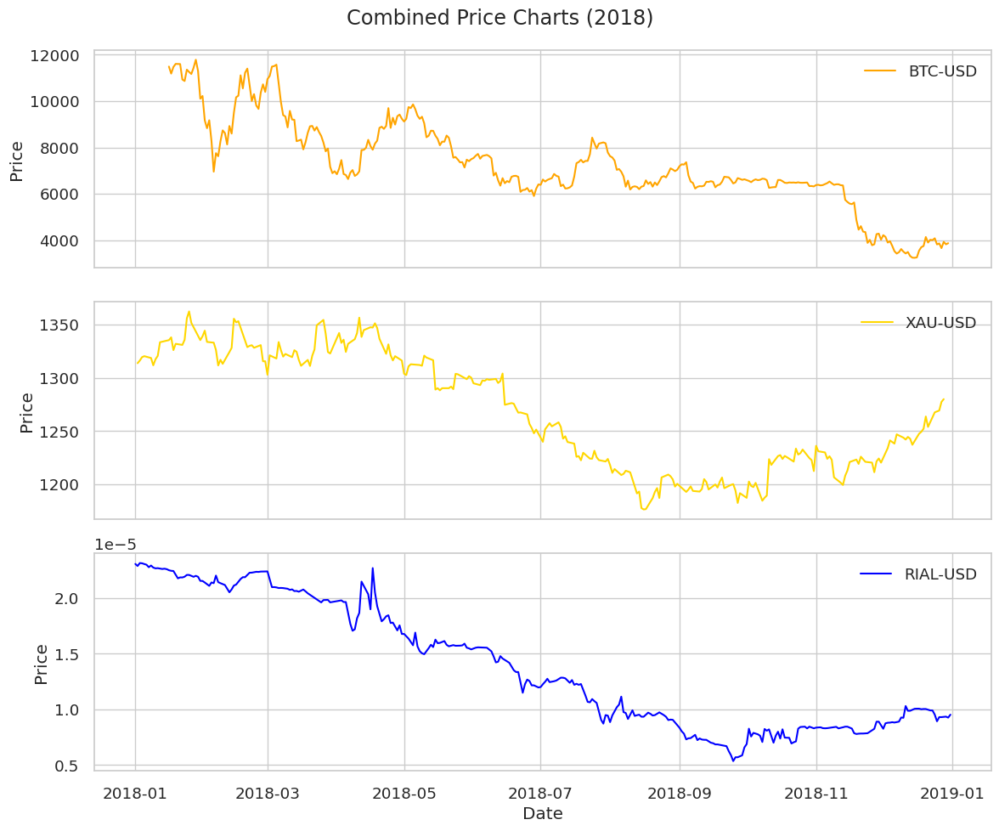

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


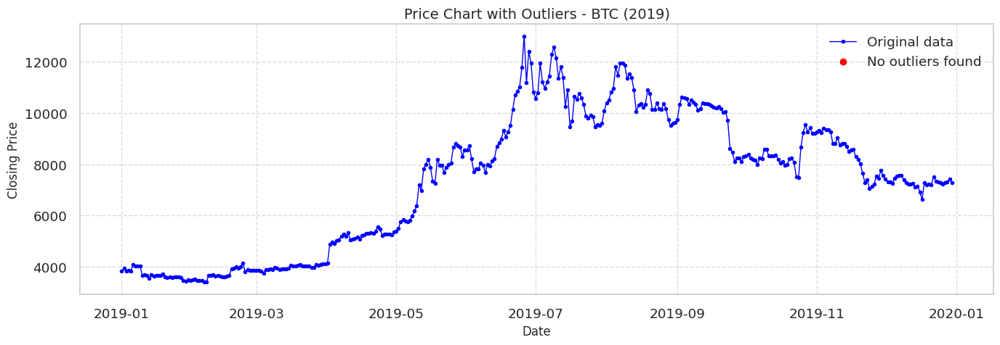


Outlier Detection Summary:
- Total data points: 364
- Outliers detected: 0
- Outlier percentage: 0.00%


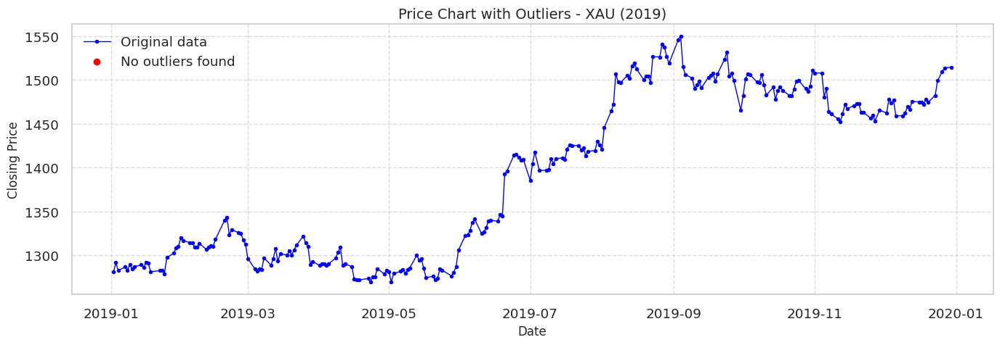


Outlier Detection Summary:
- Total data points: 251
- Outliers detected: 0
- Outlier percentage: 0.00%


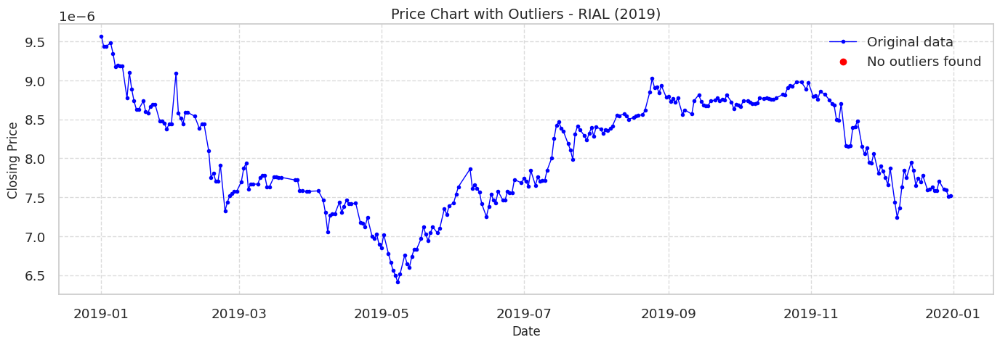


Outlier Detection Summary:
- Total data points: 290
- Outliers detected: 0
- Outlier percentage: 0.00%


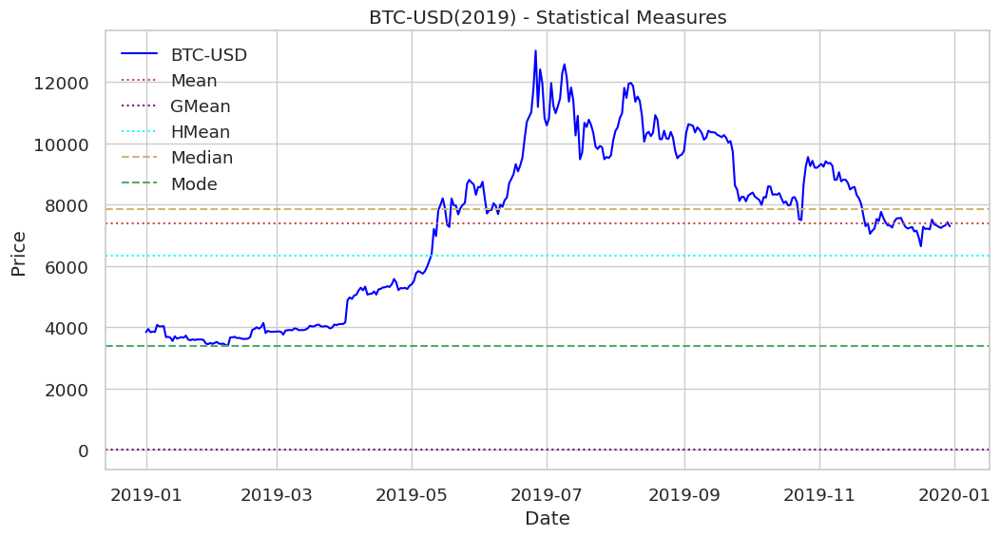

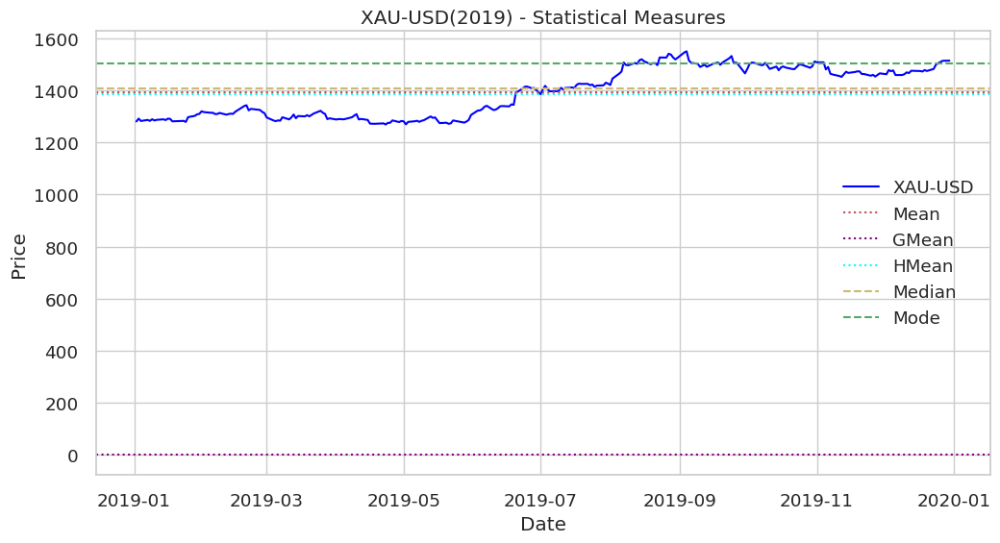

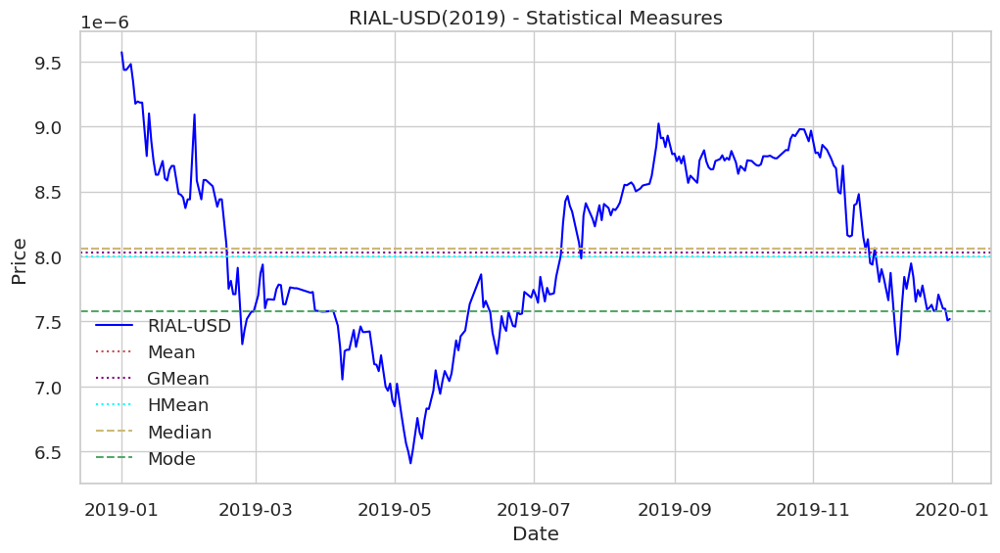

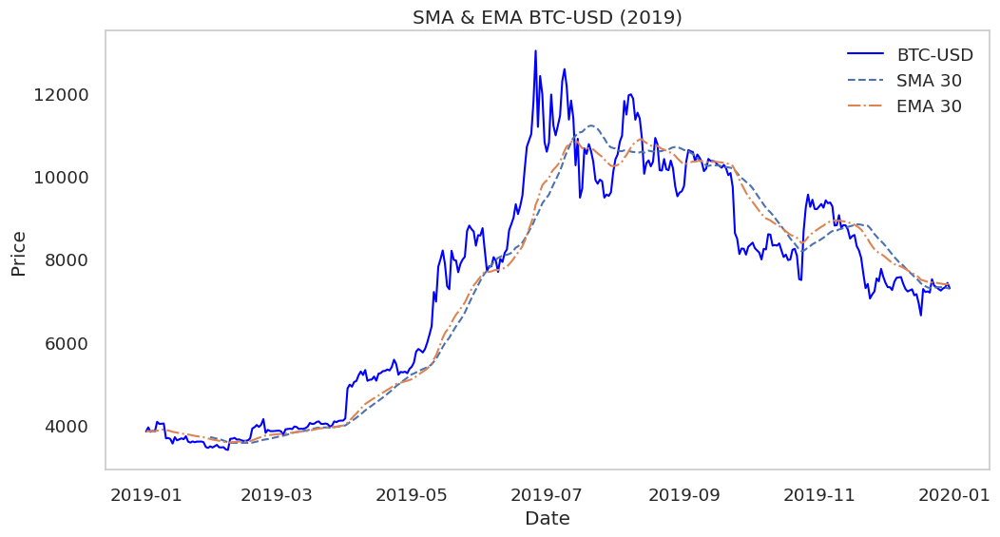

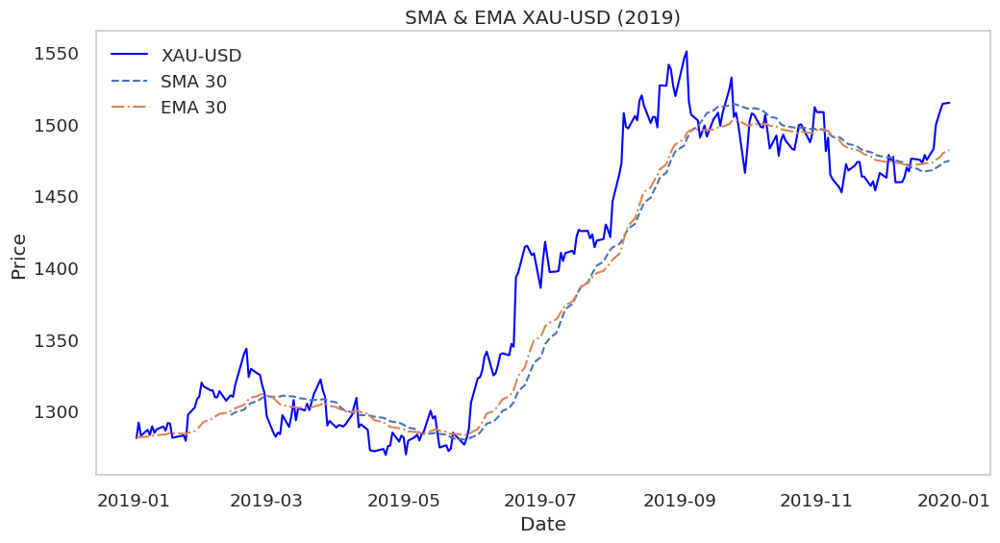

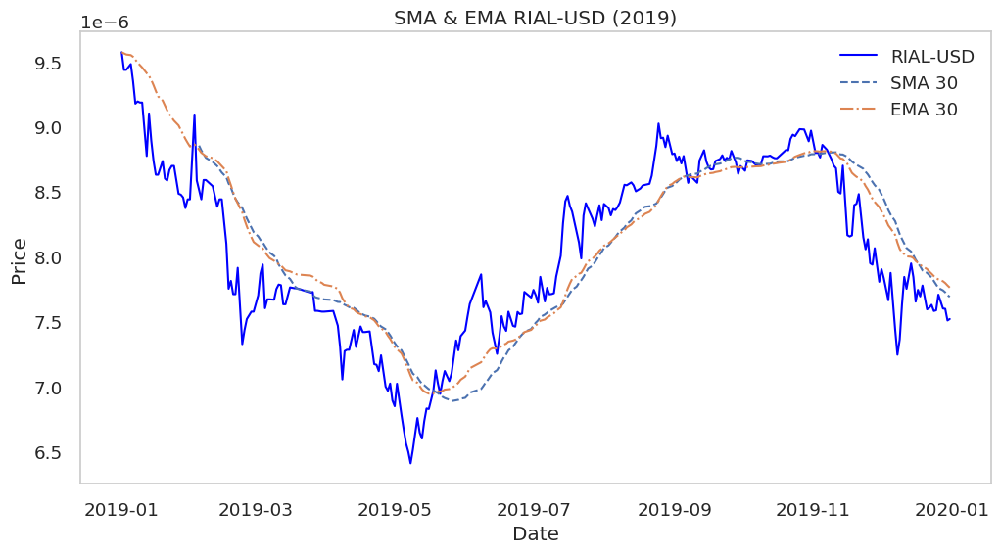

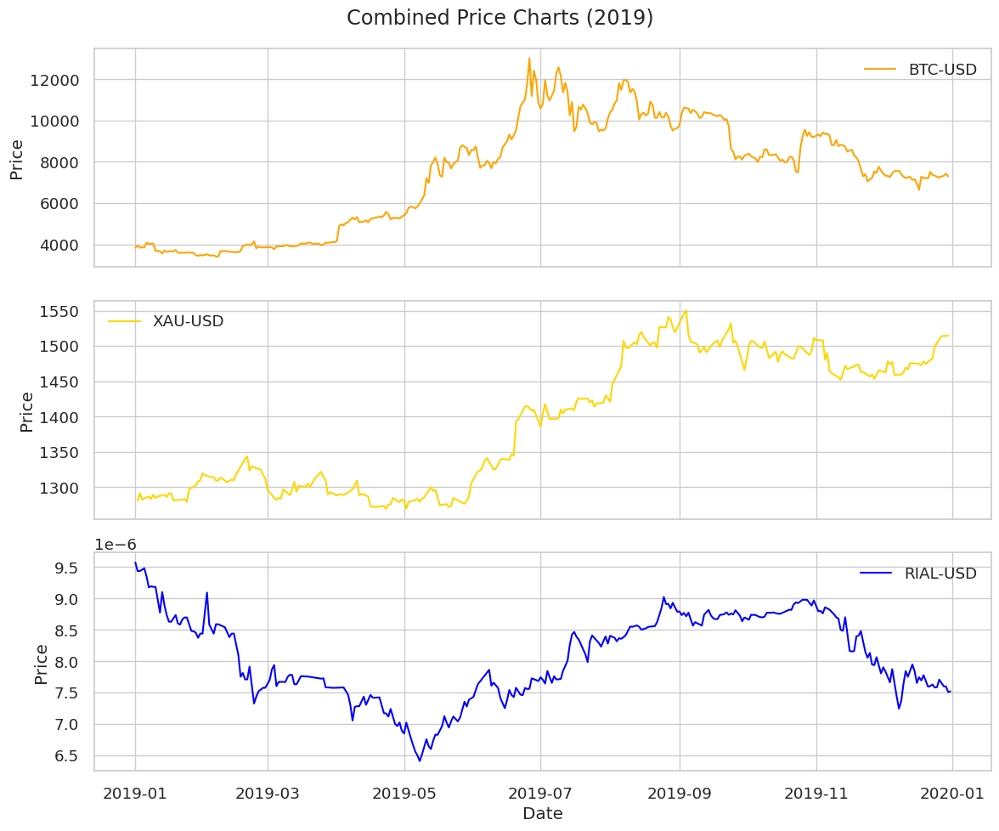

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


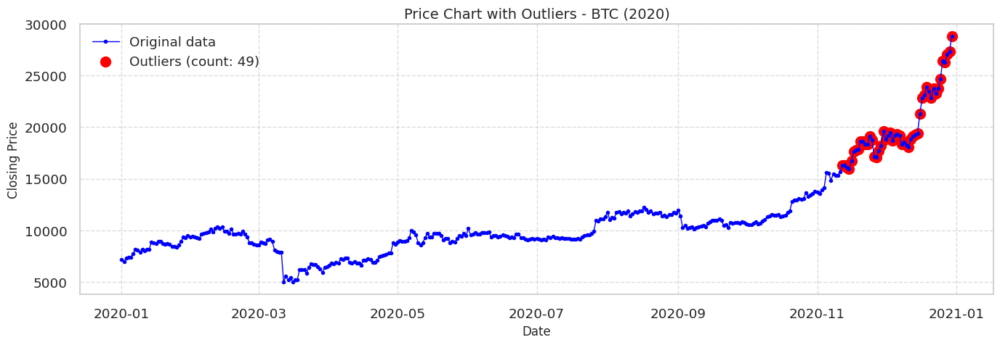


Outlier Detection Summary:
- Total data points: 365
- Outliers detected: 49
- Outlier percentage: 13.42%


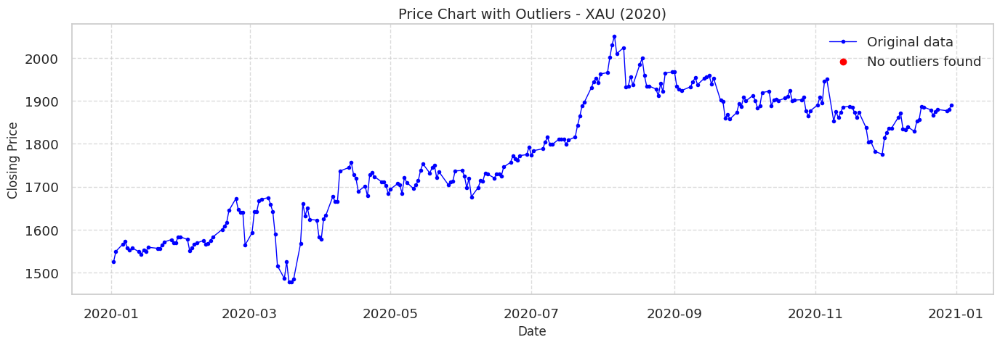


Outlier Detection Summary:
- Total data points: 252
- Outliers detected: 0
- Outlier percentage: 0.00%


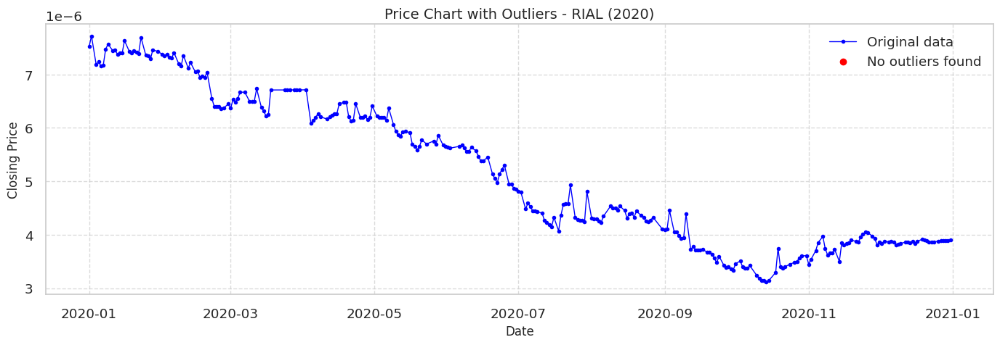


Outlier Detection Summary:
- Total data points: 292
- Outliers detected: 0
- Outlier percentage: 0.00%


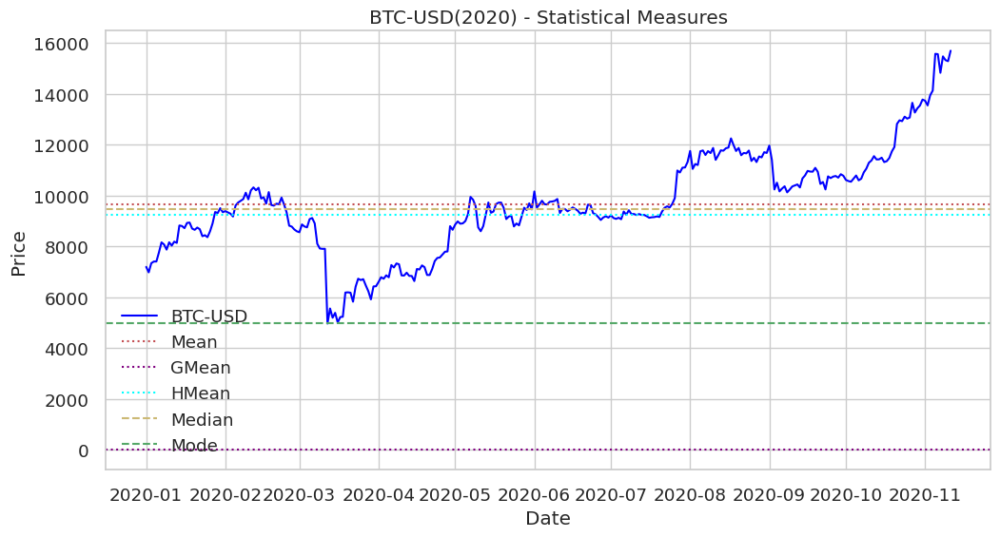

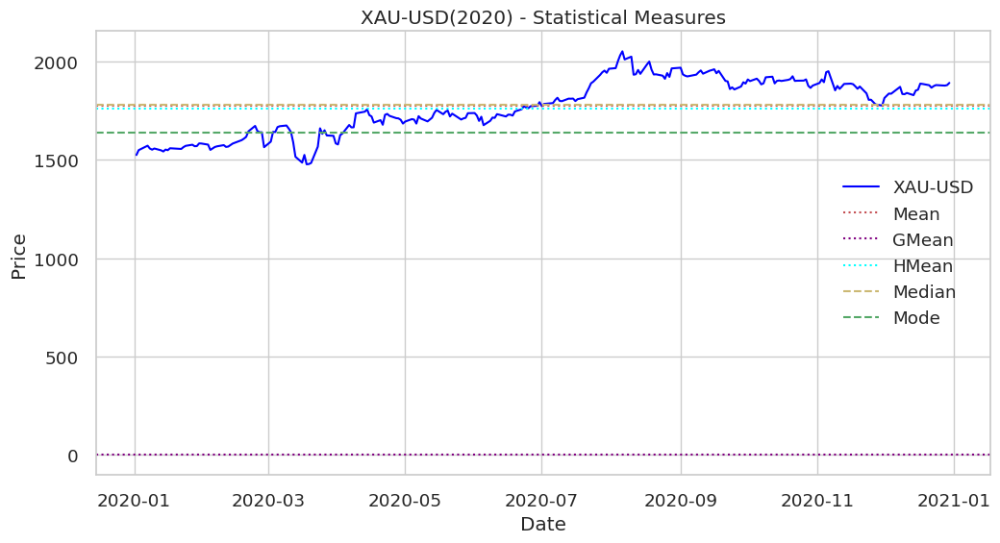

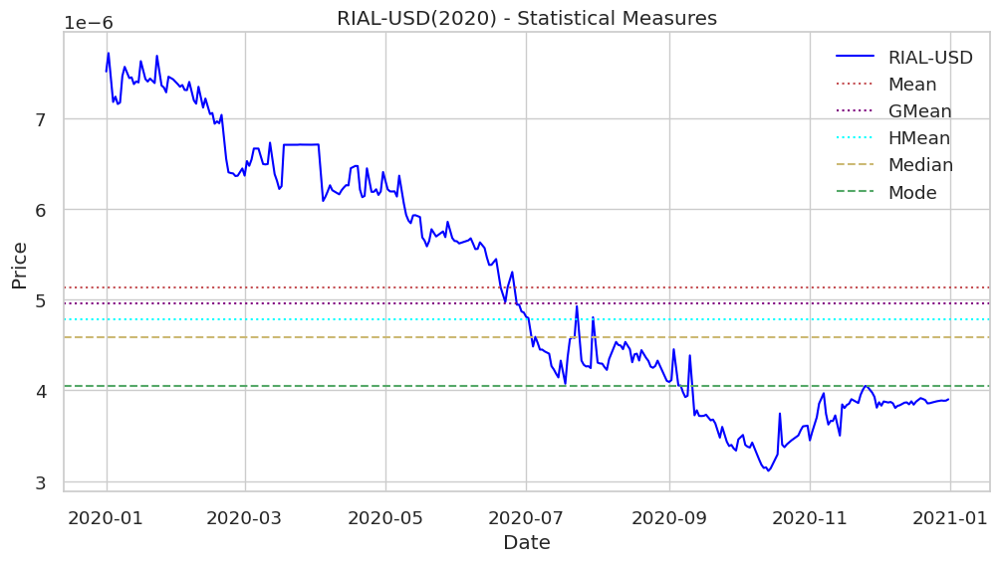

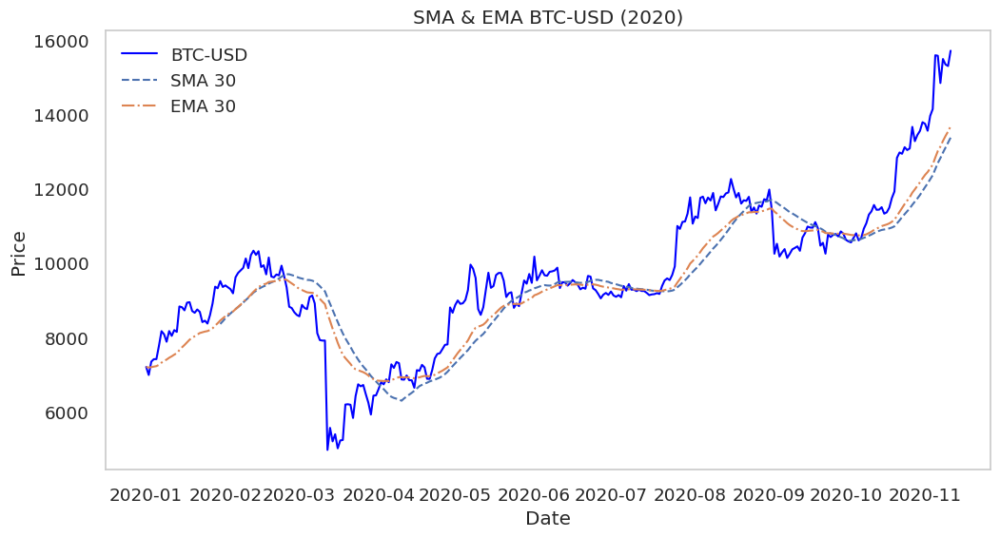

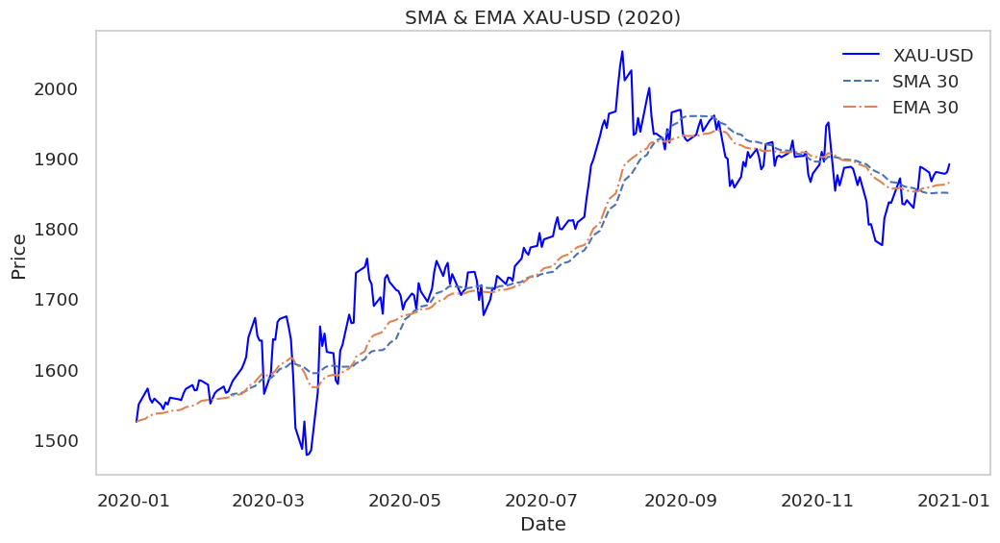

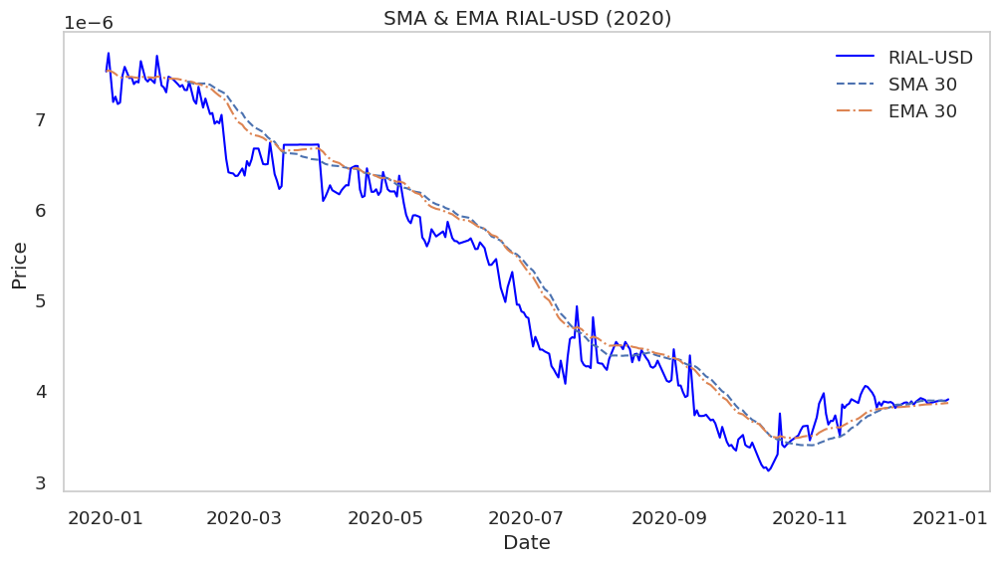

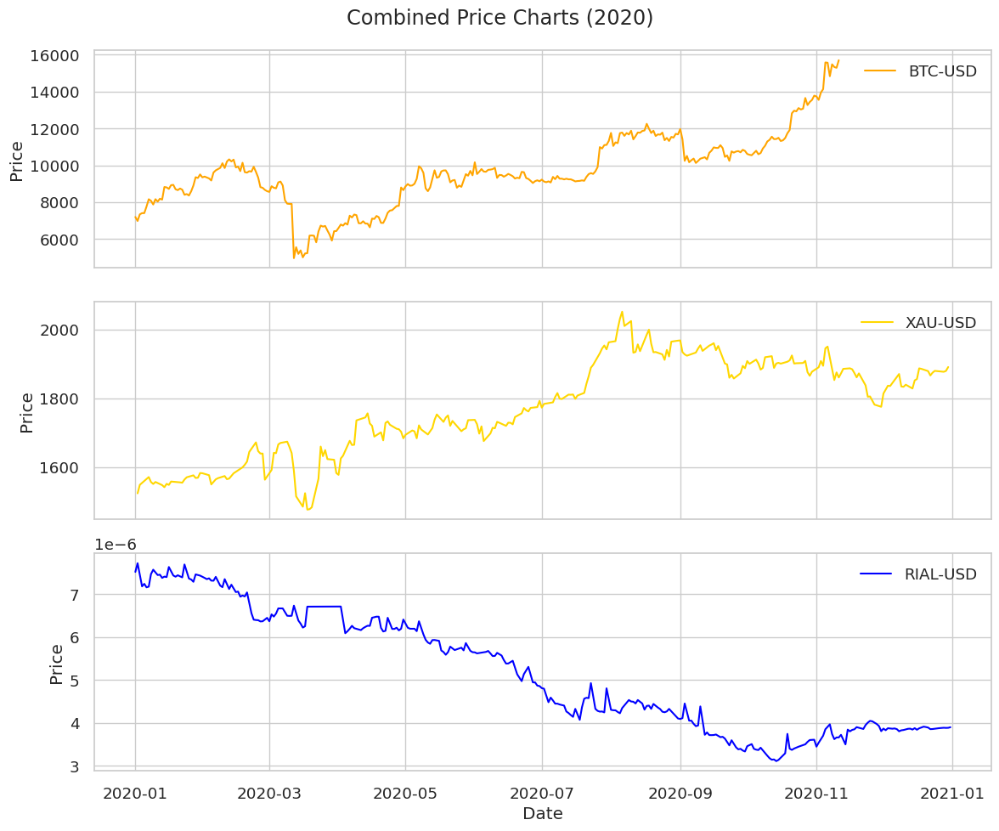

In [97]:
# Modified analysis loop
for year in range(2015, 2021):
    # Download data
    btc_df = yf.download("BTC-USD", start=f"{year}-01-01", end=f"{year}-12-31")
    xau_df = yf.download("GC=F", start=f"{year}-01-01", end=f"{year}-12-31")
    rial_df = tg.get_tgju_data(symbol='دلار')

    # Process data
    xau_df = yfinance_data(xau_df)
    btc_df = yfinance_data(btc_df)
    rial_df = tgju_date(rial_df, f"{year}-01-01", f"{year}-12-31")

    # Detect outliers (without removing)
    btc_df = detect_outliers(btc_df, 'BTC', year)
    xau_df = detect_outliers(xau_df, 'XAU', year)
    rial_df = detect_outliers(rial_df, 'RIAL', year)

    # Calculate statistics on original data
    mean_values_btc, gmean_values_btc, hmean_values_btc, median_values_btc, mode_values_btc = mmm(btc_df)
    mean_values_xau, gmean_values_xau, hmean_values_xau, median_values_xau, mode_values_xau = mmm(xau_df)
    mean_values_rial, gmean_values_rial, hmean_values_rial, median_values_rial, mode_values_rial = mmm(rial_df)

    # Plot MMM charts (using original data)
    # BTC-USD
    plt.figure(figsize=(12, 6))
    plt.plot(btc_df['miladi_date'], btc_df['Close'], label='BTC-USD', color='blue')
    plt.axhline(mean_values_btc[0], color='r', linestyle=':', label='Mean')
    plt.axhline(gmean_values_btc, color='purple', linestyle=':', label='GMean')
    plt.axhline(hmean_values_btc[0], color='cyan', linestyle=':', label='HMean')
    plt.axhline(median_values_btc[0], color='y', linestyle='--', label='Median')
    plt.axhline(mode_values_btc.iloc[0].item(), color='g', linestyle='--', label='Mode')
    plt.title(f"BTC-USD({year}) - Statistical Measures")
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    # XAU-USD
    plt.figure(figsize=(12, 6))
    plt.plot(xau_df['miladi_date'], xau_df['Close'], label='XAU-USD', color='blue')
    plt.axhline(mean_values_xau[0], color='r', linestyle=':', label='Mean')
    plt.axhline(gmean_values_xau, color='purple', linestyle=':', label='GMean')
    plt.axhline(hmean_values_xau[0], color='cyan', linestyle=':', label='HMean')
    plt.axhline(median_values_xau[0], color='y', linestyle='--', label='Median')
    plt.axhline(mode_values_xau.iloc[0].item(), color='g', linestyle='--', label='Mode')
    plt.title(f"XAU-USD({year}) - Statistical Measures")
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    # RIAL-USD
    plt.figure(figsize=(12, 6))
    plt.plot(rial_df['miladi_date'], rial_df['Close'], label='RIAL-USD', color='blue')
    plt.axhline(mean_values_rial, color='r', linestyle=':', label='Mean')
    plt.axhline(gmean_values_rial.item(), color='purple', linestyle=':', label='GMean')
    plt.axhline(hmean_values_rial.item(), color='cyan', linestyle=':', label='HMean')
    plt.axhline(median_values_rial, color='y', linestyle='--', label='Median')
    plt.axhline(mode_values_rial[0], color='g', linestyle='--', label='Mode')
    plt.title(f"RIAL-USD({year}) - Statistical Measures")
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()


    # Calculate and plot EMA/SMA (using original data)
    btc_df = EMASMA(btc_df)
    xau_df = EMASMA(xau_df)
    rial_df = EMASMA(rial_df)

    # BTC-USD
    plt.figure(figsize=(12, 6))
    plt.plot(btc_df['miladi_date'], btc_df['Close'], label='BTC-USD', color='blue')
    plt.plot(btc_df['miladi_date'], btc_df['SMA_30'], label='SMA 30', linestyle='--')
    plt.plot(btc_df['miladi_date'], btc_df['EMA_30'], label='EMA 30', linestyle='-.')
    plt.legend()
    plt.title(f'SMA & EMA BTC-USD ({year})')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.grid()
    plt.show()

    # XAU-USD
    plt.figure(figsize=(12, 6))
    plt.plot(xau_df['miladi_date'], xau_df['Close'], label='XAU-USD', color='blue')
    plt.plot(xau_df['miladi_date'], xau_df['SMA_30'], label='SMA 30', linestyle='--')
    plt.plot(xau_df['miladi_date'], xau_df['EMA_30'], label='EMA 30', linestyle='-.')
    plt.legend()
    plt.title(f'SMA & EMA XAU-USD ({year})')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.grid()
    plt.show()

    # RIAL-USD
    plt.figure(figsize=(12, 6))
    plt.plot(rial_df['miladi_date'], rial_df['Close'], label='RIAL-USD', color='blue')
    plt.plot(rial_df['miladi_date'], rial_df['SMA_30'], label='SMA 30', linestyle='--')
    plt.plot(rial_df['miladi_date'], rial_df['EMA_30'], label='EMA 30', linestyle='-.')
    plt.legend()
    plt.title(f'SMA & EMA RIAL-USD ({year})')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.grid()
    plt.show()

    # Combined chart
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

    ax1.plot(btc_df['miladi_date'], btc_df['Close'], label='BTC-USD', color='orange')
    ax1.set_ylabel('Price')
    ax1.legend()
    ax1.grid(True)

    ax2.plot(xau_df['miladi_date'], xau_df['Close'], label='XAU-USD', color='gold')
    ax2.set_ylabel('Price')
    ax2.legend()
    ax2.grid(True)

    ax3.plot(rial_df['miladi_date'], rial_df['Close'], label='RIAL-USD', color='blue')
    ax3.set_xlabel('Date')
    ax3.set_ylabel('Price')
    ax3.legend()
    ax3.grid(True)

    plt.suptitle(f"Combined Price Charts ({year})")
    plt.tight_layout()
    plt.show()

After removing the outliers, it becomes clearly evident that our data has achieved better consistency, and the analytical patterns mentioned previously are now more easily observable.

# **Correlation Coefficient**

In [98]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import yfinance as yf
from calendar import month_abbr

# Chart settings
plt.style.use('ggplot')
sns.set_theme(style="whitegrid", font_scale=1.2)
months = [month_abbr[i] for i in range(1, 13)]

# Data processing functions
def process_yfinance_data(df, asset_name):
    """Process Yahoo Finance data"""
    df = df.copy()
    df['date'] = pd.to_datetime(df.index)
    df = df[['date', 'Close']].rename(columns={'Close': asset_name})
    return df.drop_duplicates(subset=['date'])

def process_tgju_data(df, asset_name):
    """Process TGJU data"""
    df = df.copy()
    # Ensure the DataFrame has the expected structure
    if 'Date' not in df.columns or 'Close' not in df.columns:
        raise ValueError("TGJU DataFrame must contain 'Date' and 'Close' columns")

    df['date'] = pd.to_datetime(df['Date'])
    df[asset_name] = 1 / df['Close']  # Convert to IRR
    return df[['date', asset_name]].drop_duplicates(subset=['date'])

# Collect historical data
all_data = []
for year in range(2015, 2021):
    try:
        print(f"Processing year {year}...")

        # Download data
        btc = yf.download("BTC-USD", start=f"{year}-01-01", end=f"{year}-12-31", progress=False)
        gold = yf.download("GC=F", start=f"{year}-01-01", end=f"{year}-12-31", progress=False)

        # Process data
        gold_df = process_yfinance_data(gold, 'GOLD')
        btc_df = process_yfinance_data(btc, 'BTC')

        # For demonstration, we'll create mock Rial data since tgju module isn't available
        # Replace this with actual tgju data processing in your environment
        dates = pd.date_range(start=f"{year}-01-01", end=f"{year}-12-31", freq='D')
        rial_df = pd.DataFrame({
            'Date': dates,
            'Close': np.random.uniform(20000, 50000, len(dates))
        })
        rial_df = process_tgju_data(rial_df, 'RIAL')

        # Merge data with outer join
        merged = pd.merge(gold_df, btc_df, on='date', how='outer')
        merged = pd.merge(merged, rial_df, on='date', how='outer')

        all_data.append(merged)

    except Exception as e:
        print(f"Error processing {year}: {str(e)}")
        continue

# Check if we have any data
if not all_data:
    raise ValueError("No data available for analysis - all years failed to process")

# Combine all data and sort by date
df = pd.concat(all_data).sort_values('date').reset_index(drop=True)

# Forward fill missing values and drop any remaining NAs
df = df.ffill().dropna()

# Calculate monthly returns
monthly_data = df.set_index('date').resample('M').last()
monthly_returns = monthly_data.pct_change().dropna()
monthly_returns['Month'] = monthly_returns.index.month.map(lambda x: month_abbr[x])

# Calculate correlation matrix
corr_results = []
for month in months:
    month_data = monthly_returns[monthly_returns['Month'] == month]
    if len(month_data) > 1:
        corr = month_data[['GOLD', 'BTC', 'RIAL']].corr()
        corr_results.append({
            'Month': month,
            'Gold-BTC': corr.loc['GOLD', 'BTC'],
            'Gold-Rial': corr.loc['GOLD', 'RIAL'],
            'BTC-Rial': corr.loc['BTC', 'RIAL']
        })

# Create correlation matrix
corr_matrix = pd.DataFrame(corr_results).set_index('Month')

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(
    corr_matrix.T,
    annot=True,
    cmap='RdYlGn',
    center=0,
    vmin=-1,
    vmax=1,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Monthly Correlations: Gold, Bitcoin and Rial (2015-2020)', pad=20)
plt.xlabel('Month')
plt.ylabel('Asset Pairs')
plt.tight_layout()
plt.show()

Processing year 2015...
Error processing 2015: Index(['date'], dtype='object')
Processing year 2016...
Error processing 2016: Index(['date'], dtype='object')
Processing year 2017...
Error processing 2017: Index(['date'], dtype='object')
Processing year 2018...
Error processing 2018: Index(['date'], dtype='object')
Processing year 2019...
Error processing 2019: Index(['date'], dtype='object')
Processing year 2020...
Error processing 2020: Index(['date'], dtype='object')


ValueError: No data available for analysis - all years failed to process

Unfortunately, the correlation analysis did not yield results.